In [1]:
!pip install rdkit

In [2]:
!pip install rdkit-pypi
!pip install matplotlib

In [3]:
!pip install torch

In [4]:
!pip install torch_geometric

In [5]:
!pip install torchvision

In [6]:
!pip install pytorch-lightning

In [7]:
!pip install deepchem

In [8]:
!pip install pytorch-lightning

In [9]:
# Import necessary libraries
import pandas as pd
from rdkit import Chem
from rdkit.Chem import rdchem
import torch
from torch_geometric.data import Data


In [10]:
import os
import csv
import glob
import torch
import numpy as np
import networkx as nx
from torch_geometric.data import Data

In [11]:
from typing import List, Tuple
import numpy as np

from deepchem.utils.typing import RDKitAtom, RDKitBond, RDKitMol
from deepchem.feat.graph_data import GraphData
from deepchem.feat.base_classes import MolecularFeaturizer
from deepchem.utils.molecule_feature_utils import one_hot_encode
from deepchem.utils.molecule_feature_utils import get_atom_type_one_hot
from deepchem.utils.molecule_feature_utils import construct_hydrogen_bonding_info
from deepchem.utils.molecule_feature_utils import get_atom_hydrogen_bonding_one_hot
from deepchem.utils.molecule_feature_utils import get_atom_hybridization_one_hot
from deepchem.utils.molecule_feature_utils import get_atom_total_num_Hs_one_hot
from deepchem.utils.molecule_feature_utils import get_atom_is_in_aromatic_one_hot
from deepchem.utils.molecule_feature_utils import get_atom_chirality_one_hot
from deepchem.utils.molecule_feature_utils import get_atom_formal_charge
from deepchem.utils.molecule_feature_utils import get_atom_partial_charge
from deepchem.utils.molecule_feature_utils import get_atom_total_degree_one_hot
from deepchem.utils.molecule_feature_utils import get_bond_type_one_hot
from deepchem.utils.molecule_feature_utils import get_bond_is_in_same_ring_one_hot
from deepchem.utils.molecule_feature_utils import get_bond_is_conjugated_one_hot
from deepchem.utils.molecule_feature_utils import get_bond_stereo_one_hot

In [12]:
# from deepchem.utils.molecule_feature_utils import get_atom_formal_charge_one_hot
# from deepchem.utils.molecule_feature_utils import get_atom_implicit_valence_one_hot
# from deepchem.utils.molecule_feature_utils import get_atom_explicit_valence_one_hot
# from deepchem.utils.rdkit_utils import compute_all_pairs_shortest_path
# from deepchem.utils.rdkit_utils import compute_pairwise_ring_info

In [13]:
from rdkit import Chem
from rdkit.Chem import AllChem

In [14]:
DEFAULT_ATOM_TYPE_SET = [
    "C",
    "N",
    "O",
    "F",
    "P",
    "S",
    "Cl",
    "Br",
    "I",
]
DEFAULT_HYBRIDIZATION_SET = ["SP", "SP2", "SP3"]
DEFAULT_TOTAL_NUM_Hs_SET = [0, 1, 2, 3, 4]
DEFAULT_FORMAL_CHARGE_SET = [-2, -1, 0, 1, 2]
DEFAULT_TOTAL_DEGREE_SET = [0, 1, 2, 3, 4, 5]
DEFAULT_RING_SIZE_SET = [3, 4, 5, 6, 7, 8]
DEFAULT_BOND_TYPE_SET = ["SINGLE", "DOUBLE", "TRIPLE", "AROMATIC"]
DEFAULT_BOND_STEREO_SET = ["STEREONONE", "STEREOANY", "STEREOZ", "STEREOE"]
DEFAULT_GRAPH_DISTANCE_SET = [1, 2, 3, 4, 5, 6, 7]
DEFAULT_ATOM_IMPLICIT_VALENCE_SET = [0, 1, 2, 3, 4, 5, 6]
DEFAULT_ATOM_EXPLICIT_VALENCE_SET = [1, 2, 3, 4, 5, 6]

USER_ATOM_TYPE_SET  = ['C', 'N', 'O', 'S', 'F', 'Si', 'P', 'Cl', 'Br', 'Mg', 'Na', 'Ca',
       'Fe', 'As', 'Al', 'I', 'B', 'V', 'K', 'Tl', 'Yb', 'Sb', 'Sn', 'Ag',
       'Pd', 'Co', 'Se', 'Ti', 'Zn', 'H', 'Li', 'Ge', 'Cu', 'Au', 'Ni',
       'Cd', 'In', 'Mn', 'Zr', 'Cr', 'Pt', 'Hg', 'Pb']
USER_TOTAL_DEGREE_SET = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
USER_HYBRIDIZATION_SET = ["SP", "SP2", "SP3", 'SP3D','SP3D2']

In [15]:
def one_hot_encode(value, allowed_values, include_unknown_set=False):
    """Create a one-hot encoded vector based on allowed values."""
    if include_unknown_set and value not in allowed_values:
        value = allowed_values[-1]

    return [1.0 if v == value else 0.0 for v in allowed_values]


In [16]:
from rdkit import Chem
from rdkit.Chem import AllChem
import numpy as np
import torch
from torch_geometric.data import Data

class MolGraphConvFeaturizer:
    def __init__(self, use_edges=True, use_chirality=True, use_partial_charge=True):
        self.use_edges = use_edges
        self.use_chirality = use_chirality
        self.use_partial_charge = use_partial_charge

    def featurize(self, smiles):
        # Convert SMILES to RDKit Mol object
        mol = Chem.MolFromSmiles(smiles)
        if mol is None:
            return None

        # Compute Gasteiger charges if necessary
        if self.use_partial_charge:
            try:
                AllChem.ComputeGasteigerCharges(mol)
            except:
                return None  # Unable to compute charges for this molecule

        # Get atom features
        atom_features = np.array([self._get_atom_features(atom) for atom in mol.GetAtoms()])

        # Get bond features and indices
        if self.use_edges:
            edge_indices, edge_features = self._get_bond_features(mol)
        else:
            edge_indices, edge_features = None, None

        # Create a graph data object
        graph = Data(x=torch.tensor(atom_features, dtype=torch.float),
                     edge_index=torch.tensor(edge_indices, dtype=torch.long).t().contiguous() if edge_indices is not None else None,
                     edge_attr=torch.tensor(edge_features, dtype=torch.float) if edge_features is not None else None)

        return graph

    def _get_atom_features(self, atom):
        # One-hot encoding of atom type
        atom_type = one_hot_encode(atom.GetSymbol(), USER_ATOM_TYPE_SET, include_unknown_set=True)

        # Formal charge of the atom
        formal_charge = get_atom_formal_charge(atom)

        # One-hot encoding of the atom's hybridization
        hybridization = get_atom_hybridization_one_hot(atom, USER_HYBRIDIZATION_SET, include_unknown_set=True)

        # Aromaticity of the atom
        aromatic = get_atom_is_in_aromatic_one_hot(atom)

        # One-hot encoding of the atom's degree
        degree = get_atom_total_degree_one_hot(atom, USER_TOTAL_DEGREE_SET, include_unknown_set=True)

        # One-hot encoding of the total number of hydrogens connected to the atom
        total_num_Hs = get_atom_total_num_Hs_one_hot(atom, DEFAULT_TOTAL_NUM_Hs_SET, include_unknown_set=True)

        # Concatenating all the features
        atom_feat = np.concatenate([
            atom_type, formal_charge, hybridization, aromatic, degree, total_num_Hs
        ])

        if self.use_chirality:
            chirality = get_atom_chirality_one_hot(atom)
            atom_feat = np.concatenate([atom_feat, chirality])

        if self.use_partial_charge:
            partial_charge = get_atom_partial_charge(atom)
            atom_feat = np.concatenate([atom_feat, partial_charge])

        return atom_feat

    def _get_bond_features(self, mol):
        # Initialize lists for source and destination atoms of each bond
        src, dest, bond_features = [], [], []

        for bond in mol.GetBonds():
            start, end = bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()
            src += [start, end]
            dest += [end, start]

            # Extract bond features and duplicate for both bond directions
            bond_feat = self._extract_bond_features(bond)
            bond_features += [bond_feat, bond_feat]

        edge_indices = [src, dest]
        #print("edge_indices : ",edge_indices)
        #print("bond_features : ",bond_features)
        return edge_indices, bond_features
        
    def _extract_bond_features(self, bond):
        """
        Extract bond features from a RDKit bond object.
        """

        # One-hot encoding of bond type
        bond_type = one_hot_encode(bond.GetBondTypeAsDouble(), [1.0, 1.5, 2.0, 3.0], include_unknown_set=True)

        # Whether the bond is in the same ring
        same_ring = [1.0] if bond.IsInRing() else [0.0]

        # Whether the bond is conjugated
        conjugated = [1.0] if bond.GetIsConjugated() else [0.0]

        # One-hot encoding of bond stereo configuration
        stereo = one_hot_encode(bond.GetStereo(), [Chem.rdchem.BondStereo.STEREONONE, 
                                                   Chem.rdchem.BondStereo.STEREOANY, 
                                                   Chem.rdchem.BondStereo.STEREOZ, 
                                                   Chem.rdchem.BondStereo.STEREOE], 
                                include_unknown_set=True)

        # Concatenate all bond features
        bond_feat = np.concatenate([bond_type, same_ring, conjugated, stereo])

        return bond_feat        


In [17]:
# Example usage
#featurizer = MolGraphConvFeaturizer()
#graph = featurizer.featurize('CCO')  # Example SMILES string
#print(type(graph))
#print((graph))

In [18]:
## Assuming graphs[0] is a torch_geometric.data.Data object from your graphs list

## Print node features
#print("Len of graph:", len(graph))
#print("Node Features:")
#for i, node_feature in enumerate(graph.x):
#    print(f"Node {i}: {node_feature}")

## Print edge pairs and edge features
#print("\nEdge Pairs and Features:")
#for i, edge in enumerate(graph.edge_index.t()):
#    src, dest = edge[0].item(), edge[1].item()
#    edge_feature = graph.edge_attr[i]
#    print(f"Edge {i} - Source: {src}, Destination: {dest}, Features: {edge_feature}")


In [19]:
#graph.is_directed()

In [20]:
import networkx as nx
import matplotlib.pyplot as plt
import torch

def visualize_graph(data):
    # Create a networkx graph
    G = nx.Graph()

    # Add nodes to the graph
    for i in range(data.num_nodes):
        G.add_node(i)

    # Add edges to the graph
    edge_index = data.edge_index.t().cpu().numpy()
    for edge in edge_index:
        src, dest = edge[0], edge[1]
        G.add_edge(src, dest)

    # Draw the graph
    pos = nx.spring_layout(G)  # positions for all nodes
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=500, edge_color='gray')
    plt.title("Graph Visualization")
    plt.show()
#visualize_graph(graph)

In [21]:
# Load the data 
#smiles_df = pd.read_csv("D:\\PhD\\Chapter3\\Unsupervised_GAN_Code\\pubchem-41-clean.txt", header=None, names=['SMILES'])
#smiles_df = pd.read_csv("D:\\PhD\\Chapter3\\Unsupervised_GAN_Code\\pubchem-10m-clean.txt", header=None, names=['SMILES'])
#smiles_df = pd.read_csv("D:\\PhD\\Chapter3\\Unsupervised_GAN_Code\\pubchem-10m-clean_test.txt", header=None, names=['SMILES'])
smiles_df = pd.read_csv("D:\\PhD\\Chapter3\\Unsupervised_GAN_Code\\pubchem-10m-clean_test50k.txt", header=None, names=['SMILES'])


In [22]:
smiles_df.head(5)

,SMILES
0,CN(c1ccccc1)c1ccccc1C(=O)NCC1(O)CCOCC1
1,CC[NH+](CC)C1CCC([NH2+]C2CC2)(C(=O)[O-])C1
2,COCC(CNC(=O)c1ccc2c(c1)NC(=O)C2)OC
3,OCCn1cc(CNc2cccc3c2CCCC3)nn1
4,CCCCCCc1ccc(C#Cc2ccc(C#CC3=CC=C(CCC)CC3)c(C3CC...


In [23]:
# Define a function to convert a SMILES string to a graph data object
def smiles_to_graph(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None

    # Get atom features
    atom_features = []
    for atom in mol.GetAtoms():
        atom_features.append(atom.GetAtomicNum())

    # Get bond features and adjacency information
    edge_indices = []
    edge_features = []
    for bond in mol.GetBonds():
        start, end = bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()
        edge_indices += [(start, end), (end, start)]
        edge_feature = [bond.GetBondTypeAsDouble()]
        edge_features += [edge_feature, edge_feature]  # add twice for both directions

    # Convert to tensors
    x = torch.tensor(atom_features, dtype=torch.float).view(-1, 1)
    edge_index = torch.tensor(edge_indices, dtype=torch.long).t().contiguous()
    edge_attr = torch.tensor(edge_features, dtype=torch.float)

    # Create a graph data object
    data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr)
    return data


In [24]:
def read_smiles_df_check(smiles_df):
    graphs = []
    invalid_indices = []
    for idx, smiles in enumerate(smiles_df['SMILES']):
        graph = smiles_to_graph(smiles)
        if graph:
            graphs.append(graph)
        else:
            print("Invalid graph :", idx,smiles)
            invalid_indices.append(idx)
    return graphs, invalid_indices

graphs, invalid_indices = read_smiles_df_check(smiles_df)
print(f"Number of valid graphs: {len(graphs)}")
print(f"Indices of invalid SMILES: {invalid_indices}")

Number of valid graphs: 50001
Indices of invalid SMILES: []


In [25]:
# Check lengths after removal
print("Length of smiles_df:", len(smiles_df))


Length of smiles_df: 50001


In [26]:
# Initialize the featurizer
featurizer = MolGraphConvFeaturizer(use_edges=True, use_chirality=True, use_partial_charge=True)

# Featurize SMILES strings and track invalid entries
graphs = []
invalid_indices = []
for idx, smiles in enumerate(smiles_df['SMILES']):
    print(idx)
    graph = featurizer.featurize(smiles)
    graphs.append(graph)    
    
#    try:
#        graph = featurizer.featurize(smiles)
#        graphs.append(graph)
#    except Exception as e:
#        print(f"Invalid SMILES at index {idx}: {smiles} (Error: {e})")
#        invalid_indices.append(idx)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42


C:\Users\Malli\AppData\Local\Temp\ipykernel_22860\3029635957.py:38: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ..\torch\csrc\utils\tensor_new.cpp:264.)
  edge_attr=torch.tensor(edge_features, dtype=torch.float) if edge_features is not None else None)


43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
3

1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2147
2148
2149
2150
2151
2152
2153
2154
2155
2156
2157
2158
2159
2160
2161
2162
2163
2164
2165


3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711
3712
3713
3714
3715
3716
3717
3718
3719
3720
3721
3722
3723
3724
3725
3726
3727
3728
3729
3730
3731
3732
3733
3734
3735
3736
3737
3738
3739
3740
3741
3742
3743
3744
3745
3746
3747
3748
3749
3750
3751
3752
3753
3754
3755
3756
3757
3758
3759
3760
3761
3762
3763
3764
3765
3766
3767
3768
3769
3770
3771
3772
3773
3774
3775
3776
3777
3778
3779
3780
3781
3782
3783
3784
3785
3786
3787
3788
3789
3790
3791
3792
3793
3794
3795
3796
3797
3798
3799
3800
3801
3802
3803
3804
3805
3806
3807
3808
3809
3810
3811
3812
3813
3814
3815
3816
3817
3818
3819
3820
3821
3822
3823
3824
3825
3826
3827
3828
3829
3830
3831
3832
3833
3834
3835
3836
3837
3838
3839
3840
3841
3842
3843
3844
3845
3846
3847
3848
3849
3850
3851
3852
3853
3854
3855
3856
3857
3858
3859
3860
3861
3862
3863
3864
3865
3866
3867
3868
3869
3870
3871
3872
3873
3874
3875
3876
3877
3878
3879
3880
3881
3882
3883


5350
5351
5352
5353
5354
5355
5356
5357
5358
5359
5360
5361
5362
5363
5364
5365
5366
5367
5368
5369
5370
5371
5372
5373
5374
5375
5376
5377
5378
5379
5380
5381
5382
5383
5384
5385
5386
5387
5388
5389
5390
5391
5392
5393
5394
5395
5396
5397
5398
5399
5400
5401
5402
5403
5404
5405
5406
5407
5408
5409
5410
5411
5412
5413
5414
5415
5416
5417
5418
5419
5420
5421
5422
5423
5424
5425
5426
5427
5428
5429
5430
5431
5432
5433
5434
5435
5436
5437
5438
5439
5440
5441
5442
5443
5444
5445
5446
5447
5448
5449
5450
5451
5452
5453
5454
5455
5456
5457
5458
5459
5460
5461
5462
5463
5464
5465
5466
5467
5468
5469
5470
5471
5472
5473
5474
5475
5476
5477
5478
5479
5480
5481
5482
5483
5484
5485
5486
5487
5488
5489
5490
5491
5492
5493
5494
5495
5496
5497
5498
5499
5500
5501
5502
5503
5504
5505
5506
5507
5508
5509
5510
5511
5512
5513
5514
5515
5516
5517
5518
5519
5520
5521
5522
5523
5524
5525
5526
5527
5528
5529
5530
5531
5532
5533
5534
5535
5536
5537
5538
5539
5540
5541
5542
5543
5544
5545
5546
5547
5548
5549


7046
7047
7048
7049
7050
7051
7052
7053
7054
7055
7056
7057
7058
7059
7060
7061
7062
7063
7064
7065
7066
7067
7068
7069
7070
7071
7072
7073
7074
7075
7076
7077
7078
7079
7080
7081
7082
7083
7084
7085
7086
7087
7088
7089
7090
7091
7092
7093
7094
7095
7096
7097
7098
7099
7100
7101
7102
7103
7104
7105
7106
7107
7108
7109
7110
7111
7112
7113
7114
7115
7116
7117
7118
7119
7120
7121
7122
7123
7124
7125
7126
7127
7128
7129
7130
7131
7132
7133
7134
7135
7136
7137
7138
7139
7140
7141
7142
7143
7144
7145
7146
7147
7148
7149
7150
7151
7152
7153
7154
7155
7156
7157
7158
7159
7160
7161
7162
7163
7164
7165
7166
7167
7168
7169
7170
7171
7172
7173
7174
7175
7176
7177
7178
7179
7180
7181
7182
7183
7184
7185
7186
7187
7188
7189
7190
7191
7192
7193
7194
7195
7196
7197
7198
7199
7200
7201
7202
7203
7204
7205
7206
7207
7208
7209
7210
7211
7212
7213
7214
7215
7216
7217
7218
7219
7220
7221
7222
7223
7224
7225
7226
7227
7228
7229
7230
7231
7232
7233
7234
7235
7236
7237
7238
7239
7240
7241
7242
7243
7244
7245


8787
8788
8789
8790
8791
8792
8793
8794
8795
8796
8797
8798
8799
8800
8801
8802
8803
8804
8805
8806
8807
8808
8809
8810
8811
8812
8813
8814
8815
8816
8817
8818
8819
8820
8821
8822
8823
8824
8825
8826
8827
8828
8829
8830
8831
8832
8833
8834
8835
8836
8837
8838
8839
8840
8841
8842
8843
8844
8845
8846
8847
8848
8849
8850
8851
8852
8853
8854
8855
8856
8857
8858
8859
8860
8861
8862
8863
8864
8865
8866
8867
8868
8869
8870
8871
8872
8873
8874
8875
8876
8877
8878
8879
8880
8881
8882
8883
8884
8885
8886
8887
8888
8889
8890
8891
8892
8893
8894
8895
8896
8897
8898
8899
8900
8901
8902
8903
8904
8905
8906
8907
8908
8909
8910
8911
8912
8913
8914
8915
8916
8917
8918
8919
8920
8921
8922
8923
8924
8925
8926
8927
8928
8929
8930
8931
8932
8933
8934
8935
8936
8937
8938
8939
8940
8941
8942
8943
8944
8945
8946
8947
8948
8949
8950
8951
8952
8953
8954
8955
8956
8957
8958
8959
8960
8961
8962
8963
8964
8965
8966
8967
8968
8969
8970
8971
8972
8973
8974
8975
8976
8977
8978
8979
8980
8981
8982
8983
8984
8985
8986


10454
10455
10456
10457
10458
10459
10460
10461
10462
10463
10464
10465
10466
10467
10468
10469
10470
10471
10472
10473
10474
10475
10476
10477
10478
10479
10480
10481
10482
10483
10484
10485
10486
10487
10488
10489
10490
10491
10492
10493
10494
10495
10496
10497
10498
10499
10500
10501
10502
10503
10504
10505
10506
10507
10508
10509
10510
10511
10512
10513
10514
10515
10516
10517
10518
10519
10520
10521
10522
10523
10524
10525
10526
10527
10528
10529
10530
10531
10532
10533
10534
10535
10536
10537
10538
10539
10540
10541
10542
10543
10544
10545
10546
10547
10548
10549
10550
10551
10552
10553
10554
10555
10556
10557
10558
10559
10560
10561
10562
10563
10564
10565
10566
10567
10568
10569
10570
10571
10572
10573
10574
10575
10576
10577
10578
10579
10580
10581
10582
10583
10584
10585
10586
10587
10588
10589
10590
10591
10592
10593
10594
10595
10596
10597
10598
10599
10600
10601
10602
10603
10604
10605
10606
10607
10608
10609
10610
10611
10612
10613
10614
10615
10616
10617
10618
10619
1062

11865
11866
11867
11868
11869
11870
11871
11872
11873
11874
11875
11876
11877
11878
11879
11880
11881
11882
11883
11884
11885
11886
11887
11888
11889
11890
11891
11892
11893
11894
11895
11896
11897
11898
11899
11900
11901
11902
11903
11904
11905
11906
11907
11908
11909
11910
11911
11912
11913
11914
11915
11916
11917
11918
11919
11920
11921
11922
11923
11924
11925
11926
11927
11928
11929
11930
11931
11932
11933
11934
11935
11936
11937
11938
11939
11940
11941
11942
11943
11944
11945
11946
11947
11948
11949
11950
11951
11952
11953
11954
11955
11956
11957
11958
11959
11960
11961
11962
11963
11964
11965
11966
11967
11968
11969
11970
11971
11972
11973
11974
11975
11976
11977
11978
11979
11980
11981
11982
11983
11984
11985
11986
11987
11988
11989
11990
11991
11992
11993
11994
11995
11996
11997
11998
11999
12000
12001
12002
12003
12004
12005
12006
12007
12008
12009
12010
12011
12012
12013
12014
12015
12016
12017
12018
12019
12020
12021
12022
12023
12024
12025
12026
12027
12028
12029
12030
1203

13255
13256
13257
13258
13259
13260
13261
13262
13263
13264
13265
13266
13267
13268
13269
13270
13271
13272
13273
13274
13275
13276
13277
13278
13279
13280
13281
13282
13283
13284
13285
13286
13287
13288
13289
13290
13291
13292
13293
13294
13295
13296
13297
13298
13299
13300
13301
13302
13303
13304
13305
13306
13307
13308
13309
13310
13311
13312
13313
13314
13315
13316
13317
13318
13319
13320
13321
13322
13323
13324
13325
13326
13327
13328
13329
13330
13331
13332
13333
13334
13335
13336
13337
13338
13339
13340
13341
13342
13343
13344
13345
13346
13347
13348
13349
13350
13351
13352
13353
13354
13355
13356
13357
13358
13359
13360
13361
13362
13363
13364
13365
13366
13367
13368
13369
13370
13371
13372
13373
13374
13375
13376
13377
13378
13379
13380
13381
13382
13383
13384
13385
13386
13387
13388
13389
13390
13391
13392
13393
13394
13395
13396
13397
13398
13399
13400
13401
13402
13403
13404
13405
13406
13407
13408
13409
13410
13411
13412
13413
13414
13415
13416
13417
13418
13419
13420
1342

14632
14633
14634
14635
14636
14637
14638
14639
14640
14641
14642
14643
14644
14645
14646
14647
14648
14649
14650
14651
14652
14653
14654
14655
14656
14657
14658
14659
14660
14661
14662
14663
14664
14665
14666
14667
14668
14669
14670
14671
14672
14673
14674
14675
14676
14677
14678
14679
14680
14681
14682
14683
14684
14685
14686
14687
14688
14689
14690
14691
14692
14693
14694
14695
14696
14697
14698
14699
14700
14701
14702
14703
14704
14705
14706
14707
14708
14709
14710
14711
14712
14713
14714
14715
14716
14717
14718
14719
14720
14721
14722
14723
14724
14725
14726
14727
14728
14729
14730
14731
14732
14733
14734
14735
14736
14737
14738
14739
14740
14741
14742
14743
14744
14745
14746
14747
14748
14749
14750
14751
14752
14753
14754
14755
14756
14757
14758
14759
14760
14761
14762
14763
14764
14765
14766
14767
14768
14769
14770
14771
14772
14773
14774
14775
14776
14777
14778
14779
14780
14781
14782
14783
14784
14785
14786
14787
14788
14789
14790
14791
14792
14793
14794
14795
14796
14797
1479

16089
16090
16091
16092
16093
16094
16095
16096
16097
16098
16099
16100
16101
16102
16103
16104
16105
16106
16107
16108
16109
16110
16111
16112
16113
16114
16115
16116
16117
16118
16119
16120
16121
16122
16123
16124
16125
16126
16127
16128
16129
16130
16131
16132
16133
16134
16135
16136
16137
16138
16139
16140
16141
16142
16143
16144
16145
16146
16147
16148
16149
16150
16151
16152
16153
16154
16155
16156
16157
16158
16159
16160
16161
16162
16163
16164
16165
16166
16167
16168
16169
16170
16171
16172
16173
16174
16175
16176
16177
16178
16179
16180
16181
16182
16183
16184
16185
16186
16187
16188
16189
16190
16191
16192
16193
16194
16195
16196
16197
16198
16199
16200
16201
16202
16203
16204
16205
16206
16207
16208
16209
16210
16211
16212
16213
16214
16215
16216
16217
16218
16219
16220
16221
16222
16223
16224
16225
16226
16227
16228
16229
16230
16231
16232
16233
16234
16235
16236
16237
16238
16239
16240
16241
16242
16243
16244
16245
16246
16247
16248
16249
16250
16251
16252
16253
16254
1625

17509
17510
17511
17512
17513
17514
17515
17516
17517
17518
17519
17520
17521
17522
17523
17524
17525
17526
17527
17528
17529
17530
17531
17532
17533
17534
17535
17536
17537
17538
17539
17540
17541
17542
17543
17544
17545
17546
17547
17548
17549
17550
17551
17552
17553
17554
17555
17556
17557
17558
17559
17560
17561
17562
17563
17564
17565
17566
17567
17568
17569
17570
17571
17572
17573
17574
17575
17576
17577
17578
17579
17580
17581
17582
17583
17584
17585
17586
17587
17588
17589
17590
17591
17592
17593
17594
17595
17596
17597
17598
17599
17600
17601
17602
17603
17604
17605
17606
17607
17608
17609
17610
17611
17612
17613
17614
17615
17616
17617
17618
17619
17620
17621
17622
17623
17624
17625
17626
17627
17628
17629
17630
17631
17632
17633
17634
17635
17636
17637
17638
17639
17640
17641
17642
17643
17644
17645
17646
17647
17648
17649
17650
17651
17652
17653
17654
17655
17656
17657
17658
17659
17660
17661
17662
17663
17664
17665
17666
17667
17668
17669
17670
17671
17672
17673
17674
1767

18915
18916
18917
18918
18919
18920
18921
18922
18923
18924
18925
18926
18927
18928
18929
18930
18931
18932
18933
18934
18935
18936
18937
18938
18939
18940
18941
18942
18943
18944
18945
18946
18947
18948
18949
18950
18951
18952
18953
18954
18955
18956
18957
18958
18959
18960
18961
18962
18963
18964
18965
18966
18967
18968
18969
18970
18971
18972
18973
18974
18975
18976
18977
18978
18979
18980
18981
18982
18983
18984
18985
18986
18987
18988
18989
18990
18991
18992
18993
18994
18995
18996
18997
18998
18999
19000
19001
19002
19003
19004
19005
19006
19007
19008
19009
19010
19011
19012
19013
19014
19015
19016
19017
19018
19019
19020
19021
19022
19023
19024
19025
19026
19027
19028
19029
19030
19031
19032
19033
19034
19035
19036
19037
19038
19039
19040
19041
19042
19043
19044
19045
19046
19047
19048
19049
19050
19051
19052
19053
19054
19055
19056
19057
19058
19059
19060
19061
19062
19063
19064
19065
19066
19067
19068
19069
19070
19071
19072
19073
19074
19075
19076
19077
19078
19079
19080
1908

20294
20295
20296
20297
20298
20299
20300
20301
20302
20303
20304
20305
20306
20307
20308
20309
20310
20311
20312
20313
20314
20315
20316
20317
20318
20319
20320
20321
20322
20323
20324
20325
20326
20327
20328
20329
20330
20331
20332
20333
20334
20335
20336
20337
20338
20339
20340
20341
20342
20343
20344
20345
20346
20347
20348
20349
20350
20351
20352
20353
20354
20355
20356
20357
20358
20359
20360
20361
20362
20363
20364
20365
20366
20367
20368
20369
20370
20371
20372
20373
20374
20375
20376
20377
20378
20379
20380
20381
20382
20383
20384
20385
20386
20387
20388
20389
20390
20391
20392
20393
20394
20395
20396
20397
20398
20399
20400
20401
20402
20403
20404
20405
20406
20407
20408
20409
20410
20411
20412
20413
20414
20415
20416
20417
20418
20419
20420
20421
20422
20423
20424
20425
20426
20427
20428
20429
20430
20431
20432
20433
20434
20435
20436
20437
20438
20439
20440
20441
20442
20443
20444
20445
20446
20447
20448
20449
20450
20451
20452
20453
20454
20455
20456
20457
20458
20459
2046

21674
21675
21676
21677
21678
21679
21680
21681
21682
21683
21684
21685
21686
21687
21688
21689
21690
21691
21692
21693
21694
21695
21696
21697
21698
21699
21700
21701
21702
21703
21704
21705
21706
21707
21708
21709
21710
21711
21712
21713
21714
21715
21716
21717
21718
21719
21720
21721
21722
21723
21724
21725
21726
21727
21728
21729
21730
21731
21732
21733
21734
21735
21736
21737
21738
21739
21740
21741
21742
21743
21744
21745
21746
21747
21748
21749
21750
21751
21752
21753
21754
21755
21756
21757
21758
21759
21760
21761
21762
21763
21764
21765
21766
21767
21768
21769
21770
21771
21772
21773
21774
21775
21776
21777
21778
21779
21780
21781
21782
21783
21784
21785
21786
21787
21788
21789
21790
21791
21792
21793
21794
21795
21796
21797
21798
21799
21800
21801
21802
21803
21804
21805
21806
21807
21808
21809
21810
21811
21812
21813
21814
21815
21816
21817
21818
21819
21820
21821
21822
21823
21824
21825
21826
21827
21828
21829
21830
21831
21832
21833
21834
21835
21836
21837
21838
21839
2184

23070
23071
23072
23073
23074
23075
23076
23077
23078
23079
23080
23081
23082
23083
23084
23085
23086
23087
23088
23089
23090
23091
23092
23093
23094
23095
23096
23097
23098
23099
23100
23101
23102
23103
23104
23105
23106
23107
23108
23109
23110
23111
23112
23113
23114
23115
23116
23117
23118
23119
23120
23121
23122
23123
23124
23125
23126
23127
23128
23129
23130
23131
23132
23133
23134
23135
23136
23137
23138
23139
23140
23141
23142
23143
23144
23145
23146
23147
23148
23149
23150
23151
23152
23153
23154
23155
23156
23157
23158
23159
23160
23161
23162
23163
23164
23165
23166
23167
23168
23169
23170
23171
23172
23173
23174
23175
23176
23177
23178
23179
23180
23181
23182
23183
23184
23185
23186
23187
23188
23189
23190
23191
23192
23193
23194
23195
23196
23197
23198
23199
23200
23201
23202
23203
23204
23205
23206
23207
23208
23209
23210
23211
23212
23213
23214
23215
23216
23217
23218
23219
23220
23221
23222
23223
23224
23225
23226
23227
23228
23229
23230
23231
23232
23233
23234
23235
2323

24485
24486
24487
24488
24489
24490
24491
24492
24493
24494
24495
24496
24497
24498
24499
24500
24501
24502
24503
24504
24505
24506
24507
24508
24509
24510
24511
24512
24513
24514
24515
24516
24517
24518
24519
24520
24521
24522
24523
24524
24525
24526
24527
24528
24529
24530
24531
24532
24533
24534
24535
24536
24537
24538
24539
24540
24541
24542
24543
24544
24545
24546
24547
24548
24549
24550
24551
24552
24553
24554
24555
24556
24557
24558
24559
24560
24561
24562
24563
24564
24565
24566
24567
24568
24569
24570
24571
24572
24573
24574
24575
24576
24577
24578
24579
24580
24581
24582
24583
24584
24585
24586
24587
24588
24589
24590
24591
24592
24593
24594
24595
24596
24597
24598
24599
24600
24601
24602
24603
24604
24605
24606
24607
24608
24609
24610
24611
24612
24613
24614
24615
24616
24617
24618
24619
24620
24621
24622
24623
24624
24625
24626
24627
24628
24629
24630
24631
24632
24633
24634
24635
24636
24637
24638
24639
24640
24641
24642
24643
24644
24645
24646
24647
24648
24649
24650
2465

25929
25930
25931
25932
25933
25934
25935
25936
25937
25938
25939
25940
25941
25942
25943
25944
25945
25946
25947
25948
25949
25950
25951
25952
25953
25954
25955
25956
25957
25958
25959
25960
25961
25962
25963
25964
25965
25966
25967
25968
25969
25970
25971
25972
25973
25974
25975
25976
25977
25978
25979
25980
25981
25982
25983
25984
25985
25986
25987
25988
25989
25990
25991
25992
25993
25994
25995
25996
25997
25998
25999
26000
26001
26002
26003
26004
26005
26006
26007
26008
26009
26010
26011
26012
26013
26014
26015
26016
26017
26018
26019
26020
26021
26022
26023
26024
26025
26026
26027
26028
26029
26030
26031
26032
26033
26034
26035
26036
26037
26038
26039
26040
26041
26042
26043
26044
26045
26046
26047
26048
26049
26050
26051
26052
26053
26054
26055
26056
26057
26058
26059
26060
26061
26062
26063
26064
26065
26066
26067
26068
26069
26070
26071
26072
26073
26074
26075
26076
26077
26078
26079
26080
26081
26082
26083
26084
26085
26086
26087
26088
26089
26090
26091
26092
26093
26094
2609

27347
27348
27349
27350
27351
27352
27353
27354
27355
27356
27357
27358
27359
27360
27361
27362
27363
27364
27365
27366
27367
27368
27369
27370
27371
27372
27373
27374
27375
27376
27377
27378
27379
27380
27381
27382
27383
27384
27385
27386
27387
27388
27389
27390
27391
27392
27393
27394
27395
27396
27397
27398
27399
27400
27401
27402
27403
27404
27405
27406
27407
27408
27409
27410
27411
27412
27413
27414
27415
27416
27417
27418
27419
27420
27421
27422
27423
27424
27425
27426
27427
27428
27429
27430
27431
27432
27433
27434
27435
27436
27437
27438
27439
27440
27441
27442
27443
27444
27445
27446
27447
27448
27449
27450
27451
27452
27453
27454
27455
27456
27457
27458
27459
27460
27461
27462
27463
27464
27465
27466
27467
27468
27469
27470
27471
27472
27473
27474
27475
27476
27477
27478
27479
27480
27481
27482
27483
27484
27485
27486
27487
27488
27489
27490
27491
27492
27493
27494
27495
27496
27497
27498
27499
27500
27501
27502
27503
27504
27505
27506
27507
27508
27509
27510
27511
27512
2751

28718
28719
28720
28721
28722
28723
28724
28725
28726
28727
28728
28729
28730
28731
28732
28733
28734
28735
28736
28737
28738
28739
28740
28741
28742
28743
28744
28745
28746
28747
28748
28749
28750
28751
28752
28753
28754
28755
28756
28757
28758
28759
28760
28761
28762
28763
28764
28765
28766
28767
28768
28769
28770
28771
28772
28773
28774
28775
28776
28777
28778
28779
28780
28781
28782
28783
28784
28785
28786
28787
28788
28789
28790
28791
28792
28793
28794
28795
28796
28797
28798
28799
28800
28801
28802
28803
28804
28805
28806
28807
28808
28809
28810
28811
28812
28813
28814
28815
28816
28817
28818
28819
28820
28821
28822
28823
28824
28825
28826
28827
28828
28829
28830
28831
28832
28833
28834
28835
28836
28837
28838
28839
28840
28841
28842
28843
28844
28845
28846
28847
28848
28849
28850
28851
28852
28853
28854
28855
28856
28857
28858
28859
28860
28861
28862
28863
28864
28865
28866
28867
28868
28869
28870
28871
28872
28873
28874
28875
28876
28877
28878
28879
28880
28881
28882
28883
2888

30120
30121
30122
30123
30124
30125
30126
30127
30128
30129
30130
30131
30132
30133
30134
30135
30136
30137
30138
30139
30140
30141
30142
30143
30144
30145
30146
30147
30148
30149
30150
30151
30152
30153
30154
30155
30156
30157
30158
30159
30160
30161
30162
30163
30164
30165
30166
30167
30168
30169
30170
30171
30172
30173
30174
30175
30176
30177
30178
30179
30180
30181
30182
30183
30184
30185
30186
30187
30188
30189
30190
30191
30192
30193
30194
30195
30196
30197
30198
30199
30200
30201
30202
30203
30204
30205
30206
30207
30208
30209
30210
30211
30212
30213
30214
30215
30216
30217
30218
30219
30220
30221
30222
30223
30224
30225
30226
30227
30228
30229
30230
30231
30232
30233
30234
30235
30236
30237
30238
30239
30240
30241
30242
30243
30244
30245
30246
30247
30248
30249
30250
30251
30252
30253
30254
30255
30256
30257
30258
30259
30260
30261
30262
30263
30264
30265
30266
30267
30268
30269
30270
30271
30272
30273
30274
30275
30276
30277
30278
30279
30280
30281
30282
30283
30284
30285
3028

31560
31561
31562
31563
31564
31565
31566
31567
31568
31569
31570
31571
31572
31573
31574
31575
31576
31577
31578
31579
31580
31581
31582
31583
31584
31585
31586
31587
31588
31589
31590
31591
31592
31593
31594
31595
31596
31597
31598
31599
31600
31601
31602
31603
31604
31605
31606
31607
31608
31609
31610
31611
31612
31613
31614
31615
31616
31617
31618
31619
31620
31621
31622
31623
31624
31625
31626
31627
31628
31629
31630
31631
31632
31633
31634
31635
31636
31637
31638
31639
31640
31641
31642
31643
31644
31645
31646
31647
31648
31649
31650
31651
31652
31653
31654
31655
31656
31657
31658
31659
31660
31661
31662
31663
31664
31665
31666
31667
31668
31669
31670
31671
31672
31673
31674
31675
31676
31677
31678
31679
31680
31681
31682
31683
31684
31685
31686
31687
31688
31689
31690
31691
31692
31693
31694
31695
31696
31697
31698
31699
31700
31701
31702
31703
31704
31705
31706
31707
31708
31709
31710
31711
31712
31713
31714
31715
31716
31717
31718
31719
31720
31721
31722
31723
31724
31725
3172

32963
32964
32965
32966
32967
32968
32969
32970
32971
32972
32973
32974
32975
32976
32977
32978
32979
32980
32981
32982
32983
32984
32985
32986
32987
32988
32989
32990
32991
32992
32993
32994
32995
32996
32997
32998
32999
33000
33001
33002
33003
33004
33005
33006
33007
33008
33009
33010
33011
33012
33013
33014
33015
33016
33017
33018
33019
33020
33021
33022
33023
33024
33025
33026
33027
33028
33029
33030
33031
33032
33033
33034
33035
33036
33037
33038
33039
33040
33041
33042
33043
33044
33045
33046
33047
33048
33049
33050
33051
33052
33053
33054
33055
33056
33057
33058
33059
33060
33061
33062
33063
33064
33065
33066
33067
33068
33069
33070
33071
33072
33073
33074
33075
33076
33077
33078
33079
33080
33081
33082
33083
33084
33085
33086
33087
33088
33089
33090
33091
33092
33093
33094
33095
33096
33097
33098
33099
33100
33101
33102
33103
33104
33105
33106
33107
33108
33109
33110
33111
33112
33113
33114
33115
33116
33117
33118
33119
33120
33121
33122
33123
33124
33125
33126
33127
33128
3312

34382
34383
34384
34385
34386
34387
34388
34389
34390
34391
34392
34393
34394
34395
34396
34397
34398
34399
34400
34401
34402
34403
34404
34405
34406
34407
34408
34409
34410
34411
34412
34413
34414
34415
34416
34417
34418
34419
34420
34421
34422
34423
34424
34425
34426
34427
34428
34429
34430
34431
34432
34433
34434
34435
34436
34437
34438
34439
34440
34441
34442
34443
34444
34445
34446
34447
34448
34449
34450
34451
34452
34453
34454
34455
34456
34457
34458
34459
34460
34461
34462
34463
34464
34465
34466
34467
34468
34469
34470
34471
34472
34473
34474
34475
34476
34477
34478
34479
34480
34481
34482
34483
34484
34485
34486
34487
34488
34489
34490
34491
34492
34493
34494
34495
34496
34497
34498
34499
34500
34501
34502
34503
34504
34505
34506
34507
34508
34509
34510
34511
34512
34513
34514
34515
34516
34517
34518
34519
34520
34521
34522
34523
34524
34525
34526
34527
34528
34529
34530
34531
34532
34533
34534
34535
34536
34537
34538
34539
34540
34541
34542
34543
34544
34545
34546
34547
3454

35816
35817
35818
35819
35820
35821
35822
35823
35824
35825
35826
35827
35828
35829
35830
35831
35832
35833
35834
35835
35836
35837
35838
35839
35840
35841
35842
35843
35844
35845
35846
35847
35848
35849
35850
35851
35852
35853
35854
35855
35856
35857
35858
35859
35860
35861
35862
35863
35864
35865
35866
35867
35868
35869
35870
35871
35872
35873
35874
35875
35876
35877
35878
35879
35880
35881
35882
35883
35884
35885
35886
35887
35888
35889
35890
35891
35892
35893
35894
35895
35896
35897
35898
35899
35900
35901
35902
35903
35904
35905
35906
35907
35908
35909
35910
35911
35912
35913
35914
35915
35916
35917
35918
35919
35920
35921
35922
35923
35924
35925
35926
35927
35928
35929
35930
35931
35932
35933
35934
35935
35936
35937
35938
35939
35940
35941
35942
35943
35944
35945
35946
35947
35948
35949
35950
35951
35952
35953
35954
35955
35956
35957
35958
35959
35960
35961
35962
35963
35964
35965
35966
35967
35968
35969
35970
35971
35972
35973
35974
35975
35976
35977
35978
35979
35980
35981
3598

37198
37199
37200
37201
37202
37203
37204
37205
37206
37207
37208
37209
37210
37211
37212
37213
37214
37215
37216
37217
37218
37219
37220
37221
37222
37223
37224
37225
37226
37227
37228
37229
37230
37231
37232
37233
37234
37235
37236
37237
37238
37239
37240
37241
37242
37243
37244
37245
37246
37247
37248
37249
37250
37251
37252
37253
37254
37255
37256
37257
37258
37259
37260
37261
37262
37263
37264
37265
37266
37267
37268
37269
37270
37271
37272
37273
37274
37275
37276
37277
37278
37279
37280
37281
37282
37283
37284
37285
37286
37287
37288
37289
37290
37291
37292
37293
37294
37295
37296
37297
37298
37299
37300
37301
37302
37303
37304
37305
37306
37307
37308
37309
37310
37311
37312
37313
37314
37315
37316
37317
37318
37319
37320
37321
37322
37323
37324
37325
37326
37327
37328
37329
37330
37331
37332
37333
37334
37335
37336
37337
37338
37339
37340
37341
37342
37343
37344
37345
37346
37347
37348
37349
37350
37351
37352
37353
37354
37355
37356
37357
37358
37359
37360
37361
37362
37363
3736

38604
38605
38606
38607
38608
38609
38610
38611
38612
38613
38614
38615
38616
38617
38618
38619
38620
38621
38622
38623
38624
38625
38626
38627
38628
38629
38630
38631
38632
38633
38634
38635
38636
38637
38638
38639
38640
38641
38642
38643
38644
38645
38646
38647
38648
38649
38650
38651
38652
38653
38654
38655
38656
38657
38658
38659
38660
38661
38662
38663
38664
38665
38666
38667
38668
38669
38670
38671
38672
38673
38674
38675
38676
38677
38678
38679
38680
38681
38682
38683
38684
38685
38686
38687
38688
38689
38690
38691
38692
38693
38694
38695
38696
38697
38698
38699
38700
38701
38702
38703
38704
38705
38706
38707
38708
38709
38710
38711
38712
38713
38714
38715
38716
38717
38718
38719
38720
38721
38722
38723
38724
38725
38726
38727
38728
38729
38730
38731
38732
38733
38734
38735
38736
38737
38738
38739
38740
38741
38742
38743
38744
38745
38746
38747
38748
38749
38750
38751
38752
38753
38754
38755
38756
38757
38758
38759
38760
38761
38762
38763
38764
38765
38766
38767
38768
38769
3877

39999
40000
40001
40002
40003
40004
40005
40006
40007
40008
40009
40010
40011
40012
40013
40014
40015
40016
40017
40018
40019
40020
40021
40022
40023
40024
40025
40026
40027
40028
40029
40030
40031
40032
40033
40034
40035
40036
40037
40038
40039
40040
40041
40042
40043
40044
40045
40046
40047
40048
40049
40050
40051
40052
40053
40054
40055
40056
40057
40058
40059
40060
40061
40062
40063
40064
40065
40066
40067
40068
40069
40070
40071
40072
40073
40074
40075
40076
40077
40078
40079
40080
40081
40082
40083
40084
40085
40086
40087
40088
40089
40090
40091
40092
40093
40094
40095
40096
40097
40098
40099
40100
40101
40102
40103
40104
40105
40106
40107
40108
40109
40110
40111
40112
40113
40114
40115
40116
40117
40118
40119
40120
40121
40122
40123
40124
40125
40126
40127
40128
40129
40130
40131
40132
40133
40134
40135
40136
40137
40138
40139
40140
40141
40142
40143
40144
40145
40146
40147
40148
40149
40150
40151
40152
40153
40154
40155
40156
40157
40158
40159
40160
40161
40162
40163
40164
4016

41415
41416
41417
41418
41419
41420
41421
41422
41423
41424
41425
41426
41427
41428
41429
41430
41431
41432
41433
41434
41435
41436
41437
41438
41439
41440
41441
41442
41443
41444
41445
41446
41447
41448
41449
41450
41451
41452
41453
41454
41455
41456
41457
41458
41459
41460
41461
41462
41463
41464
41465
41466
41467
41468
41469
41470
41471
41472
41473
41474
41475
41476
41477
41478
41479
41480
41481
41482
41483
41484
41485
41486
41487
41488
41489
41490
41491
41492
41493
41494
41495
41496
41497
41498
41499
41500
41501
41502
41503
41504
41505
41506
41507
41508
41509
41510
41511
41512
41513
41514
41515
41516
41517
41518
41519
41520
41521
41522
41523
41524
41525
41526
41527
41528
41529
41530
41531
41532
41533
41534
41535
41536
41537
41538
41539
41540
41541
41542
41543
41544
41545
41546
41547
41548
41549
41550
41551
41552
41553
41554
41555
41556
41557
41558
41559
41560
41561
41562
41563
41564
41565
41566
41567
41568
41569
41570
41571
41572
41573
41574
41575
41576
41577
41578
41579
41580
4158

42813
42814
42815
42816
42817
42818
42819
42820
42821
42822
42823
42824
42825
42826
42827
42828
42829
42830
42831
42832
42833
42834
42835
42836
42837
42838
42839
42840
42841
42842
42843
42844
42845
42846
42847
42848
42849
42850
42851
42852
42853
42854
42855
42856
42857
42858
42859
42860
42861
42862
42863
42864
42865
42866
42867
42868
42869
42870
42871
42872
42873
42874
42875
42876
42877
42878
42879
42880
42881
42882
42883
42884
42885
42886
42887
42888
42889
42890
42891
42892
42893
42894
42895
42896
42897
42898
42899
42900
42901
42902
42903
42904
42905
42906
42907
42908
42909
42910
42911
42912
42913
42914
42915
42916
42917
42918
42919
42920
42921
42922
42923
42924
42925
42926
42927
42928
42929
42930
42931
42932
42933
42934
42935
42936
42937
42938
42939
42940
42941
42942
42943
42944
42945
42946
42947
42948
42949
42950
42951
42952
42953
42954
42955
42956
42957
42958
42959
42960
42961
42962
42963
42964
42965
42966
42967
42968
42969
42970
42971
42972
42973
42974
42975
42976
42977
42978
4297

44215
44216
44217
44218
44219
44220
44221
44222
44223
44224
44225
44226
44227
44228
44229
44230
44231
44232
44233
44234
44235
44236
44237
44238
44239
44240
44241
44242
44243
44244
44245
44246
44247
44248
44249
44250
44251
44252
44253
44254
44255
44256
44257
44258
44259
44260
44261
44262
44263
44264
44265
44266
44267
44268
44269
44270
44271
44272
44273
44274
44275
44276
44277
44278
44279
44280
44281
44282
44283
44284
44285
44286
44287
44288
44289
44290
44291
44292
44293
44294
44295
44296
44297
44298
44299
44300
44301
44302
44303
44304
44305
44306
44307
44308
44309
44310
44311
44312
44313
44314
44315
44316
44317
44318
44319
44320
44321
44322
44323
44324
44325
44326
44327
44328
44329
44330
44331
44332
44333
44334
44335
44336
44337
44338
44339
44340
44341
44342
44343
44344
44345
44346
44347
44348
44349
44350
44351
44352
44353
44354
44355
44356
44357
44358
44359
44360
44361
44362
44363
44364
44365
44366
44367
44368
44369
44370
44371
44372
44373
44374
44375
44376
44377
44378
44379
44380
4438

45583
45584
45585
45586
45587
45588
45589
45590
45591
45592
45593
45594
45595
45596
45597
45598
45599
45600
45601
45602
45603
45604
45605
45606
45607
45608
45609
45610
45611
45612
45613
45614
45615
45616
45617
45618
45619
45620
45621
45622
45623
45624
45625
45626
45627
45628
45629
45630
45631
45632
45633
45634
45635
45636
45637
45638
45639
45640
45641
45642
45643
45644
45645
45646
45647
45648
45649
45650
45651
45652
45653
45654
45655
45656
45657
45658
45659
45660
45661
45662
45663
45664
45665
45666
45667
45668
45669
45670
45671
45672
45673
45674
45675
45676
45677
45678
45679
45680
45681
45682
45683
45684
45685
45686
45687
45688
45689
45690
45691
45692
45693
45694
45695
45696
45697
45698
45699
45700
45701
45702
45703
45704
45705
45706
45707
45708
45709
45710
45711
45712
45713
45714
45715
45716
45717
45718
45719
45720
45721
45722
45723
45724
45725
45726
45727
45728
45729
45730
45731
45732
45733
45734
45735
45736
45737
45738
45739
45740
45741
45742
45743
45744
45745
45746
45747
45748
4574

47054
47055
47056
47057
47058
47059
47060
47061
47062
47063
47064
47065
47066
47067
47068
47069
47070
47071
47072
47073
47074
47075
47076
47077
47078
47079
47080
47081
47082
47083
47084
47085
47086
47087
47088
47089
47090
47091
47092
47093
47094
47095
47096
47097
47098
47099
47100
47101
47102
47103
47104
47105
47106
47107
47108
47109
47110
47111
47112
47113
47114
47115
47116
47117
47118
47119
47120
47121
47122
47123
47124
47125
47126
47127
47128
47129
47130
47131
47132
47133
47134
47135
47136
47137
47138
47139
47140
47141
47142
47143
47144
47145
47146
47147
47148
47149
47150
47151
47152
47153
47154
47155
47156
47157
47158
47159
47160
47161
47162
47163
47164
47165
47166
47167
47168
47169
47170
47171
47172
47173
47174
47175
47176
47177
47178
47179
47180
47181
47182
47183
47184
47185
47186
47187
47188
47189
47190
47191
47192
47193
47194
47195
47196
47197
47198
47199
47200
47201
47202
47203
47204
47205
47206
47207
47208
47209
47210
47211
47212
47213
47214
47215
47216
47217
47218
47219
4722

48425
48426
48427
48428
48429
48430
48431
48432
48433
48434
48435
48436
48437
48438
48439
48440
48441
48442
48443
48444
48445
48446
48447
48448
48449
48450
48451
48452
48453
48454
48455
48456
48457
48458
48459
48460
48461
48462
48463
48464
48465
48466
48467
48468
48469
48470
48471
48472
48473
48474
48475
48476
48477
48478
48479
48480
48481
48482
48483
48484
48485
48486
48487
48488
48489
48490
48491
48492
48493
48494
48495
48496
48497
48498
48499
48500
48501
48502
48503
48504
48505
48506
48507
48508
48509
48510
48511
48512
48513
48514
48515
48516
48517
48518
48519
48520
48521
48522
48523
48524
48525
48526
48527
48528
48529
48530
48531
48532
48533
48534
48535
48536
48537
48538
48539
48540
48541
48542
48543
48544
48545
48546
48547
48548
48549
48550
48551
48552
48553
48554
48555
48556
48557
48558
48559
48560
48561
48562
48563
48564
48565
48566
48567
48568
48569
48570
48571
48572
48573
48574
48575
48576
48577
48578
48579
48580
48581
48582
48583
48584
48585
48586
48587
48588
48589
48590
4859

49794
49795
49796
49797
49798
49799
49800
49801
49802
49803
49804
49805
49806
49807
49808
49809
49810
49811
49812
49813
49814
49815
49816
49817
49818
49819
49820
49821
49822
49823
49824
49825
49826
49827
49828
49829
49830
49831
49832
49833
49834
49835
49836
49837
49838
49839
49840
49841
49842
49843
49844
49845
49846
49847
49848
49849
49850
49851
49852
49853
49854
49855
49856
49857
49858
49859
49860
49861
49862
49863
49864
49865
49866
49867
49868
49869
49870
49871
49872
49873
49874
49875
49876
49877
49878
49879
49880
49881
49882
49883
49884
49885
49886
49887
49888
49889
49890
49891
49892
49893
49894
49895
49896
49897
49898
49899
49900
49901
49902
49903
49904
49905
49906
49907
49908
49909
49910
49911
49912
49913
49914
49915
49916
49917
49918
49919
49920
49921
49922
49923
49924
49925
49926
49927
49928
49929
49930
49931
49932
49933
49934
49935
49936
49937
49938
49939
49940
49941
49942
49943
49944
49945
49946
49947
49948
49949
49950
49951
49952
49953
49954
49955
49956
49957
49958
49959
4996

In [27]:
# Check lengths after removal
print("Length of smiles_df:", len(smiles_df))

Length of smiles_df: 50001


In [28]:
print(len(graphs))
print(type(graphs[1]))
print((graphs[1]))

50001
<class 'torch_geometric.data.data.Data'>
Data(x=[17, 72], edge_index=[36, 2], edge_attr=[36, 10])


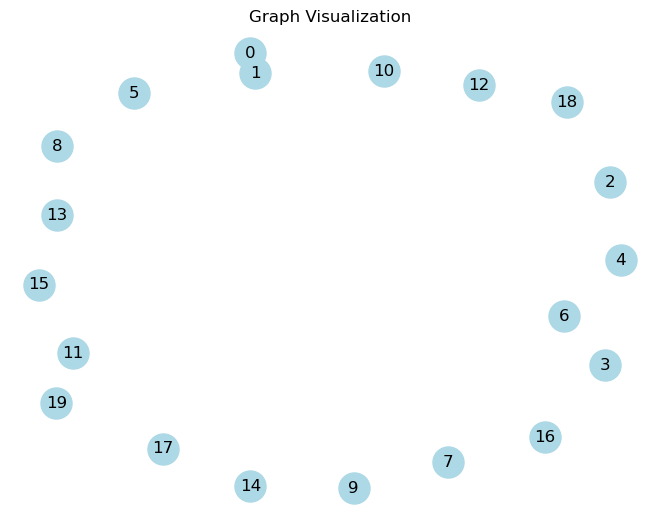

In [29]:
visualize_graph(graphs[3])

In [30]:
!pip install torch_geometric

In [31]:
import networkx as nx
import torch
import numpy as np
import pandas as pd
from torch_geometric.datasets import Planetoid
from torch_geometric.utils.convert import to_networkx

In [32]:
import torch

# Example graph object from the user's data
graph = graphs[3]

# Extracting edge indices
edge_indices = graph.edge_index.t().tolist()

# Extracting node features (assuming each node has a feature vector)
node_features = graph.x.tolist()

# The nodes can be represented as a list of indices from 0 to the number of nodes - 1
node_indices = list(range(len(node_features)))

# Displaying the node indices and edge indices
#node_indices, edge_indices
#print(node_features)

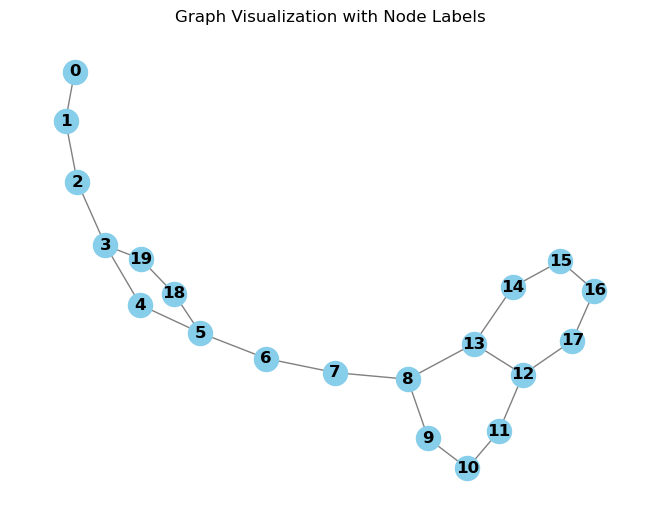

In [33]:
import networkx as nx
import torch_geometric

edge_index = torch.tensor(edge_indices, dtype=torch.long)
x = torch.tensor(node_indices, dtype=torch.float)

data = torch_geometric.data.Data(x=x, edge_index=edge_index)
g = torch_geometric.utils.to_networkx(data, to_undirected=True)

# Draw the graph with node labels
pos = nx.spring_layout(g)  # Compute layout
nx.draw(g, pos, with_labels=True, font_weight='bold', node_color='skyblue', edge_color='gray')
plt.title("Graph Visualization with Node Labels")
plt.show()

In [34]:
# Print the edge indices
print(graphs[3].edge_index.t().tolist())

[[0, 1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 5, 18, 18, 19, 19, 3, 13, 8, 17, 12], [1, 0, 2, 1, 3, 2, 4, 3, 5, 4, 6, 5, 7, 6, 8, 7, 9, 8, 10, 9, 11, 10, 12, 11, 13, 12, 14, 13, 15, 14, 16, 15, 17, 16, 18, 5, 19, 18, 3, 19, 8, 13, 12, 17]]


In [35]:
# graphs[0] is a torch_geometric.data.Data object from your graphs list
graph = graphs[3]

# Print node features
print("Len of graph:", len(graph))
print("Node Features:")
print(len(graph.x))
#for i, node_feature in enumerate(graph.x):
    #print(f"Node {i}: {node_feature}")

# Print edge pairs and edge features
print("\nEdge Pairs and Features:")
print(graph.edge_index.t())
for i, edge in enumerate(graph.edge_index.t()):
    src, dest = edge[0].item(), edge[1].item()
    edge_feature = graph.edge_attr[i]
    #print(f"Edge {i} - Source: {src}, Destination: {dest}, Features: {edge_feature}")


Len of graph: 3
Node Features:
20

Edge Pairs and Features:
tensor([[ 0,  1,  1,  2,  2,  3,  3,  4,  4,  5,  5,  6,  6,  7,  7,  8,  8,  9,
          9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17,  5, 18,
         18, 19, 19,  3, 13,  8, 17, 12],
        [ 1,  0,  2,  1,  3,  2,  4,  3,  5,  4,  6,  5,  7,  6,  8,  7,  9,  8,
         10,  9, 11, 10, 12, 11, 13, 12, 14, 13, 15, 14, 16, 15, 17, 16, 18,  5,
         19, 18,  3, 19,  8, 13, 12, 17]])


In [36]:
# Extracting edge list and edge features from the provided graph
graph = graphs[5]  

# Extracting edge index
edge_index = graph.edge_index.t()

# Preparing the edge list
edge_list = []
for i in range(edge_index.shape[1]):
    edge = edge_index[:, i]
    edge_list.append((edge[0].item(), edge[1].item()))

edge_list


[(0, 1),
 (1, 0),
 (1, 2),
 (2, 1),
 (2, 3),
 (3, 2),
 (3, 4),
 (4, 3),
 (4, 5),
 (5, 4),
 (5, 6),
 (6, 5),
 (6, 7),
 (7, 6),
 (7, 8),
 (8, 7),
 (7, 9),
 (9, 7),
 (9, 10),
 (10, 9),
 (1, 11),
 (11, 1),
 (11, 12),
 (12, 11),
 (12, 13),
 (13, 12),
 (13, 14),
 (14, 13),
 (14, 15),
 (15, 14),
 (15, 16),
 (16, 15),
 (16, 17),
 (17, 16),
 (17, 18),
 (18, 17),
 (18, 19),
 (19, 18),
 (19, 20),
 (20, 19),
 (20, 21),
 (21, 20),
 (21, 22),
 (22, 21),
 (22, 23),
 (23, 22),
 (14, 24),
 (24, 14),
 (24, 25),
 (25, 24),
 (10, 4),
 (4, 10),
 (25, 11),
 (11, 25),
 (23, 15),
 (15, 23),
 (23, 18),
 (18, 23)]

In [37]:
import torch
from torch_geometric.data import Data

# Assuming graph_data is your list of graph objects
# graph_data[0] is the first graph object

# Select the first graph object
first_graph = graphs[3]

# Convert node features to a floating-point type if they aren't already
node_features_float = first_graph.x.float()

# Inspect node features
print("Node features (x) of the first graph:")
print(node_features_float)
print("Shape of node features:", node_features_float.shape)

# Inspect edge features
print("\nEdge features (edge_attr) of the first graph:")
print(first_graph.edge_attr)
print("Shape of edge features:", first_graph.edge_attr.shape)

# Inspect edge index (connectivity)
print("\nEdge index (edge_index) of the first graph:")
print(first_graph.edge_index)
print("Shape of edge index:", first_graph.edge_index.shape)

# Calculate min and max for each node feature of the first graph
min_values, max_values = node_features_float.min(dim=0)[0], node_features_float.max(dim=0)[0]

print("\nMinimum values of node features:", min_values)
print("Maximum values of node features:", max_values)

# Calculate the standard deviation for each node feature
std_deviation = node_features_float.std(dim=0)
print("\nStandard deviation of node features:", std_deviation)


Node features (x) of the first graph:
tensor([[ 0.0000,  0.0000,  1.0000,  ...,  0.0000,  0.0000, -0.3944],
        [ 1.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0628],
        [ 1.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0658],
        ...,
        [ 1.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000, -0.0275],
        [ 0.0000,  1.0000,  0.0000,  ...,  0.0000,  0.0000, -0.1335],
        [ 0.0000,  1.0000,  0.0000,  ...,  0.0000,  0.0000, -0.0670]])
Shape of node features: torch.Size([20, 72])

Edge features (edge_attr) of the first graph:
tensor([[1., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [0., 1., 0., 0., 1., 1., 1., 0., 0., 0.],
        [0., 1., 0., 0., 1., 1., 1., 0., 0., 0.],
        [0., 1., 0., 0., 1., 1., 1.,

In [38]:
smiles_df['SMILES'][3]

'OCCn1cc(CNc2cccc3c2CCCC3)nn1'

In [39]:
mol = Chem.MolFromSmiles(smiles_df['SMILES'][3])
AllChem.ComputeGasteigerCharges(mol)

In [40]:
edge_indices = []
for bond in mol.GetBonds():
    start_idx = bond.GetBeginAtomIdx()
    end_idx = bond.GetEndAtomIdx()
    edge_indices.append((start_idx, end_idx))
    edge_indices.append((end_idx, start_idx))  # Add the reverse direction


In [41]:
edge_indices

[(0, 1),
 (1, 0),
 (1, 2),
 (2, 1),
 (2, 3),
 (3, 2),
 (3, 4),
 (4, 3),
 (4, 5),
 (5, 4),
 (5, 6),
 (6, 5),
 (6, 7),
 (7, 6),
 (7, 8),
 (8, 7),
 (8, 9),
 (9, 8),
 (9, 10),
 (10, 9),
 (10, 11),
 (11, 10),
 (11, 12),
 (12, 11),
 (12, 13),
 (13, 12),
 (13, 14),
 (14, 13),
 (14, 15),
 (15, 14),
 (15, 16),
 (16, 15),
 (16, 17),
 (17, 16),
 (5, 18),
 (18, 5),
 (18, 19),
 (19, 18),
 (19, 3),
 (3, 19),
 (13, 8),
 (8, 13),
 (17, 12),
 (12, 17)]

In [42]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.data import DataLoader
from sklearn.model_selection import train_test_split
import pandas as pd
from torch_geometric.nn import GCNConv, global_mean_pool
from torch.nn import Linear

In [43]:
print((graphs[0]))
print((smiles_df.head(1)))

Data(x=[25, 72], edge_index=[54, 2], edge_attr=[54, 10])
                                   SMILES
0  CN(c1ccccc1)c1ccccc1C(=O)NCC1(O)CCOCC1


In [44]:
print(len(graphs))
print(len(smiles_df))

50001
50001


In [45]:
# Check lengths after removal
print("Length of smiles_df:", len(smiles_df))


Length of smiles_df: 50001


In [46]:
smiles_df.head(5)

,SMILES
0,CN(c1ccccc1)c1ccccc1C(=O)NCC1(O)CCOCC1
1,CC[NH+](CC)C1CCC([NH2+]C2CC2)(C(=O)[O-])C1
2,COCC(CNC(=O)c1ccc2c(c1)NC(=O)C2)OC
3,OCCn1cc(CNc2cccc3c2CCCC3)nn1
4,CCCCCCc1ccc(C#Cc2ccc(C#CC3=CC=C(CCC)CC3)c(C3CC...


In [47]:
print(type(graphs[3]))

<class 'torch_geometric.data.data.Data'>


In [48]:
# Unsupervised Graph Generative Adversarial Netwrok

In [49]:
import torch
import torch.nn as nn
from torch_geometric.nn import GCNConv

In [50]:
def generate_random_edge_index(num_nodes):
    # Example implementation to generate a random edge_index
    # Here we create a fully connected graph for simplicity
    edge_index = torch.combinations(torch.arange(num_nodes), r=2)
    return torch.cat([edge_index, edge_index.flip([1])], dim=0).t()  # Making it undirected

In [51]:
import torch
from torch_geometric.data import Data
from torch_geometric.data import Data, Batch
from torch_geometric.utils import erdos_renyi_graph

def generate_random_noise(batch_size, node_feature_dim, edge_feature_dim, max_num_nodes):
    """
    Generate random noise for a batch of graphs with variable number of nodes and edges,
    but fixed node feature and edge feature dimensions.

    Args:
    - batch_size (int): Number of random graphs to generate.
    - node_feature_dim (int): Number of features for each node.
    - edge_feature_dim (int): Number of features for each edge.
    - max_num_nodes (int): Maximum number of nodes a graph can have.

    Returns:
    - A list of Data objects containing random noise for node and edge features.
    """
    random_graphs = []

    for _ in range(batch_size):
        # Randomly determine the number of nodes for this graph
        num_nodes = torch.randint(low=1, high=max_num_nodes, size=(1,)).item()

        # Generate random node features
        x = torch.randn(num_nodes, node_feature_dim)

        # Generate a random graph structure (edge_index)
        edge_index = erdos_renyi_graph(num_nodes, edge_prob=0.5)  # p is the probability of an edge

        # Generate random edge features (if needed)
        num_edges = edge_index.size(1)
        edge_attr = torch.randn(num_edges, edge_feature_dim) if edge_feature_dim > 0 else None

        # Create a Data object
        data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr)
        random_graphs.append(data)

    #return random_graphs
    return Batch.from_data_list(random_graphs)





In [52]:
# Example usage
batch_size = 32
node_feature_dim = 72  # Number of node features
edge_feature_dim = 10  # Number of edge features, adjust as needed
max_num_nodes = 50    # Maximum number of nodes in a graph

random_noise_graphs = generate_random_noise(batch_size, node_feature_dim, edge_feature_dim, max_num_nodes)

In [53]:
random_noise_graphs 

DataBatch(x=[727, 72], edge_index=[2, 11170], edge_attr=[11170, 10], batch=[727], ptr=[33])

In [54]:
# Generator Model
class Generator_v1(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(Generator, self).__init__()
        self.layer1 = GCNConv(input_dim, hidden_dim)
        #print("input_dim")
        self.layer2 = GCNConv(hidden_dim, output_dim)
    
    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        #print("x, edge_index gen",type(x), type(edge_index))
        #print("x, edge_index gen",x.size(), edge_index.size())
        #print("x, edge_index gen",x, edge_index)
        x = torch.relu(self.layer1(x, edge_index))
        #print("Generator x layer 1:",x)
        x = torch.sigmoid(self.layer2(x, edge_index))
        #print("Generator x  layer 2:",x)
        return x

In [55]:
# Generator Model
class Generator(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(Generator, self).__init__()
        self.layer1 = GCNConv(input_dim, hidden_dim)
        #print("input_dim")
        self.layer2 = GCNConv(hidden_dim, output_dim)    

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = torch.relu(self.layer1(x, edge_index))
        x = torch.sigmoid(self.layer2(x, edge_index))

        # Generate fake edge_index (simple example, should be improved)
        fake_edge_index = self.generate_fake_edge_index(x.size(0))
        return x, fake_edge_index

    def generate_fake_edge_index(self, num_nodes):
        # Implement logic to generate a plausible edge_index for fake graphs
        # Placeholder logic: create a simple linear chain graph
        edge_index = torch.tensor([[i, i+1] for i in range(num_nodes - 1)], dtype=torch.long).t()
        return edge_index


In [56]:
# Discriminator Model  
class Discriminator(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(Discriminator, self).__init__()
        #print("In discriminator")
        self.layer1 = GCNConv(input_dim, hidden_dim)
        #print("self.layer1",input_dim,hidden_dim)
        self.layer2 = nn.Linear(hidden_dim, 1)
        #print("self.layer2",hidden_dim)
    
    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        #print("x, edge_index1",type(x), type(edge_index))
        #print("x, edge_index2",x.size(), edge_index.size())
        #print("x, edge_index3",x, edge_index)
        x = torch.relu(self.layer1(x, edge_index))
        #print("x 2",x)
        x = torch.sigmoid(self.layer2(x))
        #print("x 3",x)
        return x

In [57]:
# Model Initialization
generator_input_dim = 72
generator_hidden_dim = 256
#generator_hidden_dim = 128
generator_output_dim = 72

discriminator_input_dim = 72
discriminator_hidden_dim = 256
#discriminator_hidden_dim = 128

In [58]:
generator = Generator(generator_input_dim, generator_hidden_dim, generator_output_dim)
discriminator = Discriminator(discriminator_input_dim, discriminator_hidden_dim)

In [59]:
import torch.optim as optim
from torch_geometric.data import DataLoader
#from torch_geometric.loader import DataLoader

from torch.utils.data import Dataset

# Sample data loader (replace with your dataset)
#data_loader = DataLoader(graphs, batch_size=32, shuffle=True)
#data_loader = DataLoader(graphs, batch_size=32, shuffle=True, follow_batch=['x', 'edge_index'])
data_loader = DataLoader(graphs, batch_size=32, shuffle=True, follow_batch=[])



# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=0.001)
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.001)

# Loss function
adversarial_loss = torch.nn.BCELoss()

C:\Users\Malli\anaconda3\Lib\site-packages\torch_geometric\deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


In [60]:
# Function to calculate discriminator accuracy
def calculate_discriminator_accuracy(discriminator, real_data, fake_data):
    real_predictions = discriminator(real_data).round()
    fake_predictions = discriminator(fake_data).round()
    correct_predictions = (real_predictions == 1).sum() + (fake_predictions == 0).sum()
    total_predictions = real_predictions.numel() + fake_predictions.numel()
    accuracy = 100 * correct_predictions.float() / total_predictions
    return accuracy

In [61]:
print((data_loader))

In [62]:
print((graphs[3].x).shape)
print((graphs[3].edge_index).shape)

torch.Size([20, 72])
torch.Size([44, 2])


In [63]:
print((graphs[0].x).shape)
print((graphs[0].edge_index).shape)

torch.Size([25, 72])
torch.Size([54, 2])


In [64]:
import torch
from torch_geometric.data import Data
from torch_geometric.data import Batch

def custom_graph_data_loader(graph_dataset, batch_size):
    """
    Custom data loader for graph data.
    
    Args:
    - graph_dataset (list of Data): The dataset containing graph Data objects.
    - batch_size (int): The size of each batch.

    Yields:
    - Batched Data object containing a batch of graphs.
    """

    def batch_graphs(graphs):
        """
        Manually batches a list of graphs into a single Batch object.
        """
        batched_edge_index = []
        batched_x = []
        batched_batch = []

        current_node_idx = 0
        for i, graph in enumerate(graphs):
            # Offset the node indices by the current_node_idx and add them to the batched edge index.
            #edge_index_offset = graph.edge_index + current_node_idx
            #batched_edge_index.append(edge_index_offset)
            
            # Offset only the node indices in the edge_index tensor.
            edge_index_offset = graph.edge_index.clone()  # Make a copy to avoid modifying the original graph
            edge_index_offset[0, :] += current_node_idx  # Offset source node indices
            edge_index_offset[1, :] += current_node_idx  # Offset target node indices
            #batched_edge_index.append(edge_index_offset)            
            
            #Tring edge_index
            #batched_edge_index.append(graph.edge_index)
            batched_edge_index.append(graph.edge_index + current_node_idx)

            # Add the current graph's node features to the batched node features.
            batched_x.append(graph.x)

            # Add the graph index to the batch vector for all nodes of this graph.
            batched_batch.append(torch.full((graph.x.size(0),), i, dtype=torch.long))

            # Update the current_node_idx for the next graph.
            current_node_idx += graph.x.size(0)

        # Concatenate all the lists to create tensors.       
        
        batched_edge_index = torch.cat(batched_edge_index, dim=0)
        batched_x = torch.cat(batched_x, dim=0)
        batched_batch = torch.cat(batched_batch, dim=0)
        

        # Create a new Data object to hold the batched graph.
        batched_data = Data(x=batched_x, edge_index=batched_edge_index)
        batched_data.batch = batched_batch

        return batched_data

    # Shuffle dataset at the beginning of each epoch
    indices = torch.randperm(len(graph_dataset))
    
    for start in range(0, len(indices), batch_size):
        end = start + batch_size
        batch_indices = indices[start:end]
        batch_graphs_list = [graph_dataset[i] for i in batch_indices]
        batch = batch_graphs(batch_graphs_list)
        yield batch


In [65]:
import matplotlib.pyplot as plt
import torch

def calculate_accuracy(preds, labels):
    predicted_labels = preds.round()  # Convert probabilities to 0/1
    correct = (predicted_labels == labels).float()  # Convert into float for division 
    accuracy = correct.sum() / len(correct)
    return accuracy

In [66]:
num_epochs = 50
batch_size = 32

# Lists to store metrics
epochs = []
d_losses = []
g_losses = []
real_accuracy_list =[]
fake_accuracy_list=[]
d_accuracies = []


for epoch in range(num_epochs):
    print("epoch", epoch)
    for batch in custom_graph_data_loader(graphs, batch_size):
        # Generate fake data
        random_noise_graphs_batch = generate_random_noise(batch_size, node_feature_dim, edge_feature_dim, max_num_nodes)
        fake_x, fake_edge_index = generator(random_noise_graphs_batch)

        # Ensure the real edge_index is correctly shaped [2, num_edges]
        if batch.edge_index.size(0) != 2:
            batch.edge_index = batch.edge_index.t()  # Transpose if necessary        
        
        # Create fake data batch with both x and edge_index
        fake_data = Data(x=fake_x, edge_index=fake_edge_index)

        # Labels for real and fake data (for each node)
        real_labels = torch.ones(batch.x.size(0), 1)
        fake_labels = torch.zeros(fake_data.x.size(0), 1)

        # Train Discriminator
        optimizer_D.zero_grad()
        real_loss = adversarial_loss(discriminator(batch), real_labels)
        fake_loss = adversarial_loss(discriminator(fake_data), fake_labels)
        d_loss = real_loss + fake_loss
        d_loss.backward()
        optimizer_D.step()

        # Train Generator
        optimizer_G.zero_grad()
        # Recompute fake data and perform forward pass through discriminator
        fake_x, fake_edge_index = generator(random_noise_graphs_batch)
        fake_data = Data(x=fake_x, edge_index=fake_edge_index)
        updated_real_labels = torch.ones(fake_data.x.size(0), 1)
        g_loss = adversarial_loss(discriminator(fake_data), updated_real_labels)
        g_loss.backward()
        optimizer_G.step()
        
        
        # Calculate discriminator accuracy
        real_accuracy = calculate_accuracy(discriminator(batch).detach(), real_labels)
        print("real_accuracy",real_accuracy)
        fake_accuracy = calculate_accuracy(discriminator(fake_data).detach(), fake_labels)
        print("fake_accuracy",fake_accuracy)
        d_accuracy = (real_accuracy + fake_accuracy) / 2

        # Store metrics
        d_losses.append(d_loss.item())
        print("d_loss.item()",d_loss.item())
        g_losses.append(g_loss.item())
        print("g_loss.item()",g_loss.item())
        d_accuracies.append(d_accuracy.item())
        real_accuracy_list.append(real_accuracy.item())
        fake_accuracy_list.append(fake_accuracy.item())
        
        epochs.append(epoch)


epoch 0
real_accuracy tensor(0.0012)
fake_accuracy tensor(1.)
d_loss.item() 1.409074068069458
g_loss.item() 0.810163140296936
real_accuracy tensor(0.0012)
fake_accuracy tensor(1.)
d_loss.item() 1.3285465240478516
g_loss.item() 0.8982083797454834
real_accuracy tensor(0.0024)
fake_accuracy tensor(1.)
d_loss.item() 1.2584497928619385
g_loss.item() 0.989730954170227
real_accuracy tensor(0.0085)
fake_accuracy tensor(1.)
d_loss.item() 1.1945749521255493
g_loss.item() 1.0839130878448486
real_accuracy tensor(0.0228)
fake_accuracy tensor(1.)
d_loss.item() 1.1373704671859741
g_loss.item() 1.1794465780258179
real_accuracy tensor(0.0622)
fake_accuracy tensor(1.)
d_loss.item() 1.0857632160186768
g_loss.item() 1.277809977531433
real_accuracy tensor(0.2093)
fake_accuracy tensor(1.)
d_loss.item() 1.0410478115081787
g_loss.item() 1.3734235763549805
real_accuracy tensor(0.4240)
fake_accuracy tensor(1.)
d_loss.item() 1.0019526481628418
g_loss.item() 1.4678339958190918
real_accuracy tensor(0.6171)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.9290)
d_loss.item() 0.5370741486549377
g_loss.item() 1.9356471300125122
real_accuracy tensor(1.)
fake_accuracy tensor(0.9657)
d_loss.item() 0.5339031219482422
g_loss.item() 1.9307912588119507
real_accuracy tensor(1.)
fake_accuracy tensor(0.9680)
d_loss.item() 0.5416770577430725
g_loss.item() 2.0110561847686768
real_accuracy tensor(1.)
fake_accuracy tensor(0.9738)
d_loss.item() 0.5265832543373108
g_loss.item() 2.067924976348877
real_accuracy tensor(1.)
fake_accuracy tensor(0.9596)
d_loss.item() 0.6016339063644409
g_loss.item() 1.8265433311462402
real_accuracy tensor(1.)
fake_accuracy tensor(0.9479)
d_loss.item() 0.6591458320617676
g_loss.item() 1.679703950881958
real_accuracy tensor(1.)
fake_accuracy tensor(0.9962)
d_loss.item() 0.5887529850006104
g_loss.item() 2.048276662826538
real_accuracy tensor(1.)
fake_accuracy tensor(1.)
d_loss.item() 0.6194218993186951
g_loss.item() 1.809678077697754
real_accuracy tensor(1.)
fake_accuracy tensor(1.

real_accuracy tensor(0.8254)
fake_accuracy tensor(1.)
d_loss.item() 0.9161169528961182
g_loss.item() 1.2817399501800537
real_accuracy tensor(0.8423)
fake_accuracy tensor(1.)
d_loss.item() 0.8877432942390442
g_loss.item() 1.2806050777435303
real_accuracy tensor(0.9182)
fake_accuracy tensor(1.)
d_loss.item() 0.795741081237793
g_loss.item() 1.3068726062774658
real_accuracy tensor(0.9034)
fake_accuracy tensor(1.)
d_loss.item() 0.827691376209259
g_loss.item() 1.313004493713379
real_accuracy tensor(0.9141)
fake_accuracy tensor(1.)
d_loss.item() 0.7774316668510437
g_loss.item() 1.3801575899124146
real_accuracy tensor(0.9620)
fake_accuracy tensor(1.)
d_loss.item() 0.727037787437439
g_loss.item() 1.4083234071731567
real_accuracy tensor(0.9566)
fake_accuracy tensor(1.)
d_loss.item() 0.7116204500198364
g_loss.item() 1.4302282333374023
real_accuracy tensor(0.9686)
fake_accuracy tensor(1.)
d_loss.item() 0.6924259662628174
g_loss.item() 1.482149600982666
real_accuracy tensor(0.9667)
fake_accuracy te

real_accuracy tensor(0.9757)
fake_accuracy tensor(1.)
d_loss.item() 0.6837515830993652
g_loss.item() 1.0356643199920654
real_accuracy tensor(0.9652)
fake_accuracy tensor(0.9962)
d_loss.item() 0.7255377769470215
g_loss.item() 0.9991243481636047
real_accuracy tensor(0.9645)
fake_accuracy tensor(0.9166)
d_loss.item() 0.83954918384552
g_loss.item() 0.8595311641693115
real_accuracy tensor(0.9520)
fake_accuracy tensor(0.8371)
d_loss.item() 0.8881364464759827
g_loss.item() 0.8309974670410156
real_accuracy tensor(0.9494)
fake_accuracy tensor(0.7019)
d_loss.item() 0.9804058074951172
g_loss.item() 0.7644489407539368
real_accuracy tensor(0.9182)
fake_accuracy tensor(0.6659)
d_loss.item() 1.0624278783798218
g_loss.item() 0.7384523153305054
real_accuracy tensor(0.9357)
fake_accuracy tensor(0.5429)
d_loss.item() 1.109379529953003
g_loss.item() 0.6999561786651611
real_accuracy tensor(0.8517)
fake_accuracy tensor(0.3703)
d_loss.item() 1.268823266029358
g_loss.item() 0.6482872366905212
real_accuracy te

real_accuracy tensor(0.7299)
fake_accuracy tensor(1.)
d_loss.item() 0.7584110498428345
g_loss.item() 1.6385278701782227
real_accuracy tensor(0.8076)
fake_accuracy tensor(1.)
d_loss.item() 0.7378917336463928
g_loss.item() 1.6397521495819092
real_accuracy tensor(0.8310)
fake_accuracy tensor(1.)
d_loss.item() 0.693684995174408
g_loss.item() 1.6292221546173096
real_accuracy tensor(0.8733)
fake_accuracy tensor(1.)
d_loss.item() 0.6538475155830383
g_loss.item() 1.6294394731521606
real_accuracy tensor(0.8568)
fake_accuracy tensor(1.)
d_loss.item() 0.6162695288658142
g_loss.item() 1.6572964191436768
real_accuracy tensor(0.8910)
fake_accuracy tensor(1.)
d_loss.item() 0.5659127831459045
g_loss.item() 1.653239130973816
real_accuracy tensor(0.9234)
fake_accuracy tensor(1.)
d_loss.item() 0.5318011045455933
g_loss.item() 1.667151927947998
real_accuracy tensor(0.9201)
fake_accuracy tensor(1.)
d_loss.item() 0.5192521810531616
g_loss.item() 1.678231120109558
real_accuracy tensor(0.9475)
fake_accuracy t

real_accuracy tensor(0.7859)
fake_accuracy tensor(1.)
d_loss.item() 0.6182817816734314
g_loss.item() 2.093902349472046
real_accuracy tensor(0.8080)
fake_accuracy tensor(1.)
d_loss.item() 0.6147423982620239
g_loss.item() 2.112276315689087
real_accuracy tensor(0.8397)
fake_accuracy tensor(1.)
d_loss.item() 0.5546826124191284
g_loss.item() 2.1301345825195312
real_accuracy tensor(0.8575)
fake_accuracy tensor(1.)
d_loss.item() 0.5010297298431396
g_loss.item() 2.1265053749084473
real_accuracy tensor(0.8748)
fake_accuracy tensor(1.)
d_loss.item() 0.46703869104385376
g_loss.item() 2.1057701110839844
real_accuracy tensor(0.8855)
fake_accuracy tensor(1.)
d_loss.item() 0.4572174549102783
g_loss.item() 2.0350847244262695
real_accuracy tensor(0.9021)
fake_accuracy tensor(1.)
d_loss.item() 0.42691537737846375
g_loss.item() 2.0086722373962402
real_accuracy tensor(0.9076)
fake_accuracy tensor(1.)
d_loss.item() 0.4181392788887024
g_loss.item() 1.9994224309921265
real_accuracy tensor(0.9204)
fake_accura

real_accuracy tensor(0.9731)
fake_accuracy tensor(1.)
d_loss.item() 0.16804249584674835
g_loss.item() 2.8014729022979736
real_accuracy tensor(0.9772)
fake_accuracy tensor(1.)
d_loss.item() 0.18107208609580994
g_loss.item() 2.655143976211548
real_accuracy tensor(0.9807)
fake_accuracy tensor(1.)
d_loss.item() 0.19113248586654663
g_loss.item() 2.527573347091675
real_accuracy tensor(0.9770)
fake_accuracy tensor(1.)
d_loss.item() 0.19984856247901917
g_loss.item() 2.4748947620391846
real_accuracy tensor(0.9910)
fake_accuracy tensor(1.)
d_loss.item() 0.19343507289886475
g_loss.item() 2.3421566486358643
real_accuracy tensor(0.9842)
fake_accuracy tensor(1.)
d_loss.item() 0.20887145400047302
g_loss.item() 2.3095669746398926
real_accuracy tensor(0.9933)
fake_accuracy tensor(1.)
d_loss.item() 0.20595020055770874
g_loss.item() 2.2434802055358887
real_accuracy tensor(0.9894)
fake_accuracy tensor(1.)
d_loss.item() 0.22735007107257843
g_loss.item() 2.242570161819458
real_accuracy tensor(0.9855)
fake_a

real_accuracy tensor(0.9831)
fake_accuracy tensor(1.)
d_loss.item() 0.10198884457349777
g_loss.item() 4.155834674835205
real_accuracy tensor(0.9697)
fake_accuracy tensor(1.)
d_loss.item() 0.10441620647907257
g_loss.item() 4.318800449371338
real_accuracy tensor(0.9902)
fake_accuracy tensor(1.)
d_loss.item() 0.07870465517044067
g_loss.item() 4.385865211486816
real_accuracy tensor(0.9850)
fake_accuracy tensor(1.)
d_loss.item() 0.09457268565893173
g_loss.item() 4.453680038452148
real_accuracy tensor(0.9760)
fake_accuracy tensor(1.)
d_loss.item() 0.0868658572435379
g_loss.item() 4.58355712890625
real_accuracy tensor(0.9783)
fake_accuracy tensor(1.)
d_loss.item() 0.08097979426383972
g_loss.item() 4.542439937591553
real_accuracy tensor(0.9784)
fake_accuracy tensor(1.)
d_loss.item() 0.08639563620090485
g_loss.item() 4.343544960021973
real_accuracy tensor(0.9823)
fake_accuracy tensor(1.)
d_loss.item() 0.08911528438329697
g_loss.item() 4.387889862060547
real_accuracy tensor(0.9883)
fake_accuracy

real_accuracy tensor(0.9509)
fake_accuracy tensor(1.)
d_loss.item() 0.17427775263786316
g_loss.item() 3.6434364318847656
real_accuracy tensor(0.9804)
fake_accuracy tensor(1.)
d_loss.item() 0.11896629631519318
g_loss.item() 3.7036123275756836
real_accuracy tensor(0.9677)
fake_accuracy tensor(1.)
d_loss.item() 0.13230213522911072
g_loss.item() 3.80357027053833
real_accuracy tensor(0.9773)
fake_accuracy tensor(1.)
d_loss.item() 0.12299313396215439
g_loss.item() 3.8396830558776855
real_accuracy tensor(0.9673)
fake_accuracy tensor(1.)
d_loss.item() 0.14304909110069275
g_loss.item() 3.852689743041992
real_accuracy tensor(0.9814)
fake_accuracy tensor(1.)
d_loss.item() 0.11526067554950714
g_loss.item() 3.8853790760040283
real_accuracy tensor(0.9733)
fake_accuracy tensor(1.)
d_loss.item() 0.12069061398506165
g_loss.item() 3.844961404800415
real_accuracy tensor(0.9860)
fake_accuracy tensor(1.)
d_loss.item() 0.0998414158821106
g_loss.item() 3.8609039783477783
real_accuracy tensor(0.9817)
fake_acc

real_accuracy tensor(0.9780)
fake_accuracy tensor(1.)
d_loss.item() 0.19387339055538177
g_loss.item() 2.9956395626068115
real_accuracy tensor(0.9703)
fake_accuracy tensor(1.)
d_loss.item() 0.19691181182861328
g_loss.item() 2.977992534637451
real_accuracy tensor(0.9700)
fake_accuracy tensor(1.)
d_loss.item() 0.20327666401863098
g_loss.item() 3.0502302646636963
real_accuracy tensor(0.9651)
fake_accuracy tensor(1.)
d_loss.item() 0.200333833694458
g_loss.item() 3.0699644088745117
real_accuracy tensor(0.9548)
fake_accuracy tensor(1.)
d_loss.item() 0.2194661796092987
g_loss.item() 2.93740177154541
real_accuracy tensor(0.9529)
fake_accuracy tensor(1.)
d_loss.item() 0.22562527656555176
g_loss.item() 2.880948781967163
real_accuracy tensor(0.9433)
fake_accuracy tensor(1.)
d_loss.item() 0.2317659705877304
g_loss.item() 2.8210434913635254
real_accuracy tensor(0.9603)
fake_accuracy tensor(1.)
d_loss.item() 0.25229838490486145
g_loss.item() 2.5768120288848877
real_accuracy tensor(0.9712)
fake_accura

real_accuracy tensor(0.9959)
fake_accuracy tensor(1.)
d_loss.item() 0.06624065339565277
g_loss.item() 4.144057273864746
real_accuracy tensor(0.9988)
fake_accuracy tensor(1.)
d_loss.item() 0.060305409133434296
g_loss.item() 4.0714240074157715
real_accuracy tensor(0.9960)
fake_accuracy tensor(1.)
d_loss.item() 0.06343568116426468
g_loss.item() 3.9791808128356934
real_accuracy tensor(0.9948)
fake_accuracy tensor(1.)
d_loss.item() 0.06417781114578247
g_loss.item() 3.847099542617798
real_accuracy tensor(0.9976)
fake_accuracy tensor(1.)
d_loss.item() 0.05967731401324272
g_loss.item() 3.861192226409912
real_accuracy tensor(0.9978)
fake_accuracy tensor(1.)
d_loss.item() 0.06791119277477264
g_loss.item() 3.611300230026245
real_accuracy tensor(1.)
fake_accuracy tensor(1.)
d_loss.item() 0.06654789298772812
g_loss.item() 3.5330758094787598
real_accuracy tensor(0.9987)
fake_accuracy tensor(1.)
d_loss.item() 0.0737709030508995
g_loss.item() 3.3300602436065674
real_accuracy tensor(0.9989)
fake_accura

real_accuracy tensor(0.9601)
fake_accuracy tensor(1.)
d_loss.item() 0.12319596111774445
g_loss.item() 3.8939836025238037
real_accuracy tensor(0.9608)
fake_accuracy tensor(1.)
d_loss.item() 0.10936307162046432
g_loss.item() 3.8491930961608887
real_accuracy tensor(0.9697)
fake_accuracy tensor(1.)
d_loss.item() 0.09385912120342255
g_loss.item() 3.8751301765441895
real_accuracy tensor(0.9526)
fake_accuracy tensor(1.)
d_loss.item() 0.12115102261304855
g_loss.item() 3.8181021213531494
real_accuracy tensor(0.9796)
fake_accuracy tensor(1.)
d_loss.item() 0.08268021047115326
g_loss.item() 3.8243765830993652
real_accuracy tensor(0.9804)
fake_accuracy tensor(1.)
d_loss.item() 0.09099119901657104
g_loss.item() 3.7725250720977783
real_accuracy tensor(0.9898)
fake_accuracy tensor(1.)
d_loss.item() 0.07919909060001373
g_loss.item() 3.668046474456787
real_accuracy tensor(0.9791)
fake_accuracy tensor(1.)
d_loss.item() 0.10106255114078522
g_loss.item() 3.546415090560913
real_accuracy tensor(0.9802)
fake_

real_accuracy tensor(0.9885)
fake_accuracy tensor(1.)
d_loss.item() 0.16809046268463135
g_loss.item() 2.5696139335632324
real_accuracy tensor(0.9689)
fake_accuracy tensor(1.)
d_loss.item() 0.1995055377483368
g_loss.item() 2.401710033416748
real_accuracy tensor(0.9797)
fake_accuracy tensor(1.)
d_loss.item() 0.21167075634002686
g_loss.item() 2.2819628715515137
real_accuracy tensor(0.9819)
fake_accuracy tensor(1.)
d_loss.item() 0.22505627572536469
g_loss.item() 2.1098883152008057
real_accuracy tensor(0.9623)
fake_accuracy tensor(1.)
d_loss.item() 0.27798110246658325
g_loss.item() 2.0136091709136963
real_accuracy tensor(0.9693)
fake_accuracy tensor(1.)
d_loss.item() 0.2940490245819092
g_loss.item() 1.9758185148239136
real_accuracy tensor(0.9759)
fake_accuracy tensor(1.)
d_loss.item() 0.24063605070114136
g_loss.item() 2.115053176879883
real_accuracy tensor(0.9573)
fake_accuracy tensor(1.)
d_loss.item() 0.31156328320503235
g_loss.item() 2.0389931201934814
real_accuracy tensor(0.9665)
fake_ac

real_accuracy tensor(0.9609)
fake_accuracy tensor(1.)
d_loss.item() 0.23405933380126953
g_loss.item() 2.192150592803955
real_accuracy tensor(0.9575)
fake_accuracy tensor(1.)
d_loss.item() 0.25574275851249695
g_loss.item() 2.128668785095215
real_accuracy tensor(0.9674)
fake_accuracy tensor(1.)
d_loss.item() 0.262503445148468
g_loss.item() 2.0187525749206543
real_accuracy tensor(0.9762)
fake_accuracy tensor(1.)
d_loss.item() 0.22689896821975708
g_loss.item() 2.1431846618652344
real_accuracy tensor(0.9697)
fake_accuracy tensor(1.)
d_loss.item() 0.25661972165107727
g_loss.item() 2.1326990127563477
real_accuracy tensor(0.9770)
fake_accuracy tensor(1.)
d_loss.item() 0.2269875705242157
g_loss.item() 2.207617998123169
real_accuracy tensor(0.9592)
fake_accuracy tensor(1.)
d_loss.item() 0.25205039978027344
g_loss.item() 2.2730417251586914
real_accuracy tensor(0.9579)
fake_accuracy tensor(1.)
d_loss.item() 0.25456005334854126
g_loss.item() 2.398036003112793
real_accuracy tensor(0.9584)
fake_accur

real_accuracy tensor(0.9566)
fake_accuracy tensor(1.)
d_loss.item() 0.1429593712091446
g_loss.item() 3.6699016094207764
real_accuracy tensor(0.9454)
fake_accuracy tensor(1.)
d_loss.item() 0.15209336578845978
g_loss.item() 3.6130831241607666
real_accuracy tensor(0.9587)
fake_accuracy tensor(1.)
d_loss.item() 0.13393868505954742
g_loss.item() 3.6948909759521484
real_accuracy tensor(0.9395)
fake_accuracy tensor(1.)
d_loss.item() 0.18566018342971802
g_loss.item() 3.5887699127197266
real_accuracy tensor(0.9590)
fake_accuracy tensor(1.)
d_loss.item() 0.14704161882400513
g_loss.item() 3.552844762802124
real_accuracy tensor(0.9740)
fake_accuracy tensor(1.)
d_loss.item() 0.11011378467082977
g_loss.item() 3.5535435676574707
real_accuracy tensor(0.9646)
fake_accuracy tensor(1.)
d_loss.item() 0.13883304595947266
g_loss.item() 3.3257827758789062
real_accuracy tensor(0.9615)
fake_accuracy tensor(1.)
d_loss.item() 0.14070643484592438
g_loss.item() 3.233919382095337
real_accuracy tensor(0.9571)
fake_a

real_accuracy tensor(0.9890)
fake_accuracy tensor(1.)
d_loss.item() 0.047821804881095886
g_loss.item() 4.0275092124938965
real_accuracy tensor(0.9905)
fake_accuracy tensor(1.)
d_loss.item() 0.047013282775878906
g_loss.item() 4.0590291023254395
real_accuracy tensor(0.9951)
fake_accuracy tensor(1.)
d_loss.item() 0.04559954255819321
g_loss.item() 4.106703281402588
real_accuracy tensor(0.9839)
fake_accuracy tensor(1.)
d_loss.item() 0.06410527974367142
g_loss.item() 4.089134216308594
real_accuracy tensor(0.9907)
fake_accuracy tensor(1.)
d_loss.item() 0.04592018574476242
g_loss.item() 4.04716682434082
real_accuracy tensor(0.9940)
fake_accuracy tensor(1.)
d_loss.item() 0.0506352037191391
g_loss.item() 4.111108779907227
real_accuracy tensor(0.9955)
fake_accuracy tensor(1.)
d_loss.item() 0.042188435792922974
g_loss.item() 4.132943630218506
real_accuracy tensor(0.9945)
fake_accuracy tensor(1.)
d_loss.item() 0.046116068959236145
g_loss.item() 4.082939147949219
real_accuracy tensor(0.9895)
fake_ac

real_accuracy tensor(0.9595)
fake_accuracy tensor(1.)
d_loss.item() 0.15377554297447205
g_loss.item() 3.131901979446411
real_accuracy tensor(0.9483)
fake_accuracy tensor(1.)
d_loss.item() 0.15912427008152008
g_loss.item() 3.0907087326049805
real_accuracy tensor(0.9526)
fake_accuracy tensor(1.)
d_loss.item() 0.16442662477493286
g_loss.item() 3.15049409866333
real_accuracy tensor(0.9370)
fake_accuracy tensor(1.)
d_loss.item() 0.17203494906425476
g_loss.item() 3.162428855895996
real_accuracy tensor(0.9429)
fake_accuracy tensor(1.)
d_loss.item() 0.16269570589065552
g_loss.item() 3.18129301071167
real_accuracy tensor(0.9594)
fake_accuracy tensor(1.)
d_loss.item() 0.14258036017417908
g_loss.item() 3.2118358612060547
real_accuracy tensor(0.9519)
fake_accuracy tensor(1.)
d_loss.item() 0.14257708191871643
g_loss.item() 3.171037197113037
real_accuracy tensor(0.9521)
fake_accuracy tensor(1.)
d_loss.item() 0.14391283690929413
g_loss.item() 3.18658447265625
real_accuracy tensor(0.9557)
fake_accurac

fake_accuracy tensor(1.)
d_loss.item() 0.38306954503059387
g_loss.item() 2.0351622104644775
real_accuracy tensor(0.9042)
fake_accuracy tensor(1.)
d_loss.item() 0.37883251905441284
g_loss.item() 2.151614189147949
real_accuracy tensor(0.9545)
fake_accuracy tensor(1.)
d_loss.item() 0.25845980644226074
g_loss.item() 2.205012321472168
real_accuracy tensor(0.9257)
fake_accuracy tensor(1.)
d_loss.item() 0.30068275332450867
g_loss.item() 2.331753969192505
real_accuracy tensor(0.9179)
fake_accuracy tensor(1.)
d_loss.item() 0.29253387451171875
g_loss.item() 2.471928834915161
real_accuracy tensor(0.9250)
fake_accuracy tensor(1.)
d_loss.item() 0.2996039390563965
g_loss.item() 2.4969515800476074
real_accuracy tensor(0.9076)
fake_accuracy tensor(1.)
d_loss.item() 0.28662383556365967
g_loss.item() 2.566910743713379
real_accuracy tensor(0.9460)
fake_accuracy tensor(1.)
d_loss.item() 0.2514987289905548
g_loss.item() 2.568882703781128
real_accuracy tensor(0.9332)
fake_accuracy tensor(1.)
d_loss.item() 0

real_accuracy tensor(0.8655)
fake_accuracy tensor(1.)
d_loss.item() 0.4236917495727539
g_loss.item() 2.3944623470306396
real_accuracy tensor(0.8330)
fake_accuracy tensor(1.)
d_loss.item() 0.5456245541572571
g_loss.item() 2.5111751556396484
real_accuracy tensor(0.8432)
fake_accuracy tensor(1.)
d_loss.item() 0.48092347383499146
g_loss.item() 2.483069658279419
real_accuracy tensor(0.8902)
fake_accuracy tensor(1.)
d_loss.item() 0.39820432662963867
g_loss.item() 2.53580379486084
real_accuracy tensor(0.9095)
fake_accuracy tensor(1.)
d_loss.item() 0.33838728070259094
g_loss.item() 2.537484645843506
real_accuracy tensor(0.9030)
fake_accuracy tensor(1.)
d_loss.item() 0.3328050971031189
g_loss.item() 2.603878974914551
real_accuracy tensor(0.8963)
fake_accuracy tensor(1.)
d_loss.item() 0.33360785245895386
g_loss.item() 2.553177833557129
real_accuracy tensor(0.8429)
fake_accuracy tensor(1.)
d_loss.item() 0.5459029078483582
g_loss.item() 2.576894760131836
real_accuracy tensor(0.9094)
fake_accuracy 

real_accuracy tensor(0.9001)
fake_accuracy tensor(1.)
d_loss.item() 0.3493855595588684
g_loss.item() 2.1526665687561035
real_accuracy tensor(0.8690)
fake_accuracy tensor(1.)
d_loss.item() 0.46372365951538086
g_loss.item() 1.9471092224121094
real_accuracy tensor(0.8811)
fake_accuracy tensor(1.)
d_loss.item() 0.4497048854827881
g_loss.item() 1.863451600074768
real_accuracy tensor(0.8720)
fake_accuracy tensor(1.)
d_loss.item() 0.5042356848716736
g_loss.item() 1.8999943733215332
real_accuracy tensor(0.8717)
fake_accuracy tensor(1.)
d_loss.item() 0.5296333432197571
g_loss.item() 1.7026690244674683
real_accuracy tensor(0.8624)
fake_accuracy tensor(0.9988)
d_loss.item() 0.577010452747345
g_loss.item() 1.6462515592575073
real_accuracy tensor(0.8807)
fake_accuracy tensor(1.)
d_loss.item() 0.6113331317901611
g_loss.item() 1.6245099306106567
real_accuracy tensor(0.8744)
fake_accuracy tensor(1.)
d_loss.item() 0.5799160003662109
g_loss.item() 1.6621510982513428
real_accuracy tensor(0.8450)
fake_acc

real_accuracy tensor(0.9878)
fake_accuracy tensor(1.)
d_loss.item() 0.21265602111816406
g_loss.item() 2.362417459487915
real_accuracy tensor(0.9914)
fake_accuracy tensor(1.)
d_loss.item() 0.17656245827674866
g_loss.item() 2.5713491439819336
real_accuracy tensor(0.9789)
fake_accuracy tensor(1.)
d_loss.item() 0.22015643119812012
g_loss.item() 2.4368128776550293
real_accuracy tensor(0.9618)
fake_accuracy tensor(1.)
d_loss.item() 0.19843563437461853
g_loss.item() 2.903290033340454
real_accuracy tensor(0.9820)
fake_accuracy tensor(1.)
d_loss.item() 0.17619827389717102
g_loss.item() 2.845252513885498
real_accuracy tensor(0.9687)
fake_accuracy tensor(1.)
d_loss.item() 0.16973645985126495
g_loss.item() 3.136995315551758
real_accuracy tensor(0.9399)
fake_accuracy tensor(1.)
d_loss.item() 0.1917785108089447
g_loss.item() 3.1959664821624756
real_accuracy tensor(0.9627)
fake_accuracy tensor(1.)
d_loss.item() 0.14074569940567017
g_loss.item() 3.6192030906677246
real_accuracy tensor(0.9428)
fake_acc

real_accuracy tensor(0.9477)
fake_accuracy tensor(1.)
d_loss.item() 0.3498820662498474
g_loss.item() 2.2239632606506348
real_accuracy tensor(0.9240)
fake_accuracy tensor(0.9986)
d_loss.item() 0.444757342338562
g_loss.item() 2.0413873195648193
real_accuracy tensor(0.9483)
fake_accuracy tensor(0.9906)
d_loss.item() 0.4664645791053772
g_loss.item() 1.8977038860321045
real_accuracy tensor(0.9060)
fake_accuracy tensor(0.9820)
d_loss.item() 0.4909214675426483
g_loss.item() 1.9144914150238037
real_accuracy tensor(0.9216)
fake_accuracy tensor(0.9864)
d_loss.item() 0.4728407859802246
g_loss.item() 1.9643386602401733
real_accuracy tensor(0.9603)
fake_accuracy tensor(0.9934)
d_loss.item() 0.35638609528541565
g_loss.item() 1.9830381870269775
real_accuracy tensor(0.9372)
fake_accuracy tensor(1.)
d_loss.item() 0.42682337760925293
g_loss.item() 1.8841646909713745
real_accuracy tensor(0.9135)
fake_accuracy tensor(1.)
d_loss.item() 0.505887508392334
g_loss.item() 1.930911898612976
real_accuracy tensor(

real_accuracy tensor(0.8917)
fake_accuracy tensor(1.)
d_loss.item() 0.40421053767204285
g_loss.item() 2.5125491619110107
real_accuracy tensor(0.8688)
fake_accuracy tensor(1.)
d_loss.item() 0.3963669538497925
g_loss.item() 2.6181044578552246
epoch 1
real_accuracy tensor(0.8832)
fake_accuracy tensor(1.)
d_loss.item() 0.35400134325027466
g_loss.item() 2.7058796882629395
real_accuracy tensor(0.8997)
fake_accuracy tensor(1.)
d_loss.item() 0.3479207456111908
g_loss.item() 2.5361225605010986
real_accuracy tensor(0.9261)
fake_accuracy tensor(1.)
d_loss.item() 0.2939278781414032
g_loss.item() 2.5307674407958984
real_accuracy tensor(0.8987)
fake_accuracy tensor(1.)
d_loss.item() 0.3441649079322815
g_loss.item() 2.5931284427642822
real_accuracy tensor(0.9056)
fake_accuracy tensor(1.)
d_loss.item() 0.3163031041622162
g_loss.item() 2.55894136428833
real_accuracy tensor(0.8785)
fake_accuracy tensor(1.)
d_loss.item() 0.33312368392944336
g_loss.item() 2.5967133045196533
real_accuracy tensor(0.9200)
fa

real_accuracy tensor(0.7503)
fake_accuracy tensor(1.)
d_loss.item() 0.8898286819458008
g_loss.item() 1.8028355836868286
real_accuracy tensor(0.8054)
fake_accuracy tensor(1.)
d_loss.item() 0.7729732990264893
g_loss.item() 1.6064972877502441
real_accuracy tensor(0.7478)
fake_accuracy tensor(1.)
d_loss.item() 0.9031140804290771
g_loss.item() 1.6672415733337402
real_accuracy tensor(0.7601)
fake_accuracy tensor(1.)
d_loss.item() 0.9224783182144165
g_loss.item() 1.5945926904678345
real_accuracy tensor(0.7843)
fake_accuracy tensor(1.)
d_loss.item() 0.8348575234413147
g_loss.item() 1.7292577028274536
real_accuracy tensor(0.7830)
fake_accuracy tensor(1.)
d_loss.item() 0.7935351133346558
g_loss.item() 1.7040467262268066
real_accuracy tensor(0.7876)
fake_accuracy tensor(1.)
d_loss.item() 0.8168046474456787
g_loss.item() 1.6211131811141968
real_accuracy tensor(0.8088)
fake_accuracy tensor(1.)
d_loss.item() 0.7827462553977966
g_loss.item() 1.5409883260726929
real_accuracy tensor(0.7809)
fake_accura

real_accuracy tensor(0.8699)
fake_accuracy tensor(1.)
d_loss.item() 0.43523311614990234
g_loss.item() 2.347240924835205
real_accuracy tensor(0.8754)
fake_accuracy tensor(1.)
d_loss.item() 0.4164561927318573
g_loss.item() 2.3732142448425293
real_accuracy tensor(0.9044)
fake_accuracy tensor(1.)
d_loss.item() 0.34221991896629333
g_loss.item() 2.3932056427001953
real_accuracy tensor(0.9034)
fake_accuracy tensor(1.)
d_loss.item() 0.32999515533447266
g_loss.item() 2.4912772178649902
real_accuracy tensor(0.8929)
fake_accuracy tensor(1.)
d_loss.item() 0.35812076926231384
g_loss.item() 2.426189661026001
real_accuracy tensor(0.9099)
fake_accuracy tensor(1.)
d_loss.item() 0.3388363718986511
g_loss.item() 2.501643180847168
real_accuracy tensor(0.9144)
fake_accuracy tensor(1.)
d_loss.item() 0.3110579252243042
g_loss.item() 2.7009377479553223
real_accuracy tensor(0.9452)
fake_accuracy tensor(1.)
d_loss.item() 0.2543998658657074
g_loss.item() 2.689879894256592
real_accuracy tensor(0.9505)
fake_accura

fake_accuracy tensor(1.)
d_loss.item() 0.18963909149169922
g_loss.item() 3.26936936378479
real_accuracy tensor(0.9637)
fake_accuracy tensor(1.)
d_loss.item() 0.1866787225008011
g_loss.item() 3.0115790367126465
real_accuracy tensor(0.9469)
fake_accuracy tensor(1.)
d_loss.item() 0.21921822428703308
g_loss.item() 2.9897427558898926
real_accuracy tensor(0.9541)
fake_accuracy tensor(1.)
d_loss.item() 0.20569023489952087
g_loss.item() 2.9457197189331055
real_accuracy tensor(0.9346)
fake_accuracy tensor(1.)
d_loss.item() 0.2361033856868744
g_loss.item() 3.0228726863861084
real_accuracy tensor(0.9620)
fake_accuracy tensor(1.)
d_loss.item() 0.20793670415878296
g_loss.item() 2.9722793102264404
real_accuracy tensor(0.9649)
fake_accuracy tensor(1.)
d_loss.item() 0.18977591395378113
g_loss.item() 2.9205877780914307
real_accuracy tensor(0.9465)
fake_accuracy tensor(0.9859)
d_loss.item() 0.23160599172115326
g_loss.item() 2.7182836532592773
real_accuracy tensor(0.9488)
fake_accuracy tensor(0.9988)
d_l

real_accuracy tensor(0.9523)
fake_accuracy tensor(1.)
d_loss.item() 0.26226598024368286
g_loss.item() 2.334684133529663
real_accuracy tensor(0.9549)
fake_accuracy tensor(1.)
d_loss.item() 0.2570958733558655
g_loss.item() 2.357860803604126
real_accuracy tensor(0.9657)
fake_accuracy tensor(1.)
d_loss.item() 0.24831148982048035
g_loss.item() 2.363131523132324
real_accuracy tensor(0.9654)
fake_accuracy tensor(1.)
d_loss.item() 0.215844988822937
g_loss.item() 2.481201648712158
real_accuracy tensor(0.9718)
fake_accuracy tensor(1.)
d_loss.item() 0.24199792742729187
g_loss.item() 2.2579495906829834
real_accuracy tensor(0.9818)
fake_accuracy tensor(1.)
d_loss.item() 0.21689587831497192
g_loss.item() 2.306715965270996
real_accuracy tensor(0.9792)
fake_accuracy tensor(1.)
d_loss.item() 0.20837125182151794
g_loss.item() 2.3939244747161865
real_accuracy tensor(0.9811)
fake_accuracy tensor(1.)
d_loss.item() 0.19140484929084778
g_loss.item() 2.4121298789978027
real_accuracy tensor(0.9778)
fake_accura

real_accuracy tensor(0.9591)
fake_accuracy tensor(1.)
d_loss.item() 0.18696501851081848
g_loss.item() 2.6612441539764404
real_accuracy tensor(0.9629)
fake_accuracy tensor(1.)
d_loss.item() 0.1779789924621582
g_loss.item() 2.736201763153076
real_accuracy tensor(0.9652)
fake_accuracy tensor(1.)
d_loss.item() 0.18381306529045105
g_loss.item() 2.758091449737549
real_accuracy tensor(0.9777)
fake_accuracy tensor(1.)
d_loss.item() 0.14299052953720093
g_loss.item() 2.7931067943573
real_accuracy tensor(0.9611)
fake_accuracy tensor(1.)
d_loss.item() 0.16481339931488037
g_loss.item() 2.858433961868286
real_accuracy tensor(0.9644)
fake_accuracy tensor(1.)
d_loss.item() 0.16871535778045654
g_loss.item() 2.8590075969696045
real_accuracy tensor(0.9881)
fake_accuracy tensor(1.)
d_loss.item() 0.11474843323230743
g_loss.item() 2.8718907833099365
real_accuracy tensor(0.9701)
fake_accuracy tensor(1.)
d_loss.item() 0.15472213923931122
g_loss.item() 2.8619425296783447
real_accuracy tensor(0.9736)
fake_accur

real_accuracy tensor(0.7727)
fake_accuracy tensor(1.)
d_loss.item() 0.8046543598175049
g_loss.item() 2.0459694862365723
real_accuracy tensor(0.7500)
fake_accuracy tensor(1.)
d_loss.item() 0.8962423801422119
g_loss.item() 2.2014763355255127
real_accuracy tensor(0.7359)
fake_accuracy tensor(0.9987)
d_loss.item() 0.9186577200889587
g_loss.item() 2.2252092361450195
real_accuracy tensor(0.7231)
fake_accuracy tensor(1.)
d_loss.item() 0.9527705311775208
g_loss.item() 2.127200126647949
real_accuracy tensor(0.7839)
fake_accuracy tensor(1.)
d_loss.item() 0.7588503360748291
g_loss.item() 2.2162513732910156
real_accuracy tensor(0.7483)
fake_accuracy tensor(0.9972)
d_loss.item() 0.8679788112640381
g_loss.item() 2.232027292251587
real_accuracy tensor(0.8190)
fake_accuracy tensor(1.)
d_loss.item() 0.7526471018791199
g_loss.item() 2.027921676635742
real_accuracy tensor(0.8289)
fake_accuracy tensor(1.)
d_loss.item() 0.6923651695251465
g_loss.item() 2.051124095916748
real_accuracy tensor(0.8182)
fake_ac

real_accuracy tensor(0.7701)
fake_accuracy tensor(1.)
d_loss.item() 0.7186625599861145
g_loss.item() 1.7943445444107056
real_accuracy tensor(0.7364)
fake_accuracy tensor(0.9622)
d_loss.item() 0.8387596607208252
g_loss.item() 1.680388331413269
real_accuracy tensor(0.7377)
fake_accuracy tensor(1.)
d_loss.item() 0.7667643427848816
g_loss.item() 1.897100567817688
real_accuracy tensor(0.7587)
fake_accuracy tensor(0.9987)
d_loss.item() 0.7711466550827026
g_loss.item() 1.6259078979492188
real_accuracy tensor(0.7119)
fake_accuracy tensor(0.9450)
d_loss.item() 0.8601783514022827
g_loss.item() 1.555821180343628
real_accuracy tensor(0.7887)
fake_accuracy tensor(0.9605)
d_loss.item() 0.7080613970756531
g_loss.item() 1.5804764032363892
real_accuracy tensor(0.7518)
fake_accuracy tensor(1.)
d_loss.item() 0.6979870796203613
g_loss.item() 1.7603864669799805
real_accuracy tensor(0.7417)
fake_accuracy tensor(0.9919)
d_loss.item() 0.7029039263725281
g_loss.item() 1.782711386680603
real_accuracy tensor(0.7

real_accuracy tensor(0.9463)
fake_accuracy tensor(1.)
d_loss.item() 0.25642263889312744
g_loss.item() 2.348454475402832
real_accuracy tensor(0.9646)
fake_accuracy tensor(1.)
d_loss.item() 0.24000680446624756
g_loss.item() 2.3487353324890137
real_accuracy tensor(0.9623)
fake_accuracy tensor(1.)
d_loss.item() 0.23645442724227905
g_loss.item() 2.266446590423584
real_accuracy tensor(0.9541)
fake_accuracy tensor(1.)
d_loss.item() 0.24228063225746155
g_loss.item() 2.359020471572876
real_accuracy tensor(0.9742)
fake_accuracy tensor(1.)
d_loss.item() 0.21935465931892395
g_loss.item() 2.370288848876953
real_accuracy tensor(0.9688)
fake_accuracy tensor(1.)
d_loss.item() 0.21310868859291077
g_loss.item() 2.4496092796325684
real_accuracy tensor(0.9588)
fake_accuracy tensor(1.)
d_loss.item() 0.20368404686450958
g_loss.item() 2.6169400215148926
real_accuracy tensor(0.9617)
fake_accuracy tensor(1.)
d_loss.item() 0.20835331082344055
g_loss.item() 2.5938563346862793
real_accuracy tensor(0.9658)
fake_ac

real_accuracy tensor(0.8374)
fake_accuracy tensor(0.9937)
d_loss.item() 0.5817910432815552
g_loss.item() 1.9822148084640503
real_accuracy tensor(0.8065)
fake_accuracy tensor(0.9806)
d_loss.item() 0.6773389577865601
g_loss.item() 1.7969036102294922
real_accuracy tensor(0.8097)
fake_accuracy tensor(0.9929)
d_loss.item() 0.6601474285125732
g_loss.item() 1.8709417581558228
real_accuracy tensor(0.7904)
fake_accuracy tensor(0.9813)
d_loss.item() 0.6531839370727539
g_loss.item() 2.0573232173919678
real_accuracy tensor(0.7982)
fake_accuracy tensor(0.9916)
d_loss.item() 0.7384268045425415
g_loss.item() 1.8276110887527466
real_accuracy tensor(0.8634)
fake_accuracy tensor(0.9933)
d_loss.item() 0.5218064785003662
g_loss.item() 2.034972667694092
real_accuracy tensor(0.8201)
fake_accuracy tensor(0.9880)
d_loss.item() 0.5683367848396301
g_loss.item() 2.0711376667022705
real_accuracy tensor(0.8388)
fake_accuracy tensor(0.9866)
d_loss.item() 0.606022834777832
g_loss.item() 1.913181185722351
real_accura

real_accuracy tensor(0.8672)
fake_accuracy tensor(0.9736)
d_loss.item() 0.49646294116973877
g_loss.item() 2.0803093910217285
real_accuracy tensor(0.9103)
fake_accuracy tensor(0.9417)
d_loss.item() 0.4472894072532654
g_loss.item() 2.025625228881836
real_accuracy tensor(0.8766)
fake_accuracy tensor(0.9943)
d_loss.item() 0.49277037382125854
g_loss.item() 1.9347240924835205
real_accuracy tensor(0.8724)
fake_accuracy tensor(0.9854)
d_loss.item() 0.5070921778678894
g_loss.item() 1.9194594621658325
real_accuracy tensor(0.8707)
fake_accuracy tensor(0.9762)
d_loss.item() 0.46024090051651
g_loss.item() 2.170130729675293
real_accuracy tensor(0.8897)
fake_accuracy tensor(0.9977)
d_loss.item() 0.4471064805984497
g_loss.item() 2.0193891525268555
real_accuracy tensor(0.9117)
fake_accuracy tensor(0.9785)
d_loss.item() 0.414873868227005
g_loss.item() 1.9353004693984985
real_accuracy tensor(0.9062)
fake_accuracy tensor(0.9504)
d_loss.item() 0.5120405554771423
g_loss.item() 1.711862564086914
real_accurac

real_accuracy tensor(0.8668)
fake_accuracy tensor(0.9323)
d_loss.item() 0.5910601615905762
g_loss.item() 1.6113256216049194
real_accuracy tensor(0.8728)
fake_accuracy tensor(0.9589)
d_loss.item() 0.5304603576660156
g_loss.item() 1.7340915203094482
real_accuracy tensor(0.8602)
fake_accuracy tensor(0.9925)
d_loss.item() 0.5070693492889404
g_loss.item() 1.9650189876556396
real_accuracy tensor(0.8453)
fake_accuracy tensor(0.9910)
d_loss.item() 0.5556951761245728
g_loss.item() 1.8631635904312134
real_accuracy tensor(0.8378)
fake_accuracy tensor(0.9516)
d_loss.item() 0.610588014125824
g_loss.item() 1.8178791999816895
real_accuracy tensor(0.8091)
fake_accuracy tensor(0.9779)
d_loss.item() 0.6838672161102295
g_loss.item() 1.7313190698623657
real_accuracy tensor(0.8436)
fake_accuracy tensor(0.9852)
d_loss.item() 0.5400213599205017
g_loss.item() 1.8939998149871826
real_accuracy tensor(0.8349)
fake_accuracy tensor(0.9352)
d_loss.item() 0.6088243722915649
g_loss.item() 1.7187418937683105
real_accu

real_accuracy tensor(0.8513)
fake_accuracy tensor(0.9888)
d_loss.item() 0.5124711990356445
g_loss.item() 1.7536267042160034
real_accuracy tensor(0.8657)
fake_accuracy tensor(0.9864)
d_loss.item() 0.5168076753616333
g_loss.item() 1.9004809856414795
real_accuracy tensor(0.8627)
fake_accuracy tensor(0.9716)
d_loss.item() 0.4978044033050537
g_loss.item() 1.932867169380188
real_accuracy tensor(0.8667)
fake_accuracy tensor(0.9752)
d_loss.item() 0.49103647470474243
g_loss.item() 1.9440457820892334
real_accuracy tensor(0.8338)
fake_accuracy tensor(0.9343)
d_loss.item() 0.604074239730835
g_loss.item() 1.8352916240692139
real_accuracy tensor(0.8534)
fake_accuracy tensor(0.9610)
d_loss.item() 0.572547197341919
g_loss.item() 1.8067631721496582
real_accuracy tensor(0.8395)
fake_accuracy tensor(0.9922)
d_loss.item() 0.5618352890014648
g_loss.item() 1.922615647315979
real_accuracy tensor(0.8378)
fake_accuracy tensor(0.9952)
d_loss.item() 0.5828053951263428
g_loss.item() 2.0275139808654785
real_accura

real_accuracy tensor(0.7828)
fake_accuracy tensor(0.9967)
d_loss.item() 0.6819809079170227
g_loss.item() 1.5568722486495972
real_accuracy tensor(0.8306)
fake_accuracy tensor(1.)
d_loss.item() 0.5579354166984558
g_loss.item() 1.691412091255188
real_accuracy tensor(0.8008)
fake_accuracy tensor(0.9501)
d_loss.item() 0.6469033360481262
g_loss.item() 1.6461200714111328
real_accuracy tensor(0.8095)
fake_accuracy tensor(1.)
d_loss.item() 0.5786898732185364
g_loss.item() 1.8331509828567505
real_accuracy tensor(0.8629)
fake_accuracy tensor(0.9857)
d_loss.item() 0.5506191849708557
g_loss.item() 1.6921321153640747
real_accuracy tensor(0.8289)
fake_accuracy tensor(0.9482)
d_loss.item() 0.6434258818626404
g_loss.item() 1.5730071067810059
real_accuracy tensor(0.8070)
fake_accuracy tensor(0.9012)
d_loss.item() 0.6683567762374878
g_loss.item() 1.6146775484085083
real_accuracy tensor(0.8287)
fake_accuracy tensor(0.9986)
d_loss.item() 0.552344024181366
g_loss.item() 1.7282085418701172
real_accuracy tens

real_accuracy tensor(0.8059)
fake_accuracy tensor(0.9613)
d_loss.item() 0.5902378559112549
g_loss.item() 1.7894376516342163
real_accuracy tensor(0.7973)
fake_accuracy tensor(0.9902)
d_loss.item() 0.5631470680236816
g_loss.item() 1.8344345092773438
real_accuracy tensor(0.7745)
fake_accuracy tensor(0.9988)
d_loss.item() 0.6547920107841492
g_loss.item() 1.8216923475265503
real_accuracy tensor(0.7536)
fake_accuracy tensor(0.9813)
d_loss.item() 0.6650452017784119
g_loss.item() 1.8181164264678955
real_accuracy tensor(0.7925)
fake_accuracy tensor(0.9232)
d_loss.item() 0.7016115784645081
g_loss.item() 1.6751554012298584
real_accuracy tensor(0.8018)
fake_accuracy tensor(0.9722)
d_loss.item() 0.6250376105308533
g_loss.item() 1.8774901628494263
real_accuracy tensor(0.7653)
fake_accuracy tensor(1.)
d_loss.item() 0.6708546280860901
g_loss.item() 1.7775230407714844
real_accuracy tensor(0.7942)
fake_accuracy tensor(0.9867)
d_loss.item() 0.6538994908332825
g_loss.item() 1.6833618879318237
real_accurac

real_accuracy tensor(0.7487)
fake_accuracy tensor(0.9836)
d_loss.item() 0.7265688180923462
g_loss.item() 1.6654542684555054
real_accuracy tensor(0.7594)
fake_accuracy tensor(0.9632)
d_loss.item() 0.7321304678916931
g_loss.item() 1.5336570739746094
real_accuracy tensor(0.7845)
fake_accuracy tensor(1.)
d_loss.item() 0.6454156041145325
g_loss.item() 1.6326748132705688
real_accuracy tensor(0.8082)
fake_accuracy tensor(0.9621)
d_loss.item() 0.6793493032455444
g_loss.item() 1.4635014533996582
real_accuracy tensor(0.8000)
fake_accuracy tensor(0.9326)
d_loss.item() 0.7194416522979736
g_loss.item() 1.4752870798110962
real_accuracy tensor(0.7817)
fake_accuracy tensor(0.9766)
d_loss.item() 0.6971791982650757
g_loss.item() 1.518851399421692
real_accuracy tensor(0.7983)
fake_accuracy tensor(0.9283)
d_loss.item() 0.7379189729690552
g_loss.item() 1.425061583518982
real_accuracy tensor(0.8036)
fake_accuracy tensor(1.)
d_loss.item() 0.6372506618499756
g_loss.item() 1.4699769020080566
real_accuracy tens

real_accuracy tensor(0.7875)
fake_accuracy tensor(0.9986)
d_loss.item() 0.5961532592773438
g_loss.item() 1.7640239000320435
real_accuracy tensor(0.8272)
fake_accuracy tensor(0.9970)
d_loss.item() 0.5548145174980164
g_loss.item() 1.8155808448791504
real_accuracy tensor(0.7884)
fake_accuracy tensor(0.9553)
d_loss.item() 0.688556432723999
g_loss.item() 1.5775052309036255
real_accuracy tensor(0.7925)
fake_accuracy tensor(0.9916)
d_loss.item() 0.6070477962493896
g_loss.item() 1.7787505388259888
real_accuracy tensor(0.7711)
fake_accuracy tensor(0.9932)
d_loss.item() 0.6931707859039307
g_loss.item() 1.6560767889022827
real_accuracy tensor(0.7912)
fake_accuracy tensor(0.9146)
d_loss.item() 0.7690548300743103
g_loss.item() 1.5120635032653809
real_accuracy tensor(0.8136)
fake_accuracy tensor(0.9337)
d_loss.item() 0.6449189186096191
g_loss.item() 1.5720915794372559
real_accuracy tensor(0.8089)
fake_accuracy tensor(0.9297)
d_loss.item() 0.671065092086792
g_loss.item() 1.5451116561889648
real_accur

real_accuracy tensor(0.7958)
fake_accuracy tensor(0.9171)
d_loss.item() 0.7854885458946228
g_loss.item() 1.4230494499206543
real_accuracy tensor(0.8050)
fake_accuracy tensor(0.9986)
d_loss.item() 0.6362821459770203
g_loss.item() 1.6516249179840088
real_accuracy tensor(0.8294)
fake_accuracy tensor(0.9987)
d_loss.item() 0.5733854174613953
g_loss.item() 1.6146634817123413
real_accuracy tensor(0.7926)
fake_accuracy tensor(0.9887)
d_loss.item() 0.6361719369888306
g_loss.item() 1.6843781471252441
real_accuracy tensor(0.7920)
fake_accuracy tensor(0.9552)
d_loss.item() 0.6726782321929932
g_loss.item() 1.5738704204559326
real_accuracy tensor(0.7861)
fake_accuracy tensor(1.)
d_loss.item() 0.6202445030212402
g_loss.item() 1.6811455488204956
real_accuracy tensor(0.7712)
fake_accuracy tensor(1.)
d_loss.item() 0.6552975177764893
g_loss.item() 1.6492335796356201
real_accuracy tensor(0.7956)
fake_accuracy tensor(0.9775)
d_loss.item() 0.6199637651443481
g_loss.item() 1.603285551071167
real_accuracy ten

real_accuracy tensor(0.8085)
fake_accuracy tensor(0.9936)
d_loss.item() 0.6126307249069214
g_loss.item() 1.5775712728500366
real_accuracy tensor(0.7666)
fake_accuracy tensor(0.9473)
d_loss.item() 0.7629156708717346
g_loss.item() 1.541090965270996
real_accuracy tensor(0.7708)
fake_accuracy tensor(0.9562)
d_loss.item() 0.7775803804397583
g_loss.item() 1.5320603847503662
real_accuracy tensor(0.8136)
fake_accuracy tensor(0.9288)
d_loss.item() 0.6583388447761536
g_loss.item() 1.5769490003585815
real_accuracy tensor(0.8429)
fake_accuracy tensor(0.9987)
d_loss.item() 0.5647568702697754
g_loss.item() 1.5892834663391113
real_accuracy tensor(0.7912)
fake_accuracy tensor(1.)
d_loss.item() 0.6533482074737549
g_loss.item() 1.5671426057815552
real_accuracy tensor(0.7974)
fake_accuracy tensor(0.9685)
d_loss.item() 0.6663571000099182
g_loss.item() 1.5843991041183472
real_accuracy tensor(0.7952)
fake_accuracy tensor(0.9924)
d_loss.item() 0.6627620458602905
g_loss.item() 1.5448012351989746
real_accuracy

real_accuracy tensor(0.7840)
fake_accuracy tensor(0.9950)
d_loss.item() 0.6865084171295166
g_loss.item() 1.5636060237884521
real_accuracy tensor(0.7338)
fake_accuracy tensor(0.8875)
d_loss.item() 0.8798214197158813
g_loss.item() 1.3498932123184204
real_accuracy tensor(0.7903)
fake_accuracy tensor(0.8877)
d_loss.item() 0.8030526041984558
g_loss.item() 1.4166479110717773
real_accuracy tensor(0.7563)
fake_accuracy tensor(0.9634)
d_loss.item() 0.7620333433151245
g_loss.item() 1.5588058233261108
real_accuracy tensor(0.7933)
fake_accuracy tensor(0.9166)
d_loss.item() 0.7139790654182434
g_loss.item() 1.5011868476867676
real_accuracy tensor(0.7929)
fake_accuracy tensor(0.9391)
d_loss.item() 0.6845236420631409
g_loss.item() 1.4907951354980469
real_accuracy tensor(0.7721)
fake_accuracy tensor(0.9130)
d_loss.item() 0.775497555732727
g_loss.item() 1.3727909326553345
real_accuracy tensor(0.7825)
fake_accuracy tensor(0.9505)
d_loss.item() 0.7673262357711792
g_loss.item() 1.363642930984497
real_accur

real_accuracy tensor(0.7786)
fake_accuracy tensor(0.9642)
d_loss.item() 0.6872236728668213
g_loss.item() 1.5178098678588867
real_accuracy tensor(0.7752)
fake_accuracy tensor(0.9801)
d_loss.item() 0.6792697906494141
g_loss.item() 1.5571376085281372
real_accuracy tensor(0.8010)
fake_accuracy tensor(0.9268)
d_loss.item() 0.6801276206970215
g_loss.item() 1.5154811143875122
real_accuracy tensor(0.7691)
fake_accuracy tensor(0.9462)
d_loss.item() 0.7277965545654297
g_loss.item() 1.5283750295639038
real_accuracy tensor(0.7361)
fake_accuracy tensor(0.9987)
d_loss.item() 0.7251074314117432
g_loss.item() 1.6009273529052734
real_accuracy tensor(0.7561)
fake_accuracy tensor(0.9638)
d_loss.item() 0.7784245014190674
g_loss.item() 1.4766745567321777
real_accuracy tensor(0.7591)
fake_accuracy tensor(0.8917)
d_loss.item() 0.9048228859901428
g_loss.item() 1.3124644756317139
real_accuracy tensor(0.7295)
fake_accuracy tensor(0.9935)
d_loss.item() 0.756719172000885
g_loss.item() 1.4941157102584839
real_accu

real_accuracy tensor(0.7705)
fake_accuracy tensor(0.8479)
d_loss.item() 0.9382913112640381
g_loss.item() 1.2667917013168335
real_accuracy tensor(0.7631)
fake_accuracy tensor(0.9211)
d_loss.item() 0.8063739538192749
g_loss.item() 1.5297566652297974
real_accuracy tensor(0.7456)
fake_accuracy tensor(0.9502)
d_loss.item() 0.7917613983154297
g_loss.item() 1.445534586906433
real_accuracy tensor(0.7665)
fake_accuracy tensor(0.9816)
d_loss.item() 0.7053638100624084
g_loss.item() 1.505492091178894
real_accuracy tensor(0.7666)
fake_accuracy tensor(0.9712)
d_loss.item() 0.7026320695877075
g_loss.item() 1.5606043338775635
real_accuracy tensor(0.7942)
fake_accuracy tensor(0.9823)
d_loss.item() 0.6871287822723389
g_loss.item() 1.5202606916427612
real_accuracy tensor(0.7731)
fake_accuracy tensor(0.9940)
d_loss.item() 0.7035443782806396
g_loss.item() 1.5669723749160767
real_accuracy tensor(0.7832)
fake_accuracy tensor(0.9550)
d_loss.item() 0.7096135020256042
g_loss.item() 1.5710680484771729
real_accur

real_accuracy tensor(0.7586)
fake_accuracy tensor(0.9375)
d_loss.item() 0.8085757493972778
g_loss.item() 1.4526962041854858
real_accuracy tensor(0.7577)
fake_accuracy tensor(0.9890)
d_loss.item() 0.7547811269760132
g_loss.item() 1.4493621587753296
real_accuracy tensor(0.7562)
fake_accuracy tensor(0.9040)
d_loss.item() 0.8404772877693176
g_loss.item() 1.2809439897537231
real_accuracy tensor(0.7315)
fake_accuracy tensor(0.9718)
d_loss.item() 0.8182872533798218
g_loss.item() 1.4162147045135498
real_accuracy tensor(0.7875)
fake_accuracy tensor(0.9450)
d_loss.item() 0.7536280155181885
g_loss.item() 1.423579454421997
real_accuracy tensor(0.7577)
fake_accuracy tensor(0.8956)
d_loss.item() 0.8196238279342651
g_loss.item() 1.4247292280197144
real_accuracy tensor(0.7768)
fake_accuracy tensor(0.9900)
d_loss.item() 0.7131920456886292
g_loss.item() 1.4877557754516602
real_accuracy tensor(0.7085)
fake_accuracy tensor(0.9651)
d_loss.item() 0.8629088401794434
g_loss.item() 1.436585545539856
real_accur

real_accuracy tensor(0.7486)
fake_accuracy tensor(0.9968)
d_loss.item() 0.706732988357544
g_loss.item() 1.7157490253448486
real_accuracy tensor(0.7772)
fake_accuracy tensor(0.9014)
d_loss.item() 0.758992075920105
g_loss.item() 1.4855022430419922
real_accuracy tensor(0.7767)
fake_accuracy tensor(0.9695)
d_loss.item() 0.7563222646713257
g_loss.item() 1.5344892740249634
real_accuracy tensor(0.7825)
fake_accuracy tensor(0.9538)
d_loss.item() 0.8122364282608032
g_loss.item() 1.4727951288223267
real_accuracy tensor(0.7434)
fake_accuracy tensor(0.8668)
d_loss.item() 0.8955137729644775
g_loss.item() 1.3432782888412476
real_accuracy tensor(0.7665)
fake_accuracy tensor(0.9697)
d_loss.item() 0.7414500713348389
g_loss.item() 1.4510071277618408
real_accuracy tensor(0.7675)
fake_accuracy tensor(0.9610)
d_loss.item() 0.7519961595535278
g_loss.item() 1.430528163909912
real_accuracy tensor(0.8041)
fake_accuracy tensor(0.9624)
d_loss.item() 0.6920159459114075
g_loss.item() 1.4145632982254028
real_accura

real_accuracy tensor(0.7554)
fake_accuracy tensor(0.9444)
d_loss.item() 0.7972856163978577
g_loss.item() 1.389215350151062
real_accuracy tensor(0.7988)
fake_accuracy tensor(0.9096)
d_loss.item() 0.7579389810562134
g_loss.item() 1.358038067817688
real_accuracy tensor(0.7530)
fake_accuracy tensor(0.9524)
d_loss.item() 0.7885423898696899
g_loss.item() 1.3624082803726196
real_accuracy tensor(0.7919)
fake_accuracy tensor(0.9673)
d_loss.item() 0.7415545582771301
g_loss.item() 1.364706039428711
real_accuracy tensor(0.7471)
fake_accuracy tensor(0.8124)
d_loss.item() 0.9622362852096558
g_loss.item() 1.137222409248352
real_accuracy tensor(0.7437)
fake_accuracy tensor(0.9259)
d_loss.item() 0.8263453841209412
g_loss.item() 1.3663809299468994
real_accuracy tensor(0.7500)
fake_accuracy tensor(0.9035)
d_loss.item() 0.8946602940559387
g_loss.item() 1.277194619178772
real_accuracy tensor(0.6843)
fake_accuracy tensor(0.9325)
d_loss.item() 0.9041998386383057
g_loss.item() 1.3261831998825073
real_accuracy

real_accuracy tensor(0.7044)
fake_accuracy tensor(0.8477)
d_loss.item() 0.9463818073272705
g_loss.item() 1.3089818954467773
real_accuracy tensor(0.7478)
fake_accuracy tensor(0.9030)
d_loss.item() 0.8979767560958862
g_loss.item() 1.304755449295044
real_accuracy tensor(0.7412)
fake_accuracy tensor(0.9172)
d_loss.item() 0.8640817999839783
g_loss.item() 1.3001219034194946
real_accuracy tensor(0.7431)
fake_accuracy tensor(0.8455)
d_loss.item() 0.931796669960022
g_loss.item() 1.284434199333191
real_accuracy tensor(0.7455)
fake_accuracy tensor(0.9801)
d_loss.item() 0.7757390737533569
g_loss.item() 1.4723337888717651
real_accuracy tensor(0.7482)
fake_accuracy tensor(0.9522)
d_loss.item() 0.8253147006034851
g_loss.item() 1.3673765659332275
real_accuracy tensor(0.7522)
fake_accuracy tensor(0.9357)
d_loss.item() 0.8375713229179382
g_loss.item() 1.359053611755371
real_accuracy tensor(0.7697)
fake_accuracy tensor(0.9218)
d_loss.item() 0.8292982578277588
g_loss.item() 1.349517822265625
real_accuracy

real_accuracy tensor(0.7444)
fake_accuracy tensor(0.9952)
d_loss.item() 0.7228410243988037
g_loss.item() 1.4834634065628052
real_accuracy tensor(0.7768)
fake_accuracy tensor(0.9664)
d_loss.item() 0.729302167892456
g_loss.item() 1.4859144687652588
real_accuracy tensor(0.7905)
fake_accuracy tensor(0.9155)
d_loss.item() 0.8351616859436035
g_loss.item() 1.3064415454864502
real_accuracy tensor(0.7731)
fake_accuracy tensor(0.8718)
d_loss.item() 0.8277106285095215
g_loss.item() 1.3556175231933594
real_accuracy tensor(0.7845)
fake_accuracy tensor(0.9413)
d_loss.item() 0.745710551738739
g_loss.item() 1.4916229248046875
real_accuracy tensor(0.7775)
fake_accuracy tensor(0.9754)
d_loss.item() 0.7423427104949951
g_loss.item() 1.476439118385315
real_accuracy tensor(0.6902)
fake_accuracy tensor(0.9709)
d_loss.item() 0.8076533079147339
g_loss.item() 1.4913681745529175
real_accuracy tensor(0.7045)
fake_accuracy tensor(0.9855)
d_loss.item() 0.774577260017395
g_loss.item() 1.6070289611816406
real_accurac

real_accuracy tensor(0.7745)
fake_accuracy tensor(0.8793)
d_loss.item() 0.977845311164856
g_loss.item() 1.3005704879760742
real_accuracy tensor(0.7727)
fake_accuracy tensor(0.8553)
d_loss.item() 0.8964391946792603
g_loss.item() 1.3971587419509888
real_accuracy tensor(0.7534)
fake_accuracy tensor(0.9000)
d_loss.item() 0.8981075286865234
g_loss.item() 1.5571898221969604
real_accuracy tensor(0.7637)
fake_accuracy tensor(0.9602)
d_loss.item() 0.8003973960876465
g_loss.item() 1.7749820947647095
real_accuracy tensor(0.7518)
fake_accuracy tensor(0.7983)
d_loss.item() 0.9879596829414368
g_loss.item() 1.362729549407959
real_accuracy tensor(0.7653)
fake_accuracy tensor(0.9465)
d_loss.item() 0.8333457708358765
g_loss.item() 1.5880060195922852
real_accuracy tensor(0.7503)
fake_accuracy tensor(0.8781)
d_loss.item() 0.9622602462768555
g_loss.item() 1.4551420211791992
real_accuracy tensor(0.8004)
fake_accuracy tensor(0.9030)
d_loss.item() 0.7943891882896423
g_loss.item() 1.5193809270858765
real_accur

real_accuracy tensor(0.7050)
fake_accuracy tensor(0.8976)
d_loss.item() 0.906855583190918
g_loss.item() 1.2165054082870483
real_accuracy tensor(0.7669)
fake_accuracy tensor(0.8532)
d_loss.item() 0.8757497072219849
g_loss.item() 1.209789752960205
real_accuracy tensor(0.7442)
fake_accuracy tensor(0.9315)
d_loss.item() 0.7848181128501892
g_loss.item() 1.4463201761245728
real_accuracy tensor(0.7686)
fake_accuracy tensor(0.9318)
d_loss.item() 0.8212184906005859
g_loss.item() 1.2532702684402466
real_accuracy tensor(0.7434)
fake_accuracy tensor(0.8377)
d_loss.item() 0.9367443323135376
g_loss.item() 1.0781596899032593
real_accuracy tensor(0.7765)
fake_accuracy tensor(0.9519)
d_loss.item() 0.7860862016677856
g_loss.item() 1.2944902181625366
real_accuracy tensor(0.7509)
fake_accuracy tensor(0.9825)
d_loss.item() 0.8461976647377014
g_loss.item() 1.3601584434509277
real_accuracy tensor(0.7300)
fake_accuracy tensor(0.9914)
d_loss.item() 0.8372562527656555
g_loss.item() 1.3553459644317627
real_accur

real_accuracy tensor(0.7641)
fake_accuracy tensor(0.9942)
d_loss.item() 0.8075369000434875
g_loss.item() 1.243508219718933
real_accuracy tensor(0.7958)
fake_accuracy tensor(0.9793)
d_loss.item() 0.7580486536026001
g_loss.item() 1.224717140197754
real_accuracy tensor(0.7989)
fake_accuracy tensor(0.8408)
d_loss.item() 0.938093364238739
g_loss.item() 1.0647048950195312
real_accuracy tensor(0.7370)
fake_accuracy tensor(0.9433)
d_loss.item() 0.8123720288276672
g_loss.item() 1.3000602722167969
real_accuracy tensor(0.7437)
fake_accuracy tensor(0.9933)
d_loss.item() 0.7749158143997192
g_loss.item() 1.38096284866333
real_accuracy tensor(0.7944)
fake_accuracy tensor(0.9821)
d_loss.item() 0.7449162006378174
g_loss.item() 1.4086335897445679
real_accuracy tensor(0.7400)
fake_accuracy tensor(0.8794)
d_loss.item() 0.878528356552124
g_loss.item() 1.2399723529815674
real_accuracy tensor(0.7124)
fake_accuracy tensor(0.9791)
d_loss.item() 0.8385074138641357
g_loss.item() 1.4447705745697021
real_accuracy 

real_accuracy tensor(0.7802)
fake_accuracy tensor(0.9459)
d_loss.item() 0.7465469241142273
g_loss.item() 1.3893330097198486
real_accuracy tensor(0.7542)
fake_accuracy tensor(0.9867)
d_loss.item() 0.77565997838974
g_loss.item() 1.2881278991699219
real_accuracy tensor(0.7503)
fake_accuracy tensor(0.9608)
d_loss.item() 0.8058968782424927
g_loss.item() 1.3120315074920654
real_accuracy tensor(0.7397)
fake_accuracy tensor(0.9936)
d_loss.item() 0.7886183261871338
g_loss.item() 1.3448628187179565
real_accuracy tensor(0.7537)
fake_accuracy tensor(0.9927)
d_loss.item() 0.8326363563537598
g_loss.item() 1.2085516452789307
real_accuracy tensor(0.7642)
fake_accuracy tensor(0.9857)
d_loss.item() 0.777133584022522
g_loss.item() 1.3290823698043823
real_accuracy tensor(0.7701)
fake_accuracy tensor(0.9704)
d_loss.item() 0.7889037132263184
g_loss.item() 1.3026255369186401
real_accuracy tensor(0.7613)
fake_accuracy tensor(0.9818)
d_loss.item() 0.7809929847717285
g_loss.item() 1.3104008436203003
real_accura

real_accuracy tensor(0.7503)
fake_accuracy tensor(0.9886)
d_loss.item() 0.7052991390228271
g_loss.item() 1.6347334384918213
real_accuracy tensor(0.7572)
fake_accuracy tensor(0.9933)
d_loss.item() 0.6344273090362549
g_loss.item() 1.7988563776016235
real_accuracy tensor(0.7664)
fake_accuracy tensor(0.9706)
d_loss.item() 0.7392181158065796
g_loss.item() 1.4827133417129517
real_accuracy tensor(0.7721)
fake_accuracy tensor(0.9989)
d_loss.item() 0.6902227401733398
g_loss.item() 1.4592957496643066
real_accuracy tensor(0.7784)
fake_accuracy tensor(0.9372)
d_loss.item() 0.7624474763870239
g_loss.item() 1.2744555473327637
real_accuracy tensor(0.7819)
fake_accuracy tensor(0.9776)
d_loss.item() 0.6410098671913147
g_loss.item() 1.599714994430542
real_accuracy tensor(0.7730)
fake_accuracy tensor(0.9972)
d_loss.item() 0.6755362153053284
g_loss.item() 1.4379581212997437
real_accuracy tensor(0.7808)
fake_accuracy tensor(0.9935)
d_loss.item() 0.7281834483146667
g_loss.item() 1.2992660999298096
real_accu

real_accuracy tensor(0.7900)
fake_accuracy tensor(1.)
d_loss.item() 0.6739294528961182
g_loss.item() 1.5591336488723755
real_accuracy tensor(0.7654)
fake_accuracy tensor(0.9988)
d_loss.item() 0.6829670667648315
g_loss.item() 1.5616029500961304
real_accuracy tensor(0.7894)
fake_accuracy tensor(0.9955)
d_loss.item() 0.6671679019927979
g_loss.item() 1.5018476247787476
real_accuracy tensor(0.7510)
fake_accuracy tensor(0.9926)
d_loss.item() 0.7402428388595581
g_loss.item() 1.4858378171920776
real_accuracy tensor(0.7839)
fake_accuracy tensor(1.)
d_loss.item() 0.6678280830383301
g_loss.item() 1.511134386062622
real_accuracy tensor(0.8031)
fake_accuracy tensor(0.9975)
d_loss.item() 0.6671562194824219
g_loss.item() 1.4870730638504028
real_accuracy tensor(0.7915)
fake_accuracy tensor(0.9806)
d_loss.item() 0.6714760661125183
g_loss.item() 1.4892181158065796
real_accuracy tensor(0.7927)
fake_accuracy tensor(1.)
d_loss.item() 0.6660339832305908
g_loss.item() 1.4769550561904907
real_accuracy tensor(

real_accuracy tensor(0.7598)
fake_accuracy tensor(0.9976)
d_loss.item() 0.6522226333618164
g_loss.item() 1.55843186378479
real_accuracy tensor(0.7867)
fake_accuracy tensor(0.9867)
d_loss.item() 0.6261006593704224
g_loss.item() 1.5402625799179077
real_accuracy tensor(0.8140)
fake_accuracy tensor(0.9924)
d_loss.item() 0.6021193265914917
g_loss.item() 1.4980273246765137
real_accuracy tensor(0.7535)
fake_accuracy tensor(0.9925)
d_loss.item() 0.6446001529693604
g_loss.item() 1.5352847576141357
real_accuracy tensor(0.8266)
fake_accuracy tensor(0.9815)
d_loss.item() 0.6008690595626831
g_loss.item() 1.4563214778900146
real_accuracy tensor(0.7843)
fake_accuracy tensor(0.9742)
d_loss.item() 0.6431362628936768
g_loss.item() 1.4619296789169312
real_accuracy tensor(0.7855)
fake_accuracy tensor(0.9857)
d_loss.item() 0.6321607828140259
g_loss.item() 1.5690691471099854
real_accuracy tensor(0.7882)
fake_accuracy tensor(0.9976)
d_loss.item() 0.6058057546615601
g_loss.item() 1.670045256614685
real_accura

real_accuracy tensor(0.8499)
fake_accuracy tensor(0.9923)
d_loss.item() 0.6186644434928894
g_loss.item() 1.6004718542099
real_accuracy tensor(0.7792)
fake_accuracy tensor(0.9374)
d_loss.item() 0.6920768618583679
g_loss.item() 1.645944595336914
real_accuracy tensor(0.7934)
fake_accuracy tensor(0.9962)
d_loss.item() 0.6418260335922241
g_loss.item() 1.6446181535720825
real_accuracy tensor(0.8091)
fake_accuracy tensor(0.9288)
d_loss.item() 0.6845165491104126
g_loss.item() 1.5797451734542847
real_accuracy tensor(0.8392)
fake_accuracy tensor(0.9790)
d_loss.item() 0.6467497944831848
g_loss.item() 1.5470738410949707
real_accuracy tensor(0.8094)
fake_accuracy tensor(0.9212)
d_loss.item() 0.6952016353607178
g_loss.item() 1.5218585729599
real_accuracy tensor(0.8000)
fake_accuracy tensor(0.9567)
d_loss.item() 0.7248473763465881
g_loss.item() 1.4727680683135986
real_accuracy tensor(0.7785)
fake_accuracy tensor(0.9954)
d_loss.item() 0.6332411766052246
g_loss.item() 1.6861379146575928
real_accuracy t

real_accuracy tensor(0.7350)
fake_accuracy tensor(0.9974)
d_loss.item() 0.6769944429397583
g_loss.item() 1.6471954584121704
real_accuracy tensor(0.7124)
fake_accuracy tensor(0.9964)
d_loss.item() 0.744930624961853
g_loss.item() 1.6122915744781494
real_accuracy tensor(0.7596)
fake_accuracy tensor(0.9975)
d_loss.item() 0.6816747188568115
g_loss.item() 1.6426763534545898
real_accuracy tensor(0.7395)
fake_accuracy tensor(0.9988)
d_loss.item() 0.7539989948272705
g_loss.item() 1.4485878944396973
real_accuracy tensor(0.7397)
fake_accuracy tensor(0.9297)
d_loss.item() 0.7900222539901733
g_loss.item() 1.3802109956741333
real_accuracy tensor(0.7701)
fake_accuracy tensor(0.9987)
d_loss.item() 0.7036538124084473
g_loss.item() 1.4220468997955322
real_accuracy tensor(0.7293)
fake_accuracy tensor(0.9268)
d_loss.item() 0.8045867681503296
g_loss.item() 1.381813883781433
real_accuracy tensor(0.7382)
fake_accuracy tensor(0.9988)
d_loss.item() 0.7009526491165161
g_loss.item() 1.4784421920776367
real_accur

real_accuracy tensor(0.7755)
fake_accuracy tensor(1.)
d_loss.item() 0.6660323143005371
g_loss.item() 1.5591576099395752
real_accuracy tensor(0.7700)
fake_accuracy tensor(0.9961)
d_loss.item() 0.6656676530838013
g_loss.item() 1.5917973518371582
real_accuracy tensor(0.7714)
fake_accuracy tensor(0.9987)
d_loss.item() 0.6417376399040222
g_loss.item() 1.6978660821914673
real_accuracy tensor(0.7337)
fake_accuracy tensor(0.9986)
d_loss.item() 0.6912158131599426
g_loss.item() 1.6003421545028687
real_accuracy tensor(0.7894)
fake_accuracy tensor(0.9976)
d_loss.item() 0.657245934009552
g_loss.item() 1.5174731016159058
real_accuracy tensor(0.7418)
fake_accuracy tensor(0.9715)
d_loss.item() 0.7169061303138733
g_loss.item() 1.567974328994751
real_accuracy tensor(0.8182)
fake_accuracy tensor(1.)
d_loss.item() 0.5808889269828796
g_loss.item() 1.6320651769638062
real_accuracy tensor(0.8147)
fake_accuracy tensor(0.9988)
d_loss.item() 0.6105599403381348
g_loss.item() 1.5664724111557007
real_accuracy tens

real_accuracy tensor(0.9956)
fake_accuracy tensor(0.9963)
d_loss.item() 0.03990766406059265
g_loss.item() 4.993398666381836
real_accuracy tensor(0.9944)
fake_accuracy tensor(0.9986)
d_loss.item() 0.037701308727264404
g_loss.item() 5.0940165519714355
real_accuracy tensor(0.9963)
fake_accuracy tensor(1.)
d_loss.item() 0.03988689184188843
g_loss.item() 5.0250725746154785
real_accuracy tensor(0.9976)
fake_accuracy tensor(1.)
d_loss.item() 0.03152051568031311
g_loss.item() 5.045535564422607
real_accuracy tensor(0.9974)
fake_accuracy tensor(1.)
d_loss.item() 0.032997921109199524
g_loss.item() 5.1084980964660645
real_accuracy tensor(0.9962)
fake_accuracy tensor(0.9945)
d_loss.item() 0.039128243923187256
g_loss.item() 5.178677558898926
real_accuracy tensor(0.9949)
fake_accuracy tensor(1.)
d_loss.item() 0.03413090109825134
g_loss.item() 5.049191474914551
real_accuracy tensor(0.9988)
fake_accuracy tensor(0.9978)
d_loss.item() 0.028339769691228867
g_loss.item() 5.0003509521484375
real_accuracy te

real_accuracy tensor(0.6697)
fake_accuracy tensor(0.9405)
d_loss.item() 0.9943311214447021
g_loss.item() 1.9609174728393555
real_accuracy tensor(0.7078)
fake_accuracy tensor(0.9749)
d_loss.item() 0.8883041143417358
g_loss.item() 1.7057286500930786
real_accuracy tensor(0.7337)
fake_accuracy tensor(0.9522)
d_loss.item() 0.8844057321548462
g_loss.item() 1.6077269315719604
real_accuracy tensor(0.7086)
fake_accuracy tensor(0.8909)
d_loss.item() 0.9760093688964844
g_loss.item() 1.5394200086593628
real_accuracy tensor(0.7395)
fake_accuracy tensor(0.9333)
d_loss.item() 0.8142971992492676
g_loss.item() 1.890120267868042
real_accuracy tensor(0.7670)
fake_accuracy tensor(0.9911)
d_loss.item() 0.8075315952301025
g_loss.item() 1.671298623085022
real_accuracy tensor(0.8077)
fake_accuracy tensor(0.8734)
d_loss.item() 0.7530194520950317
g_loss.item() 1.5382795333862305
real_accuracy tensor(0.7765)
fake_accuracy tensor(0.7851)
d_loss.item() 0.917219877243042
g_loss.item() 1.4697816371917725
real_accura

real_accuracy tensor(0.7842)
fake_accuracy tensor(0.9944)
d_loss.item() 0.6678354740142822
g_loss.item() 1.682347059249878
real_accuracy tensor(0.7559)
fake_accuracy tensor(0.9965)
d_loss.item() 0.7813223004341125
g_loss.item() 1.6046558618545532
real_accuracy tensor(0.7438)
fake_accuracy tensor(0.9763)
d_loss.item() 0.828740119934082
g_loss.item() 1.4985883235931396
real_accuracy tensor(0.7347)
fake_accuracy tensor(0.9318)
d_loss.item() 0.8946551084518433
g_loss.item() 1.6128679513931274
real_accuracy tensor(0.7251)
fake_accuracy tensor(0.9923)
d_loss.item() 0.8069280385971069
g_loss.item() 1.8384082317352295
real_accuracy tensor(0.6810)
fake_accuracy tensor(0.9750)
d_loss.item() 0.9487457871437073
g_loss.item() 1.707440972328186
real_accuracy tensor(0.7364)
fake_accuracy tensor(0.8699)
d_loss.item() 0.936346173286438
g_loss.item() 1.6129330396652222
real_accuracy tensor(0.7714)
fake_accuracy tensor(0.9499)
d_loss.item() 0.8575133085250854
g_loss.item() 1.5938400030136108
real_accurac

real_accuracy tensor(0.8022)
fake_accuracy tensor(0.8835)
d_loss.item() 0.672012209892273
g_loss.item() 1.740857481956482
real_accuracy tensor(0.7967)
fake_accuracy tensor(0.9541)
d_loss.item() 0.6196589469909668
g_loss.item() 1.7128371000289917
real_accuracy tensor(0.7779)
fake_accuracy tensor(0.9694)
d_loss.item() 0.618492603302002
g_loss.item() 1.7392679452896118
real_accuracy tensor(0.7601)
fake_accuracy tensor(0.9299)
d_loss.item() 0.7006657123565674
g_loss.item() 1.5743305683135986
real_accuracy tensor(0.7592)
fake_accuracy tensor(0.9622)
d_loss.item() 0.6433333158493042
g_loss.item() 1.868095874786377
real_accuracy tensor(0.7539)
fake_accuracy tensor(0.9696)
d_loss.item() 0.6565413475036621
g_loss.item() 1.7923955917358398
real_accuracy tensor(0.7795)
fake_accuracy tensor(0.9174)
d_loss.item() 0.6381251811981201
g_loss.item() 1.7294429540634155
real_accuracy tensor(0.7687)
fake_accuracy tensor(0.9570)
d_loss.item() 0.7155646085739136
g_loss.item() 1.6102492809295654
real_accurac

real_accuracy tensor(0.7204)
fake_accuracy tensor(0.9988)
d_loss.item() 0.801037073135376
g_loss.item() 1.3709163665771484
real_accuracy tensor(0.7385)
fake_accuracy tensor(0.9944)
d_loss.item() 0.7623056173324585
g_loss.item() 1.4623171091079712
real_accuracy tensor(0.7611)
fake_accuracy tensor(0.9621)
d_loss.item() 0.7611187696456909
g_loss.item() 1.4438507556915283
real_accuracy tensor(0.7473)
fake_accuracy tensor(0.9772)
d_loss.item() 0.7649832367897034
g_loss.item() 1.4015848636627197
real_accuracy tensor(0.7326)
fake_accuracy tensor(1.)
d_loss.item() 0.7493252754211426
g_loss.item() 1.4883521795272827
real_accuracy tensor(0.7651)
fake_accuracy tensor(0.9923)
d_loss.item() 0.7661560773849487
g_loss.item() 1.3645511865615845
real_accuracy tensor(0.7853)
fake_accuracy tensor(0.9903)
d_loss.item() 0.7046594619750977
g_loss.item() 1.5961939096450806
real_accuracy tensor(0.7543)
fake_accuracy tensor(1.)
d_loss.item() 0.6674667596817017
g_loss.item() 1.7389051914215088
real_accuracy ten

real_accuracy tensor(0.7815)
fake_accuracy tensor(0.9345)
d_loss.item() 0.7066357731819153
g_loss.item() 1.709656834602356
real_accuracy tensor(0.7809)
fake_accuracy tensor(0.9418)
d_loss.item() 0.7177842855453491
g_loss.item() 1.7648017406463623
real_accuracy tensor(0.7665)
fake_accuracy tensor(0.9001)
d_loss.item() 0.7492884397506714
g_loss.item() 1.6392678022384644
real_accuracy tensor(0.7667)
fake_accuracy tensor(0.8371)
d_loss.item() 0.8802871108055115
g_loss.item() 1.422570824623108
real_accuracy tensor(0.7898)
fake_accuracy tensor(0.8625)
d_loss.item() 0.7984960079193115
g_loss.item() 1.5594298839569092
real_accuracy tensor(0.7829)
fake_accuracy tensor(0.8613)
d_loss.item() 0.7487735748291016
g_loss.item() 1.6026129722595215
real_accuracy tensor(0.7984)
fake_accuracy tensor(0.8943)
d_loss.item() 0.7563736438751221
g_loss.item() 1.705232858657837
real_accuracy tensor(0.7771)
fake_accuracy tensor(0.7409)
d_loss.item() 0.9153344035148621
g_loss.item() 1.4277697801589966
real_accura

real_accuracy tensor(0.8170)
fake_accuracy tensor(0.9331)
d_loss.item() 0.6167027950286865
g_loss.item() 1.7077536582946777
real_accuracy tensor(0.8230)
fake_accuracy tensor(0.9423)
d_loss.item() 0.7128149271011353
g_loss.item() 1.4873195886611938
real_accuracy tensor(0.8118)
fake_accuracy tensor(0.9978)
d_loss.item() 0.6545958518981934
g_loss.item() 1.6418522596359253
real_accuracy tensor(0.7788)
fake_accuracy tensor(0.9887)
d_loss.item() 0.6861956715583801
g_loss.item() 1.7187775373458862
real_accuracy tensor(0.8146)
fake_accuracy tensor(0.9950)
d_loss.item() 0.6391708850860596
g_loss.item() 1.682313323020935
real_accuracy tensor(0.8195)
fake_accuracy tensor(0.9901)
d_loss.item() 0.6706026196479797
g_loss.item() 1.512816309928894
real_accuracy tensor(0.7785)
fake_accuracy tensor(0.9600)
d_loss.item() 0.7554311752319336
g_loss.item() 1.427109956741333
real_accuracy tensor(0.8037)
fake_accuracy tensor(0.9987)
d_loss.item() 0.7283167243003845
g_loss.item() 1.4491891860961914
real_accura

real_accuracy tensor(0.7513)
fake_accuracy tensor(0.9839)
d_loss.item() 0.6737442016601562
g_loss.item() 1.593170166015625
real_accuracy tensor(0.7483)
fake_accuracy tensor(0.9857)
d_loss.item() 0.7113490104675293
g_loss.item() 1.6141433715820312
real_accuracy tensor(0.7749)
fake_accuracy tensor(1.)
d_loss.item() 0.6312683820724487
g_loss.item() 1.6858268976211548
real_accuracy tensor(0.7761)
fake_accuracy tensor(0.9802)
d_loss.item() 0.625033974647522
g_loss.item() 1.6863895654678345
real_accuracy tensor(0.7741)
fake_accuracy tensor(0.9833)
d_loss.item() 0.6775380969047546
g_loss.item() 1.5634171962738037
real_accuracy tensor(0.7951)
fake_accuracy tensor(0.9903)
d_loss.item() 0.6460427045822144
g_loss.item() 1.510037899017334
real_accuracy tensor(0.8061)
fake_accuracy tensor(0.9894)
d_loss.item() 0.6561522483825684
g_loss.item() 1.4870693683624268
real_accuracy tensor(0.8221)
fake_accuracy tensor(0.9726)
d_loss.item() 0.639607310295105
g_loss.item() 1.4114933013916016
real_accuracy te

real_accuracy tensor(0.7426)
fake_accuracy tensor(0.9433)
d_loss.item() 0.8012999296188354
g_loss.item() 1.5011231899261475
real_accuracy tensor(0.7334)
fake_accuracy tensor(0.9428)
d_loss.item() 0.8285506963729858
g_loss.item() 1.4870004653930664
real_accuracy tensor(0.7442)
fake_accuracy tensor(0.9759)
d_loss.item() 0.7977713346481323
g_loss.item() 1.543161153793335
real_accuracy tensor(0.6891)
fake_accuracy tensor(0.9161)
d_loss.item() 0.9298933744430542
g_loss.item() 1.4494824409484863
real_accuracy tensor(0.7101)
fake_accuracy tensor(0.9284)
d_loss.item() 0.8207979202270508
g_loss.item() 1.7137541770935059
real_accuracy tensor(0.6744)
fake_accuracy tensor(0.9928)
d_loss.item() 0.8356180191040039
g_loss.item() 1.5492726564407349
real_accuracy tensor(0.7297)
fake_accuracy tensor(0.9837)
d_loss.item() 0.7847946882247925
g_loss.item() 1.5963263511657715
real_accuracy tensor(0.7095)
fake_accuracy tensor(0.8984)
d_loss.item() 0.9175178408622742
g_loss.item() 1.4445769786834717
real_accu

real_accuracy tensor(0.7600)
fake_accuracy tensor(0.9975)
d_loss.item() 0.687890350818634
g_loss.item() 1.5927505493164062
real_accuracy tensor(0.7950)
fake_accuracy tensor(0.9777)
d_loss.item() 0.6195350289344788
g_loss.item() 1.6650879383087158
real_accuracy tensor(0.7653)
fake_accuracy tensor(0.9976)
d_loss.item() 0.6878079175949097
g_loss.item() 1.6190940141677856
real_accuracy tensor(0.7382)
fake_accuracy tensor(0.9650)
d_loss.item() 0.7470061779022217
g_loss.item() 1.5656630992889404
real_accuracy tensor(0.7563)
fake_accuracy tensor(0.9855)
d_loss.item() 0.7054760456085205
g_loss.item() 1.6564003229141235
real_accuracy tensor(0.7650)
fake_accuracy tensor(0.9857)
d_loss.item() 0.666811466217041
g_loss.item() 1.6533750295639038
real_accuracy tensor(0.7689)
fake_accuracy tensor(0.9986)
d_loss.item() 0.7595470547676086
g_loss.item() 1.3789533376693726
real_accuracy tensor(0.7651)
fake_accuracy tensor(0.9586)
d_loss.item() 0.70999675989151
g_loss.item() 1.4844635725021362
real_accurac

real_accuracy tensor(0.8011)
fake_accuracy tensor(0.9953)
d_loss.item() 0.5811811685562134
g_loss.item() 1.575899362564087
real_accuracy tensor(0.7914)
fake_accuracy tensor(0.9943)
d_loss.item() 0.5654819011688232
g_loss.item() 1.6055338382720947
real_accuracy tensor(0.8109)
fake_accuracy tensor(0.9827)
d_loss.item() 0.584871768951416
g_loss.item() 1.5737910270690918
real_accuracy tensor(0.7918)
fake_accuracy tensor(0.9986)
d_loss.item() 0.6099565625190735
g_loss.item() 1.5861833095550537
real_accuracy tensor(0.7972)
fake_accuracy tensor(0.9972)
d_loss.item() 0.5497509241104126
g_loss.item() 1.6019299030303955
real_accuracy tensor(0.7982)
fake_accuracy tensor(0.9948)
d_loss.item() 0.5713794231414795
g_loss.item() 1.6325905323028564
real_accuracy tensor(0.8324)
fake_accuracy tensor(0.9920)
d_loss.item() 0.5432102084159851
g_loss.item() 1.6112637519836426
real_accuracy tensor(0.7941)
fake_accuracy tensor(1.)
d_loss.item() 0.5866082906723022
g_loss.item() 1.5683578252792358
real_accuracy 

real_accuracy tensor(0.8055)
fake_accuracy tensor(0.9749)
d_loss.item() 0.627816915512085
g_loss.item() 1.4407014846801758
real_accuracy tensor(0.7815)
fake_accuracy tensor(0.9487)
d_loss.item() 0.6616830825805664
g_loss.item() 1.4794319868087769
real_accuracy tensor(0.7684)
fake_accuracy tensor(0.9796)
d_loss.item() 0.6282341480255127
g_loss.item() 1.611707329750061
real_accuracy tensor(0.7599)
fake_accuracy tensor(0.9312)
d_loss.item() 0.7066112756729126
g_loss.item() 1.4566786289215088
real_accuracy tensor(0.8020)
fake_accuracy tensor(0.9789)
d_loss.item() 0.6108869314193726
g_loss.item() 1.606979250907898
real_accuracy tensor(0.7896)
fake_accuracy tensor(0.9851)
d_loss.item() 0.620475172996521
g_loss.item() 1.614284634590149
real_accuracy tensor(0.7864)
fake_accuracy tensor(0.9988)
d_loss.item() 0.6044193506240845
g_loss.item() 1.6599370241165161
real_accuracy tensor(0.7903)
fake_accuracy tensor(0.9913)
d_loss.item() 0.6421253681182861
g_loss.item() 1.5310457944869995
real_accuracy

real_accuracy tensor(0.8529)
fake_accuracy tensor(0.9873)
d_loss.item() 0.5230152606964111
g_loss.item() 1.6425457000732422
real_accuracy tensor(0.8140)
fake_accuracy tensor(0.9928)
d_loss.item() 0.6323374509811401
g_loss.item() 1.4804202318191528
real_accuracy tensor(0.8170)
fake_accuracy tensor(0.9427)
d_loss.item() 0.635300874710083
g_loss.item() 1.503671646118164
real_accuracy tensor(0.8704)
fake_accuracy tensor(0.9891)
d_loss.item() 0.5063446164131165
g_loss.item() 1.6109199523925781
real_accuracy tensor(0.8459)
fake_accuracy tensor(0.9714)
d_loss.item() 0.5755051374435425
g_loss.item() 1.628945231437683
real_accuracy tensor(0.8041)
fake_accuracy tensor(1.)
d_loss.item() 0.5781954526901245
g_loss.item() 1.6147031784057617
real_accuracy tensor(0.7695)
fake_accuracy tensor(0.9965)
d_loss.item() 0.6660894155502319
g_loss.item() 1.6046899557113647
real_accuracy tensor(0.7970)
fake_accuracy tensor(1.)
d_loss.item() 0.605249285697937
g_loss.item() 1.6931891441345215
real_accuracy tensor

real_accuracy tensor(0.7989)
fake_accuracy tensor(1.)
d_loss.item() 0.5928858518600464
g_loss.item() 1.676900029182434
real_accuracy tensor(0.7916)
fake_accuracy tensor(0.9932)
d_loss.item() 0.606673538684845
g_loss.item() 1.6108444929122925
real_accuracy tensor(0.8224)
fake_accuracy tensor(0.9838)
d_loss.item() 0.5954972505569458
g_loss.item() 1.5286229848861694
real_accuracy tensor(0.8464)
fake_accuracy tensor(0.9297)
d_loss.item() 0.6655457019805908
g_loss.item() 1.4049770832061768
real_accuracy tensor(0.8264)
fake_accuracy tensor(1.)
d_loss.item() 0.5814185738563538
g_loss.item() 1.4698807001113892
real_accuracy tensor(0.8109)
fake_accuracy tensor(1.)
d_loss.item() 0.5583020448684692
g_loss.item() 1.5689729452133179
real_accuracy tensor(0.7881)
fake_accuracy tensor(0.9479)
d_loss.item() 0.633202314376831
g_loss.item() 1.525956630706787
real_accuracy tensor(0.8031)
fake_accuracy tensor(0.9989)
d_loss.item() 0.5903010964393616
g_loss.item() 1.5303170680999756
real_accuracy tensor(0.8

real_accuracy tensor(0.7971)
fake_accuracy tensor(0.9269)
d_loss.item() 0.6371739506721497
g_loss.item() 1.5925889015197754
real_accuracy tensor(0.7985)
fake_accuracy tensor(0.9643)
d_loss.item() 0.577143132686615
g_loss.item() 1.6442017555236816
real_accuracy tensor(0.8233)
fake_accuracy tensor(0.9876)
d_loss.item() 0.5532533526420593
g_loss.item() 1.6988736391067505
real_accuracy tensor(0.8251)
fake_accuracy tensor(0.9717)
d_loss.item() 0.569288432598114
g_loss.item() 1.5940029621124268
real_accuracy tensor(0.7868)
fake_accuracy tensor(0.9904)
d_loss.item() 0.6435011625289917
g_loss.item() 1.5295815467834473
real_accuracy tensor(0.8005)
fake_accuracy tensor(0.9553)
d_loss.item() 0.6089048385620117
g_loss.item() 1.6140748262405396
real_accuracy tensor(0.7897)
fake_accuracy tensor(0.9972)
d_loss.item() 0.6348068714141846
g_loss.item() 1.5920051336288452
real_accuracy tensor(0.8033)
fake_accuracy tensor(0.9881)
d_loss.item() 0.5766313076019287
g_loss.item() 1.7395507097244263
real_accur

real_accuracy tensor(0.7997)
fake_accuracy tensor(0.9252)
d_loss.item() 0.649442195892334
g_loss.item() 1.5520373582839966
real_accuracy tensor(0.8000)
fake_accuracy tensor(0.9714)
d_loss.item() 0.5819266438484192
g_loss.item() 1.717089295387268
real_accuracy tensor(0.8281)
fake_accuracy tensor(0.9717)
d_loss.item() 0.6113967299461365
g_loss.item() 1.4730913639068604
real_accuracy tensor(0.8060)
fake_accuracy tensor(0.9976)
d_loss.item() 0.5755244493484497
g_loss.item() 1.6705023050308228
real_accuracy tensor(0.7940)
fake_accuracy tensor(0.9630)
d_loss.item() 0.6261110901832581
g_loss.item() 1.5924758911132812
real_accuracy tensor(0.7819)
fake_accuracy tensor(0.9440)
d_loss.item() 0.7015848159790039
g_loss.item() 1.6292579174041748
real_accuracy tensor(0.7956)
fake_accuracy tensor(0.9970)
d_loss.item() 0.5673781633377075
g_loss.item() 1.77399742603302
real_accuracy tensor(0.7915)
fake_accuracy tensor(0.9933)
d_loss.item() 0.5952993631362915
g_loss.item() 1.674054741859436
real_accuracy

real_accuracy tensor(0.8115)
fake_accuracy tensor(0.9989)
d_loss.item() 0.541510820388794
g_loss.item() 1.6710095405578613
real_accuracy tensor(0.8437)
fake_accuracy tensor(1.)
d_loss.item() 0.48424771428108215
g_loss.item() 1.7246309518814087
real_accuracy tensor(0.8402)
fake_accuracy tensor(0.9987)
d_loss.item() 0.4955757260322571
g_loss.item() 1.7402045726776123
real_accuracy tensor(0.8164)
fake_accuracy tensor(0.9986)
d_loss.item() 0.5068792104721069
g_loss.item() 1.7250200510025024
real_accuracy tensor(0.8400)
fake_accuracy tensor(1.)
d_loss.item() 0.502712607383728
g_loss.item() 1.6866915225982666
real_accuracy tensor(0.8290)
fake_accuracy tensor(0.9963)
d_loss.item() 0.48159295320510864
g_loss.item() 1.8000365495681763
real_accuracy tensor(0.8194)
fake_accuracy tensor(0.9927)
d_loss.item() 0.5041059255599976
g_loss.item() 1.8347244262695312
real_accuracy tensor(0.7839)
fake_accuracy tensor(0.9898)
d_loss.item() 0.594901978969574
g_loss.item() 1.7530921697616577
real_accuracy ten

real_accuracy tensor(0.7887)
fake_accuracy tensor(0.9740)
d_loss.item() 0.5967572927474976
g_loss.item() 1.5889400243759155
real_accuracy tensor(0.8171)
fake_accuracy tensor(0.9611)
d_loss.item() 0.6393316388130188
g_loss.item() 1.43045973777771
real_accuracy tensor(0.8102)
fake_accuracy tensor(0.9955)
d_loss.item() 0.5509389638900757
g_loss.item() 1.6385034322738647
real_accuracy tensor(0.8424)
fake_accuracy tensor(0.9582)
d_loss.item() 0.5398904085159302
g_loss.item() 1.7486293315887451
real_accuracy tensor(0.8039)
fake_accuracy tensor(0.9848)
d_loss.item() 0.5811029672622681
g_loss.item() 1.6951789855957031
real_accuracy tensor(0.8007)
fake_accuracy tensor(0.9822)
d_loss.item() 0.5512149333953857
g_loss.item() 1.7321312427520752
real_accuracy tensor(0.8238)
fake_accuracy tensor(0.9942)
d_loss.item() 0.5404443740844727
g_loss.item() 1.6830388307571411
real_accuracy tensor(0.8285)
fake_accuracy tensor(0.9961)
d_loss.item() 0.5303291082382202
g_loss.item() 1.7059543132781982
real_accur

real_accuracy tensor(0.8145)
fake_accuracy tensor(0.9426)
d_loss.item() 0.5997169613838196
g_loss.item() 1.661746621131897
real_accuracy tensor(0.8264)
fake_accuracy tensor(0.9275)
d_loss.item() 0.5591398477554321
g_loss.item() 1.7995625734329224
real_accuracy tensor(0.8454)
fake_accuracy tensor(0.9378)
d_loss.item() 0.5811899900436401
g_loss.item() 1.587536096572876
real_accuracy tensor(0.8448)
fake_accuracy tensor(0.9608)
d_loss.item() 0.5467557311058044
g_loss.item() 1.6717374324798584
real_accuracy tensor(0.8200)
fake_accuracy tensor(0.9402)
d_loss.item() 0.624667763710022
g_loss.item() 1.6053719520568848
real_accuracy tensor(0.8356)
fake_accuracy tensor(0.9326)
d_loss.item() 0.642065167427063
g_loss.item() 1.5963623523712158
real_accuracy tensor(0.8127)
fake_accuracy tensor(0.9535)
d_loss.item() 0.5489362478256226
g_loss.item() 1.774451494216919
real_accuracy tensor(0.8451)
fake_accuracy tensor(0.9904)
d_loss.item() 0.519673764705658
g_loss.item() 1.6924713850021362
real_accuracy 

real_accuracy tensor(0.8109)
fake_accuracy tensor(0.9935)
d_loss.item() 0.5482983589172363
g_loss.item() 1.728289008140564
real_accuracy tensor(0.8235)
fake_accuracy tensor(0.9900)
d_loss.item() 0.5768002271652222
g_loss.item() 1.5863703489303589
real_accuracy tensor(0.8322)
fake_accuracy tensor(0.9960)
d_loss.item() 0.5234700441360474
g_loss.item() 1.749772071838379
real_accuracy tensor(0.7920)
fake_accuracy tensor(0.9955)
d_loss.item() 0.5840461254119873
g_loss.item() 1.671523928642273
real_accuracy tensor(0.8061)
fake_accuracy tensor(0.9938)
d_loss.item() 0.5244755148887634
g_loss.item() 1.8934348821640015
real_accuracy tensor(0.8277)
fake_accuracy tensor(0.9976)
d_loss.item() 0.49831315875053406
g_loss.item() 1.8640613555908203
real_accuracy tensor(0.8263)
fake_accuracy tensor(0.9592)
d_loss.item() 0.5303107500076294
g_loss.item() 1.924160122871399
real_accuracy tensor(0.8242)
fake_accuracy tensor(0.9958)
d_loss.item() 0.5730404257774353
g_loss.item() 1.6433775424957275
real_accura

real_accuracy tensor(0.8199)
fake_accuracy tensor(0.9921)
d_loss.item() 0.5627931356430054
g_loss.item() 1.727038860321045
real_accuracy tensor(0.8298)
fake_accuracy tensor(0.9217)
d_loss.item() 0.6121823787689209
g_loss.item() 1.5717512369155884
real_accuracy tensor(0.8198)
fake_accuracy tensor(0.9865)
d_loss.item() 0.5328501462936401
g_loss.item() 1.8602334260940552
real_accuracy tensor(0.8373)
fake_accuracy tensor(0.9858)
d_loss.item() 0.5755913257598877
g_loss.item() 1.700979471206665
real_accuracy tensor(0.8358)
fake_accuracy tensor(0.9766)
d_loss.item() 0.5726852416992188
g_loss.item() 1.700006127357483
real_accuracy tensor(0.8347)
fake_accuracy tensor(0.9688)
d_loss.item() 0.5415563583374023
g_loss.item() 1.8067723512649536
real_accuracy tensor(0.8118)
fake_accuracy tensor(0.9905)
d_loss.item() 0.5669407248497009
g_loss.item() 1.8162811994552612
real_accuracy tensor(0.8372)
fake_accuracy tensor(0.9962)
d_loss.item() 0.5251988172531128
g_loss.item() 1.787700891494751
real_accurac

real_accuracy tensor(0.8460)
fake_accuracy tensor(0.9751)
d_loss.item() 0.4994713068008423
g_loss.item() 1.783286213874817
real_accuracy tensor(0.8022)
fake_accuracy tensor(0.9988)
d_loss.item() 0.5441415309906006
g_loss.item() 1.7762371301651
real_accuracy tensor(0.8163)
fake_accuracy tensor(0.9410)
d_loss.item() 0.5804998874664307
g_loss.item() 1.775647759437561
real_accuracy tensor(0.8526)
fake_accuracy tensor(0.9923)
d_loss.item() 0.5252212882041931
g_loss.item() 1.7313127517700195
real_accuracy tensor(0.8445)
fake_accuracy tensor(0.9965)
d_loss.item() 0.47470682859420776
g_loss.item() 1.841646671295166
real_accuracy tensor(0.8440)
fake_accuracy tensor(0.9834)
d_loss.item() 0.5282967686653137
g_loss.item() 1.693329930305481
real_accuracy tensor(0.8473)
fake_accuracy tensor(0.9686)
d_loss.item() 0.5019660592079163
g_loss.item() 1.879287600517273
real_accuracy tensor(0.8453)
fake_accuracy tensor(0.9659)
d_loss.item() 0.5222442150115967
g_loss.item() 1.779913067817688
real_accuracy te

real_accuracy tensor(0.8573)
fake_accuracy tensor(0.9953)
d_loss.item() 0.5260196924209595
g_loss.item() 1.6333258152008057
real_accuracy tensor(0.8275)
fake_accuracy tensor(0.9898)
d_loss.item() 0.5486955642700195
g_loss.item() 1.7198126316070557
real_accuracy tensor(0.8430)
fake_accuracy tensor(0.9974)
d_loss.item() 0.5076147317886353
g_loss.item() 1.7364922761917114
real_accuracy tensor(0.8322)
fake_accuracy tensor(0.9727)
d_loss.item() 0.5453894734382629
g_loss.item() 1.7791332006454468
real_accuracy tensor(0.8077)
fake_accuracy tensor(0.9713)
d_loss.item() 0.5671316385269165
g_loss.item() 1.8268494606018066
real_accuracy tensor(0.8091)
fake_accuracy tensor(0.9987)
d_loss.item() 0.5018905401229858
g_loss.item() 1.8868001699447632
real_accuracy tensor(0.8526)
fake_accuracy tensor(1.)
d_loss.item() 0.49938926100730896
g_loss.item() 1.8021034002304077
real_accuracy tensor(0.8388)
fake_accuracy tensor(0.9976)
d_loss.item() 0.517162561416626
g_loss.item() 1.750340223312378
real_accuracy

real_accuracy tensor(0.8424)
fake_accuracy tensor(0.9891)
d_loss.item() 0.5776242017745972
g_loss.item() 1.5744436979293823
real_accuracy tensor(0.8268)
fake_accuracy tensor(0.9763)
d_loss.item() 0.551150381565094
g_loss.item() 1.8102580308914185
real_accuracy tensor(0.7975)
fake_accuracy tensor(0.9988)
d_loss.item() 0.5710226893424988
g_loss.item() 1.7653486728668213
real_accuracy tensor(0.8373)
fake_accuracy tensor(0.9964)
d_loss.item() 0.5508711338043213
g_loss.item() 1.7740232944488525
real_accuracy tensor(0.8030)
fake_accuracy tensor(0.9888)
d_loss.item() 0.5491529107093811
g_loss.item() 1.796177864074707
real_accuracy tensor(0.7448)
fake_accuracy tensor(0.9710)
d_loss.item() 0.684622049331665
g_loss.item() 1.6078068017959595
real_accuracy tensor(0.8440)
fake_accuracy tensor(0.9977)
d_loss.item() 0.5248743891716003
g_loss.item() 1.779701828956604
real_accuracy tensor(0.8460)
fake_accuracy tensor(0.9886)
d_loss.item() 0.522377073764801
g_loss.item() 1.7717972993850708
real_accuracy

real_accuracy tensor(0.8378)
fake_accuracy tensor(0.9757)
d_loss.item() 0.5396272540092468
g_loss.item() 1.7163413763046265
real_accuracy tensor(0.8414)
fake_accuracy tensor(0.9747)
d_loss.item() 0.5083786845207214
g_loss.item() 1.7762867212295532
real_accuracy tensor(0.8100)
fake_accuracy tensor(0.9906)
d_loss.item() 0.5622104406356812
g_loss.item() 1.6755656003952026
real_accuracy tensor(0.8118)
fake_accuracy tensor(0.9890)
d_loss.item() 0.5085201859474182
g_loss.item() 1.7960476875305176
real_accuracy tensor(0.8075)
fake_accuracy tensor(0.9978)
d_loss.item() 0.5438048839569092
g_loss.item() 1.7715014219284058
real_accuracy tensor(0.8325)
fake_accuracy tensor(0.9865)
d_loss.item() 0.5432139039039612
g_loss.item() 1.6732311248779297
real_accuracy tensor(0.8437)
fake_accuracy tensor(0.9989)
d_loss.item() 0.5093740224838257
g_loss.item() 1.723304033279419
real_accuracy tensor(0.8172)
fake_accuracy tensor(0.9787)
d_loss.item() 0.5593361258506775
g_loss.item() 1.664913296699524
real_accur

real_accuracy tensor(0.8469)
fake_accuracy tensor(0.9944)
d_loss.item() 0.452328622341156
g_loss.item() 2.038357973098755
real_accuracy tensor(0.8304)
fake_accuracy tensor(0.9942)
d_loss.item() 0.5050638914108276
g_loss.item() 1.853222370147705
real_accuracy tensor(0.8297)
fake_accuracy tensor(0.9989)
d_loss.item() 0.4948708117008209
g_loss.item() 1.9517115354537964
real_accuracy tensor(0.8526)
fake_accuracy tensor(0.9959)
d_loss.item() 0.4701289236545563
g_loss.item() 1.9244117736816406
real_accuracy tensor(0.8586)
fake_accuracy tensor(0.9974)
d_loss.item() 0.42988717555999756
g_loss.item() 2.0625147819519043
real_accuracy tensor(0.8469)
fake_accuracy tensor(0.9970)
d_loss.item() 0.43943995237350464
g_loss.item() 2.0237176418304443
real_accuracy tensor(0.8469)
fake_accuracy tensor(1.)
d_loss.item() 0.4310173988342285
g_loss.item() 2.1060755252838135
real_accuracy tensor(0.8109)
fake_accuracy tensor(1.)
d_loss.item() 0.4989488422870636
g_loss.item() 1.909108281135559
real_accuracy tens

real_accuracy tensor(0.8339)
fake_accuracy tensor(1.)
d_loss.item() 0.5002565383911133
g_loss.item() 1.827698826789856
real_accuracy tensor(0.8264)
fake_accuracy tensor(0.9987)
d_loss.item() 0.5246707201004028
g_loss.item() 1.7974995374679565
real_accuracy tensor(0.8484)
fake_accuracy tensor(0.9804)
d_loss.item() 0.5212500095367432
g_loss.item() 1.791556715965271
real_accuracy tensor(0.8266)
fake_accuracy tensor(0.9924)
d_loss.item() 0.4935593008995056
g_loss.item() 1.9324532747268677
real_accuracy tensor(0.8173)
fake_accuracy tensor(0.9517)
d_loss.item() 0.5560309886932373
g_loss.item() 1.7624871730804443
real_accuracy tensor(0.8438)
fake_accuracy tensor(0.9925)
d_loss.item() 0.5167183876037598
g_loss.item() 1.755631685256958
real_accuracy tensor(0.8363)
fake_accuracy tensor(0.9816)
d_loss.item() 0.5259122252464294
g_loss.item() 1.6568164825439453
real_accuracy tensor(0.8444)
fake_accuracy tensor(0.9958)
d_loss.item() 0.5463154315948486
g_loss.item() 1.6091442108154297
real_accuracy t

real_accuracy tensor(0.8111)
fake_accuracy tensor(0.9912)
d_loss.item() 0.5290459990501404
g_loss.item() 1.9312514066696167
real_accuracy tensor(0.8031)
fake_accuracy tensor(0.9987)
d_loss.item() 0.5606018304824829
g_loss.item() 1.9447035789489746
real_accuracy tensor(0.8105)
fake_accuracy tensor(0.9912)
d_loss.item() 0.5357540845870972
g_loss.item() 1.9194321632385254
real_accuracy tensor(0.8154)
fake_accuracy tensor(0.8989)
d_loss.item() 0.5962616205215454
g_loss.item() 1.90153169631958
real_accuracy tensor(0.7924)
fake_accuracy tensor(0.9635)
d_loss.item() 0.6305206418037415
g_loss.item() 1.8402704000473022
real_accuracy tensor(0.7907)
fake_accuracy tensor(1.)
d_loss.item() 0.5296761989593506
g_loss.item() 2.114919662475586
real_accuracy tensor(0.8194)
fake_accuracy tensor(0.9689)
d_loss.item() 0.6021499633789062
g_loss.item() 1.894604206085205
real_accuracy tensor(0.8057)
fake_accuracy tensor(0.9609)
d_loss.item() 0.5944037437438965
g_loss.item() 1.901655912399292
real_accuracy ten

real_accuracy tensor(0.8170)
fake_accuracy tensor(0.9731)
d_loss.item() 0.5327987670898438
g_loss.item() 1.8123401403427124
real_accuracy tensor(0.8025)
fake_accuracy tensor(0.9941)
d_loss.item() 0.5234960317611694
g_loss.item() 1.8697150945663452
real_accuracy tensor(0.8424)
fake_accuracy tensor(1.)
d_loss.item() 0.49351298809051514
g_loss.item() 1.7556750774383545
real_accuracy tensor(0.8385)
fake_accuracy tensor(0.9926)
d_loss.item() 0.5100001096725464
g_loss.item() 1.8008407354354858
real_accuracy tensor(0.8428)
fake_accuracy tensor(1.)
d_loss.item() 0.4921368956565857
g_loss.item() 1.7496070861816406
real_accuracy tensor(0.8760)
fake_accuracy tensor(0.9988)
d_loss.item() 0.47674494981765747
g_loss.item() 1.7227658033370972
real_accuracy tensor(0.8782)
fake_accuracy tensor(0.9977)
d_loss.item() 0.45840078592300415
g_loss.item() 1.8108129501342773
real_accuracy tensor(0.8530)
fake_accuracy tensor(1.)
d_loss.item() 0.5068800449371338
g_loss.item() 1.7215862274169922
real_accuracy ten

real_accuracy tensor(0.8294)
fake_accuracy tensor(0.9988)
d_loss.item() 0.4982225298881531
g_loss.item() 1.9364502429962158
real_accuracy tensor(0.8577)
fake_accuracy tensor(0.9987)
d_loss.item() 0.48681941628456116
g_loss.item() 1.8555434942245483
real_accuracy tensor(0.8160)
fake_accuracy tensor(1.)
d_loss.item() 0.4723092317581177
g_loss.item() 2.1513986587524414
real_accuracy tensor(0.8066)
fake_accuracy tensor(1.)
d_loss.item() 0.5299831032752991
g_loss.item() 1.996167540550232
real_accuracy tensor(0.8315)
fake_accuracy tensor(0.9911)
d_loss.item() 0.48599791526794434
g_loss.item() 1.9607716798782349
real_accuracy tensor(0.8583)
fake_accuracy tensor(0.9976)
d_loss.item() 0.4724118709564209
g_loss.item() 1.8213328123092651
real_accuracy tensor(0.8839)
fake_accuracy tensor(1.)
d_loss.item() 0.4640271067619324
g_loss.item() 1.7846072912216187
real_accuracy tensor(0.8455)
fake_accuracy tensor(0.9912)
d_loss.item() 0.5273419618606567
g_loss.item() 1.6977992057800293
real_accuracy tenso

real_accuracy tensor(0.8344)
fake_accuracy tensor(0.9948)
d_loss.item() 0.4794599413871765
g_loss.item() 1.9470657110214233
real_accuracy tensor(0.8543)
fake_accuracy tensor(0.9977)
d_loss.item() 0.44950518012046814
g_loss.item() 1.853182077407837
real_accuracy tensor(0.8487)
fake_accuracy tensor(0.9986)
d_loss.item() 0.45673877000808716
g_loss.item() 1.9239221811294556
real_accuracy tensor(0.8884)
fake_accuracy tensor(0.9924)
d_loss.item() 0.4828130006790161
g_loss.item() 1.656816840171814
real_accuracy tensor(0.8776)
fake_accuracy tensor(0.9943)
d_loss.item() 0.44920262694358826
g_loss.item() 1.763912558555603
real_accuracy tensor(0.8758)
fake_accuracy tensor(0.9922)
d_loss.item() 0.4932527542114258
g_loss.item() 1.677624225616455
real_accuracy tensor(0.8736)
fake_accuracy tensor(0.9926)
d_loss.item() 0.502872884273529
g_loss.item() 1.6515415906906128
real_accuracy tensor(0.8287)
fake_accuracy tensor(0.9982)
d_loss.item() 0.4822165369987488
g_loss.item() 1.935897946357727
real_accura

real_accuracy tensor(0.8662)
fake_accuracy tensor(0.9563)
d_loss.item() 0.47952330112457275
g_loss.item() 1.8410204648971558
real_accuracy tensor(0.8651)
fake_accuracy tensor(0.9431)
d_loss.item() 0.5327973365783691
g_loss.item() 1.7591784000396729
real_accuracy tensor(0.8833)
fake_accuracy tensor(0.9941)
d_loss.item() 0.45351576805114746
g_loss.item() 1.8219188451766968
real_accuracy tensor(0.8761)
fake_accuracy tensor(0.9894)
d_loss.item() 0.4748060703277588
g_loss.item() 1.7822480201721191
real_accuracy tensor(0.8775)
fake_accuracy tensor(0.9988)
d_loss.item() 0.46329349279403687
g_loss.item() 1.835821509361267
real_accuracy tensor(0.8497)
fake_accuracy tensor(1.)
d_loss.item() 0.44764676690101624
g_loss.item() 1.9386537075042725
real_accuracy tensor(0.8762)
fake_accuracy tensor(0.9922)
d_loss.item() 0.4250425398349762
g_loss.item() 1.9412890672683716
real_accuracy tensor(0.8413)
fake_accuracy tensor(1.)
d_loss.item() 0.41479241847991943
g_loss.item() 2.023136854171753
real_accuracy

real_accuracy tensor(0.8461)
fake_accuracy tensor(0.9943)
d_loss.item() 0.465759813785553
g_loss.item() 1.7865527868270874
real_accuracy tensor(0.8774)
fake_accuracy tensor(0.9914)
d_loss.item() 0.44472256302833557
g_loss.item() 1.8463832139968872
real_accuracy tensor(0.8645)
fake_accuracy tensor(1.)
d_loss.item() 0.4212190508842468
g_loss.item() 1.896653413772583
real_accuracy tensor(0.8547)
fake_accuracy tensor(0.9954)
d_loss.item() 0.4370630085468292
g_loss.item() 1.941178798675537
real_accuracy tensor(0.8662)
fake_accuracy tensor(0.9976)
d_loss.item() 0.4079500436782837
g_loss.item() 2.014240026473999
real_accuracy tensor(0.8559)
fake_accuracy tensor(0.9897)
d_loss.item() 0.43647700548171997
g_loss.item() 1.9943147897720337
real_accuracy tensor(0.8577)
fake_accuracy tensor(0.9990)
d_loss.item() 0.43379080295562744
g_loss.item() 1.9435458183288574
real_accuracy tensor(0.8619)
fake_accuracy tensor(0.9956)
d_loss.item() 0.4021853804588318
g_loss.item() 1.9837799072265625
real_accuracy

real_accuracy tensor(0.8708)
fake_accuracy tensor(0.9958)
d_loss.item() 0.4501843750476837
g_loss.item() 1.7549728155136108
real_accuracy tensor(0.8830)
fake_accuracy tensor(0.9962)
d_loss.item() 0.42994195222854614
g_loss.item() 1.8467446565628052
real_accuracy tensor(0.8899)
fake_accuracy tensor(0.9957)
d_loss.item() 0.3973885774612427
g_loss.item() 1.892586350440979
real_accuracy tensor(0.8808)
fake_accuracy tensor(0.9972)
d_loss.item() 0.41473251581192017
g_loss.item() 1.8721674680709839
real_accuracy tensor(0.8475)
fake_accuracy tensor(0.9921)
d_loss.item() 0.4443550705909729
g_loss.item() 1.8193799257278442
real_accuracy tensor(0.8487)
fake_accuracy tensor(0.9775)
d_loss.item() 0.491077184677124
g_loss.item() 1.762281060218811
real_accuracy tensor(0.8518)
fake_accuracy tensor(0.9925)
d_loss.item() 0.4843604564666748
g_loss.item() 1.790294885635376
real_accuracy tensor(0.8684)
fake_accuracy tensor(1.)
d_loss.item() 0.4393633306026459
g_loss.item() 1.9642701148986816
real_accuracy 

real_accuracy tensor(0.8688)
fake_accuracy tensor(0.9771)
d_loss.item() 0.4463033676147461
g_loss.item() 1.8306422233581543
real_accuracy tensor(0.9069)
fake_accuracy tensor(0.9958)
d_loss.item() 0.41154739260673523
g_loss.item() 1.792338252067566
real_accuracy tensor(0.8697)
fake_accuracy tensor(1.)
d_loss.item() 0.4227740168571472
g_loss.item() 1.9102511405944824
real_accuracy tensor(0.8497)
fake_accuracy tensor(0.9960)
d_loss.item() 0.47471898794174194
g_loss.item() 1.8302170038223267
real_accuracy tensor(0.8752)
fake_accuracy tensor(0.9988)
d_loss.item() 0.4211058020591736
g_loss.item() 1.8519694805145264
real_accuracy tensor(0.8616)
fake_accuracy tensor(1.)
d_loss.item() 0.4259392321109772
g_loss.item() 1.942258596420288
real_accuracy tensor(0.8417)
fake_accuracy tensor(1.)
d_loss.item() 0.42881661653518677
g_loss.item() 2.019120693206787
real_accuracy tensor(0.8420)
fake_accuracy tensor(0.9987)
d_loss.item() 0.4328712224960327
g_loss.item() 1.9943972826004028
real_accuracy tensor

real_accuracy tensor(0.9189)
fake_accuracy tensor(1.)
d_loss.item() 0.39571648836135864
g_loss.item() 1.8204524517059326
real_accuracy tensor(0.8810)
fake_accuracy tensor(0.9987)
d_loss.item() 0.4232146739959717
g_loss.item() 1.858046531677246
real_accuracy tensor(0.8626)
fake_accuracy tensor(0.9989)
d_loss.item() 0.4840412139892578
g_loss.item() 1.7098275423049927
real_accuracy tensor(0.8594)
fake_accuracy tensor(1.)
d_loss.item() 0.40319910645484924
g_loss.item() 1.9682810306549072
real_accuracy tensor(0.8490)
fake_accuracy tensor(1.)
d_loss.item() 0.4622577428817749
g_loss.item() 1.839735984802246
real_accuracy tensor(0.8674)
fake_accuracy tensor(0.9950)
d_loss.item() 0.41743388772010803
g_loss.item() 1.9993480443954468
real_accuracy tensor(0.8575)
fake_accuracy tensor(1.)
d_loss.item() 0.4117656350135803
g_loss.item() 2.032480478286743
real_accuracy tensor(0.8469)
fake_accuracy tensor(0.9986)
d_loss.item() 0.42948126792907715
g_loss.item() 2.1547229290008545
real_accuracy tensor(0.

real_accuracy tensor(0.8663)
fake_accuracy tensor(1.)
d_loss.item() 0.42137575149536133
g_loss.item() 1.9216455221176147
real_accuracy tensor(0.8665)
fake_accuracy tensor(0.9979)
d_loss.item() 0.42873144149780273
g_loss.item() 1.8390463590621948
real_accuracy tensor(0.8786)
fake_accuracy tensor(0.9945)
d_loss.item() 0.3994447588920593
g_loss.item() 1.9546910524368286
real_accuracy tensor(0.8701)
fake_accuracy tensor(0.9868)
d_loss.item() 0.45700496435165405
g_loss.item() 1.8107695579528809
real_accuracy tensor(0.8550)
fake_accuracy tensor(0.9952)
d_loss.item() 0.41752320528030396
g_loss.item() 2.0130279064178467
real_accuracy tensor(0.8582)
fake_accuracy tensor(1.)
d_loss.item() 0.40105634927749634
g_loss.item() 2.1971065998077393
real_accuracy tensor(0.8436)
fake_accuracy tensor(0.9891)
d_loss.item() 0.44583356380462646
g_loss.item() 2.0272586345672607
real_accuracy tensor(0.8333)
fake_accuracy tensor(0.9813)
d_loss.item() 0.4642241895198822
g_loss.item() 2.004915714263916
real_accura

real_accuracy tensor(0.9025)
fake_accuracy tensor(0.9989)
d_loss.item() 0.35376662015914917
g_loss.item() 2.1609506607055664
real_accuracy tensor(0.8948)
fake_accuracy tensor(0.9950)
d_loss.item() 0.3807734251022339
g_loss.item() 2.024934768676758
real_accuracy tensor(0.8894)
fake_accuracy tensor(0.9936)
d_loss.item() 0.4082835912704468
g_loss.item() 1.9649947881698608
real_accuracy tensor(0.8573)
fake_accuracy tensor(0.9918)
d_loss.item() 0.40110212564468384
g_loss.item() 2.1407296657562256
real_accuracy tensor(0.8333)
fake_accuracy tensor(0.9942)
d_loss.item() 0.44657015800476074
g_loss.item() 2.225090742111206
real_accuracy tensor(0.8833)
fake_accuracy tensor(0.9906)
d_loss.item() 0.36658579111099243
g_loss.item() 2.2053005695343018
real_accuracy tensor(0.8690)
fake_accuracy tensor(0.9877)
d_loss.item() 0.45234060287475586
g_loss.item() 1.889357328414917
real_accuracy tensor(0.8971)
fake_accuracy tensor(0.9978)
d_loss.item() 0.37192267179489136
g_loss.item() 1.9287221431732178
real_

real_accuracy tensor(0.8619)
fake_accuracy tensor(0.9766)
d_loss.item() 0.4916568398475647
g_loss.item() 1.7343541383743286
real_accuracy tensor(0.8929)
fake_accuracy tensor(0.9793)
d_loss.item() 0.4000527262687683
g_loss.item() 1.979789137840271
real_accuracy tensor(0.8654)
fake_accuracy tensor(0.9881)
d_loss.item() 0.4499289393424988
g_loss.item() 1.9107846021652222
real_accuracy tensor(0.8786)
fake_accuracy tensor(0.9988)
d_loss.item() 0.3933626115322113
g_loss.item() 2.0985679626464844
real_accuracy tensor(0.8486)
fake_accuracy tensor(0.9988)
d_loss.item() 0.37201863527297974
g_loss.item() 2.4484877586364746
real_accuracy tensor(0.8331)
fake_accuracy tensor(1.)
d_loss.item() 0.39811766147613525
g_loss.item() 2.269468307495117
real_accuracy tensor(0.8745)
fake_accuracy tensor(1.)
d_loss.item() 0.3900330364704132
g_loss.item() 2.2589597702026367
real_accuracy tensor(0.8596)
fake_accuracy tensor(1.)
d_loss.item() 0.39264875650405884
g_loss.item() 2.2587742805480957
real_accuracy tenso

real_accuracy tensor(0.8841)
fake_accuracy tensor(0.9880)
d_loss.item() 0.38934817910194397
g_loss.item() 2.091366767883301
real_accuracy tensor(0.8666)
fake_accuracy tensor(0.9989)
d_loss.item() 0.36649882793426514
g_loss.item() 2.2119529247283936
real_accuracy tensor(0.8785)
fake_accuracy tensor(0.9954)
d_loss.item() 0.3652166724205017
g_loss.item() 2.2099835872650146
real_accuracy tensor(0.8674)
fake_accuracy tensor(0.9954)
d_loss.item() 0.3894067704677582
g_loss.item() 2.0836687088012695
real_accuracy tensor(0.8907)
fake_accuracy tensor(1.)
d_loss.item() 0.347286581993103
g_loss.item() 2.2178549766540527
real_accuracy tensor(0.8722)
fake_accuracy tensor(0.9973)
d_loss.item() 0.3749336004257202
g_loss.item() 2.1660242080688477
real_accuracy tensor(0.8612)
fake_accuracy tensor(0.9986)
d_loss.item() 0.37580281496047974
g_loss.item() 2.077817916870117
real_accuracy tensor(0.8979)
fake_accuracy tensor(0.9900)
d_loss.item() 0.36353906989097595
g_loss.item() 2.1859748363494873
real_accura

real_accuracy tensor(0.8560)
fake_accuracy tensor(0.9988)
d_loss.item() 0.42945483326911926
g_loss.item() 1.9773472547531128
real_accuracy tensor(0.8673)
fake_accuracy tensor(1.)
d_loss.item() 0.3904205560684204
g_loss.item() 2.149099826812744
real_accuracy tensor(0.8505)
fake_accuracy tensor(0.9988)
d_loss.item() 0.37861329317092896
g_loss.item() 2.3669025897979736
real_accuracy tensor(0.8481)
fake_accuracy tensor(0.9941)
d_loss.item() 0.3898494243621826
g_loss.item() 2.2678909301757812
real_accuracy tensor(0.8898)
fake_accuracy tensor(1.)
d_loss.item() 0.3768116533756256
g_loss.item() 2.132283926010132
real_accuracy tensor(0.8468)
fake_accuracy tensor(0.9988)
d_loss.item() 0.44466280937194824
g_loss.item() 2.100299835205078
real_accuracy tensor(0.8763)
fake_accuracy tensor(0.9987)
d_loss.item() 0.40472373366355896
g_loss.item() 1.9686932563781738
real_accuracy tensor(0.8972)
fake_accuracy tensor(0.9816)
d_loss.item() 0.4110291600227356
g_loss.item() 2.0094921588897705
real_accuracy t

real_accuracy tensor(0.8842)
fake_accuracy tensor(0.9942)
d_loss.item() 0.3542185425758362
g_loss.item() 2.262704849243164
real_accuracy tensor(0.9121)
fake_accuracy tensor(0.9880)
d_loss.item() 0.33714058995246887
g_loss.item() 2.3017759323120117
real_accuracy tensor(0.8826)
fake_accuracy tensor(0.9746)
d_loss.item() 0.39753109216690063
g_loss.item() 2.3100662231445312
real_accuracy tensor(0.8896)
fake_accuracy tensor(0.9984)
d_loss.item() 0.3370566964149475
g_loss.item() 2.436547040939331
real_accuracy tensor(0.8809)
fake_accuracy tensor(0.9802)
d_loss.item() 0.4315628707408905
g_loss.item() 2.1519200801849365
real_accuracy tensor(0.8885)
fake_accuracy tensor(0.9861)
d_loss.item() 0.4270007014274597
g_loss.item() 2.109090805053711
real_accuracy tensor(0.8638)
fake_accuracy tensor(1.)
d_loss.item() 0.37110719084739685
g_loss.item() 2.4361627101898193
real_accuracy tensor(0.8664)
fake_accuracy tensor(0.9978)
d_loss.item() 0.4094376862049103
g_loss.item() 2.2532503604888916
real_accurac

real_accuracy tensor(0.8737)
fake_accuracy tensor(0.9459)
d_loss.item() 0.39649200439453125
g_loss.item() 2.2797789573669434
real_accuracy tensor(0.8661)
fake_accuracy tensor(1.)
d_loss.item() 0.35464295744895935
g_loss.item() 2.4376938343048096
real_accuracy tensor(0.8843)
fake_accuracy tensor(0.9922)
d_loss.item() 0.33560892939567566
g_loss.item() 2.5617966651916504
real_accuracy tensor(0.8873)
fake_accuracy tensor(0.9942)
d_loss.item() 0.35580766201019287
g_loss.item() 2.4871232509613037
real_accuracy tensor(0.8972)
fake_accuracy tensor(0.9762)
d_loss.item() 0.38598042726516724
g_loss.item() 2.1844632625579834
real_accuracy tensor(0.8989)
fake_accuracy tensor(1.)
d_loss.item() 0.3656405806541443
g_loss.item() 2.220660924911499
real_accuracy tensor(0.8920)
fake_accuracy tensor(0.9963)
d_loss.item() 0.39796581864356995
g_loss.item() 2.136610984802246
real_accuracy tensor(0.8672)
fake_accuracy tensor(0.9947)
d_loss.item() 0.4206269383430481
g_loss.item() 2.245176315307617
real_accuracy

real_accuracy tensor(0.8701)
fake_accuracy tensor(0.9987)
d_loss.item() 0.3868730068206787
g_loss.item() 2.2334344387054443
real_accuracy tensor(0.8860)
fake_accuracy tensor(0.9988)
d_loss.item() 0.36758953332901
g_loss.item() 2.2054262161254883
real_accuracy tensor(0.8659)
fake_accuracy tensor(1.)
d_loss.item() 0.39933905005455017
g_loss.item() 2.1190290451049805
real_accuracy tensor(0.8829)
fake_accuracy tensor(0.9976)
d_loss.item() 0.3526350259780884
g_loss.item() 2.2399635314941406
real_accuracy tensor(0.9084)
fake_accuracy tensor(0.9989)
d_loss.item() 0.32832100987434387
g_loss.item() 2.2843570709228516
real_accuracy tensor(0.8643)
fake_accuracy tensor(0.9945)
d_loss.item() 0.439814031124115
g_loss.item() 2.0481812953948975
real_accuracy tensor(0.8652)
fake_accuracy tensor(0.9985)
d_loss.item() 0.3656257390975952
g_loss.item() 2.2267463207244873
real_accuracy tensor(0.8510)
fake_accuracy tensor(1.)
d_loss.item() 0.42718061804771423
g_loss.item() 2.140824556350708
real_accuracy ten

real_accuracy tensor(0.8892)
fake_accuracy tensor(0.9901)
d_loss.item() 0.38414859771728516
g_loss.item() 2.2548611164093018
real_accuracy tensor(0.8929)
fake_accuracy tensor(0.9965)
d_loss.item() 0.3725823760032654
g_loss.item() 2.2463326454162598
real_accuracy tensor(0.8807)
fake_accuracy tensor(0.9943)
d_loss.item() 0.37524890899658203
g_loss.item() 2.39509654045105
real_accuracy tensor(0.8384)
fake_accuracy tensor(0.9974)
d_loss.item() 0.4015209972858429
g_loss.item() 2.56593918800354
real_accuracy tensor(0.8727)
fake_accuracy tensor(0.9705)
d_loss.item() 0.38351789116859436
g_loss.item() 2.436934471130371
real_accuracy tensor(0.8752)
fake_accuracy tensor(0.9785)
d_loss.item() 0.40619105100631714
g_loss.item() 2.1905388832092285
real_accuracy tensor(0.8727)
fake_accuracy tensor(0.9847)
d_loss.item() 0.3961511254310608
g_loss.item() 2.4439406394958496
real_accuracy tensor(0.9051)
fake_accuracy tensor(0.9974)
d_loss.item() 0.34923994541168213
g_loss.item() 2.2029738426208496
real_acc

real_accuracy tensor(0.9056)
fake_accuracy tensor(0.9973)
d_loss.item() 0.34352046251296997
g_loss.item() 2.1485698223114014
real_accuracy tensor(0.9050)
fake_accuracy tensor(0.9963)
d_loss.item() 0.3097040355205536
g_loss.item() 2.382244825363159
real_accuracy tensor(0.8816)
fake_accuracy tensor(0.9936)
d_loss.item() 0.349528968334198
g_loss.item() 2.2461299896240234
real_accuracy tensor(0.8794)
fake_accuracy tensor(0.9887)
d_loss.item() 0.38438355922698975
g_loss.item() 2.1390492916107178
real_accuracy tensor(0.9216)
fake_accuracy tensor(0.9974)
d_loss.item() 0.27420809864997864
g_loss.item() 2.4256527423858643
real_accuracy tensor(0.9173)
fake_accuracy tensor(1.)
d_loss.item() 0.34363579750061035
g_loss.item() 2.165626287460327
real_accuracy tensor(0.9136)
fake_accuracy tensor(0.9963)
d_loss.item() 0.3080742657184601
g_loss.item() 2.4529061317443848
real_accuracy tensor(0.8996)
fake_accuracy tensor(1.)
d_loss.item() 0.2800323963165283
g_loss.item() 2.6382813453674316
real_accuracy t

real_accuracy tensor(0.8942)
fake_accuracy tensor(1.)
d_loss.item() 0.3415931463241577
g_loss.item() 2.2485263347625732
real_accuracy tensor(0.8812)
fake_accuracy tensor(0.9810)
d_loss.item() 0.38951408863067627
g_loss.item() 2.139521837234497
real_accuracy tensor(0.9086)
fake_accuracy tensor(0.9977)
d_loss.item() 0.3377178907394409
g_loss.item() 2.1858315467834473
real_accuracy tensor(0.8958)
fake_accuracy tensor(1.)
d_loss.item() 0.3581857681274414
g_loss.item() 2.2656397819519043
real_accuracy tensor(0.8892)
fake_accuracy tensor(0.9985)
d_loss.item() 0.3442164659500122
g_loss.item() 2.2152910232543945
real_accuracy tensor(0.9019)
fake_accuracy tensor(0.9801)
d_loss.item() 0.39913076162338257
g_loss.item() 2.0379090309143066
real_accuracy tensor(0.9113)
fake_accuracy tensor(1.)
d_loss.item() 0.32766735553741455
g_loss.item() 2.24094820022583
real_accuracy tensor(0.8960)
fake_accuracy tensor(0.9913)
d_loss.item() 0.36214080452919006
g_loss.item() 2.078573703765869
real_accuracy tensor

real_accuracy tensor(0.8932)
fake_accuracy tensor(0.9946)
d_loss.item() 0.33709195256233215
g_loss.item() 2.217362403869629
real_accuracy tensor(0.9043)
fake_accuracy tensor(1.)
d_loss.item() 0.3161260783672333
g_loss.item() 2.2960262298583984
real_accuracy tensor(0.9231)
fake_accuracy tensor(0.9959)
d_loss.item() 0.30754244327545166
g_loss.item() 2.1700851917266846
real_accuracy tensor(0.9005)
fake_accuracy tensor(0.9961)
d_loss.item() 0.33279114961624146
g_loss.item() 2.2888855934143066
real_accuracy tensor(0.8988)
fake_accuracy tensor(1.)
d_loss.item() 0.32255351543426514
g_loss.item() 2.3381142616271973
real_accuracy tensor(0.9110)
fake_accuracy tensor(0.9954)
d_loss.item() 0.3229988217353821
g_loss.item() 2.349932909011841
real_accuracy tensor(0.9065)
fake_accuracy tensor(0.9974)
d_loss.item() 0.3309454917907715
g_loss.item() 2.1621205806732178
real_accuracy tensor(0.9016)
fake_accuracy tensor(0.9751)
d_loss.item() 0.4040663242340088
g_loss.item() 2.0598740577697754
real_accuracy 

real_accuracy tensor(0.8868)
fake_accuracy tensor(0.9978)
d_loss.item() 0.34364473819732666
g_loss.item() 2.1866400241851807
real_accuracy tensor(0.8958)
fake_accuracy tensor(0.9974)
d_loss.item() 0.34929171204566956
g_loss.item() 2.2271878719329834
real_accuracy tensor(0.9025)
fake_accuracy tensor(0.9986)
d_loss.item() 0.33356165885925293
g_loss.item() 2.1978020668029785
real_accuracy tensor(0.9109)
fake_accuracy tensor(0.9989)
d_loss.item() 0.29273176193237305
g_loss.item() 2.4141528606414795
real_accuracy tensor(0.9038)
fake_accuracy tensor(0.9985)
d_loss.item() 0.3285368084907532
g_loss.item() 2.3009629249572754
real_accuracy tensor(0.9009)
fake_accuracy tensor(1.)
d_loss.item() 0.3128680884838104
g_loss.item() 2.3188676834106445
real_accuracy tensor(0.9240)
fake_accuracy tensor(0.9986)
d_loss.item() 0.3096802830696106
g_loss.item() 2.190091371536255
real_accuracy tensor(0.8777)
fake_accuracy tensor(0.9985)
d_loss.item() 0.40034782886505127
g_loss.item() 2.0249147415161133
real_acc

real_accuracy tensor(0.8838)
fake_accuracy tensor(0.9853)
d_loss.item() 0.40814703702926636
g_loss.item() 2.175463914871216
real_accuracy tensor(0.8748)
fake_accuracy tensor(1.)
d_loss.item() 0.3582614064216614
g_loss.item() 2.437201738357544
real_accuracy tensor(0.8873)
fake_accuracy tensor(0.9790)
d_loss.item() 0.40081948041915894
g_loss.item() 2.260162353515625
real_accuracy tensor(0.8594)
fake_accuracy tensor(0.9959)
d_loss.item() 0.3868756592273712
g_loss.item() 2.3833281993865967
real_accuracy tensor(0.8873)
fake_accuracy tensor(0.9820)
d_loss.item() 0.4209051728248596
g_loss.item() 2.1628007888793945
real_accuracy tensor(0.8531)
fake_accuracy tensor(1.)
d_loss.item() 0.3575190305709839
g_loss.item() 2.6314823627471924
real_accuracy tensor(0.8810)
fake_accuracy tensor(0.9938)
d_loss.item() 0.3524930775165558
g_loss.item() 2.4745774269104004
real_accuracy tensor(0.9107)
fake_accuracy tensor(1.)
d_loss.item() 0.30878734588623047
g_loss.item() 2.4348621368408203
real_accuracy tensor

real_accuracy tensor(0.8505)
fake_accuracy tensor(0.9920)
d_loss.item() 0.4246889650821686
g_loss.item() 2.305157423019409
real_accuracy tensor(0.8925)
fake_accuracy tensor(0.9905)
d_loss.item() 0.3514246940612793
g_loss.item() 2.233590602874756
real_accuracy tensor(0.9073)
fake_accuracy tensor(1.)
d_loss.item() 0.28949177265167236
g_loss.item() 2.3974602222442627
real_accuracy tensor(0.8961)
fake_accuracy tensor(0.9961)
d_loss.item() 0.3466900587081909
g_loss.item() 2.2291805744171143
real_accuracy tensor(0.9021)
fake_accuracy tensor(0.9975)
d_loss.item() 0.32125258445739746
g_loss.item() 2.2376818656921387
real_accuracy tensor(0.9115)
fake_accuracy tensor(0.9815)
d_loss.item() 0.3252553939819336
g_loss.item() 2.2660727500915527
real_accuracy tensor(0.9045)
fake_accuracy tensor(0.9821)
d_loss.item() 0.3213585615158081
g_loss.item() 2.2492032051086426
real_accuracy tensor(0.8847)
fake_accuracy tensor(0.9978)
d_loss.item() 0.36660611629486084
g_loss.item() 2.1191282272338867
real_accura

real_accuracy tensor(0.9308)
fake_accuracy tensor(0.9988)
d_loss.item() 0.3099835515022278
g_loss.item() 2.1263041496276855
real_accuracy tensor(0.9081)
fake_accuracy tensor(0.9917)
d_loss.item() 0.32298338413238525
g_loss.item() 2.1767356395721436
real_accuracy tensor(0.8990)
fake_accuracy tensor(0.9850)
d_loss.item() 0.37744253873825073
g_loss.item() 2.21663236618042
real_accuracy tensor(0.9157)
fake_accuracy tensor(0.9978)
d_loss.item() 0.2919082045555115
g_loss.item() 2.3885440826416016
real_accuracy tensor(0.9183)
fake_accuracy tensor(0.9972)
d_loss.item() 0.27579766511917114
g_loss.item() 2.4836537837982178
real_accuracy tensor(0.8939)
fake_accuracy tensor(0.9989)
d_loss.item() 0.30180126428604126
g_loss.item() 2.532506227493286
real_accuracy tensor(0.9163)
fake_accuracy tensor(1.)
d_loss.item() 0.2569577097892761
g_loss.item() 2.5626120567321777
real_accuracy tensor(0.9028)
fake_accuracy tensor(0.9988)
d_loss.item() 0.30626770853996277
g_loss.item() 2.347400426864624
real_accura

real_accuracy tensor(0.9344)
fake_accuracy tensor(0.9947)
d_loss.item() 0.2781064510345459
g_loss.item() 2.2934300899505615
real_accuracy tensor(0.9270)
fake_accuracy tensor(1.)
d_loss.item() 0.26700010895729065
g_loss.item() 2.366180419921875
real_accuracy tensor(0.9183)
fake_accuracy tensor(1.)
d_loss.item() 0.3003966510295868
g_loss.item() 2.3659815788269043
real_accuracy tensor(0.9293)
fake_accuracy tensor(1.)
d_loss.item() 0.28098511695861816
g_loss.item() 2.3880844116210938
real_accuracy tensor(0.9181)
fake_accuracy tensor(0.9915)
d_loss.item() 0.3052079677581787
g_loss.item() 2.291699171066284
real_accuracy tensor(0.8976)
fake_accuracy tensor(0.9973)
d_loss.item() 0.3309730291366577
g_loss.item() 2.219909906387329
real_accuracy tensor(0.9139)
fake_accuracy tensor(0.9930)
d_loss.item() 0.3140663206577301
g_loss.item() 2.2563257217407227
real_accuracy tensor(0.8989)
fake_accuracy tensor(0.9960)
d_loss.item() 0.3028736412525177
g_loss.item() 2.457106828689575
real_accuracy tensor(0

real_accuracy tensor(0.8618)
fake_accuracy tensor(0.9568)
d_loss.item() 0.4706245958805084
g_loss.item() 2.3237102031707764
real_accuracy tensor(0.8423)
fake_accuracy tensor(0.9771)
d_loss.item() 0.4761087894439697
g_loss.item() 2.3342928886413574
real_accuracy tensor(0.8247)
fake_accuracy tensor(0.9662)
d_loss.item() 0.5737218856811523
g_loss.item() 2.300217866897583
real_accuracy tensor(0.8042)
fake_accuracy tensor(0.9871)
d_loss.item() 0.5324398875236511
g_loss.item() 2.4018502235412598
real_accuracy tensor(0.8287)
fake_accuracy tensor(0.9968)
d_loss.item() 0.4573529362678528
g_loss.item() 2.725456476211548
real_accuracy tensor(0.8227)
fake_accuracy tensor(0.9962)
d_loss.item() 0.47474366426467896
g_loss.item() 2.498279571533203
real_accuracy tensor(0.8458)
fake_accuracy tensor(0.9983)
d_loss.item() 0.42106932401657104
g_loss.item() 2.8472156524658203
real_accuracy tensor(0.8657)
fake_accuracy tensor(1.)
d_loss.item() 0.376634418964386
g_loss.item() 2.734515905380249
real_accuracy t

real_accuracy tensor(0.9178)
fake_accuracy tensor(0.9989)
d_loss.item() 0.3021816611289978
g_loss.item() 2.234670877456665
real_accuracy tensor(0.9066)
fake_accuracy tensor(0.9975)
d_loss.item() 0.3418278098106384
g_loss.item() 2.152801752090454
real_accuracy tensor(0.9082)
fake_accuracy tensor(0.9900)
d_loss.item() 0.3476271331310272
g_loss.item() 2.2946953773498535
real_accuracy tensor(0.8939)
fake_accuracy tensor(0.9950)
d_loss.item() 0.347182959318161
g_loss.item() 2.3687477111816406
real_accuracy tensor(0.9119)
fake_accuracy tensor(0.9922)
d_loss.item() 0.3012782335281372
g_loss.item() 2.287645101547241
real_accuracy tensor(0.8962)
fake_accuracy tensor(0.9921)
d_loss.item() 0.33894580602645874
g_loss.item() 2.339935541152954
real_accuracy tensor(0.8602)
fake_accuracy tensor(0.9985)
d_loss.item() 0.3251446783542633
g_loss.item() 2.4980499744415283
real_accuracy tensor(0.8887)
fake_accuracy tensor(0.9861)
d_loss.item() 0.33778125047683716
g_loss.item() 2.249079465866089
real_accurac

real_accuracy tensor(0.9303)
fake_accuracy tensor(1.)
d_loss.item() 0.2801710367202759
g_loss.item() 2.3004672527313232
real_accuracy tensor(0.9307)
fake_accuracy tensor(0.9874)
d_loss.item() 0.29723232984542847
g_loss.item() 2.23441219329834
real_accuracy tensor(0.9182)
fake_accuracy tensor(0.9877)
d_loss.item() 0.30739158391952515
g_loss.item() 2.1893630027770996
real_accuracy tensor(0.9145)
fake_accuracy tensor(0.9963)
d_loss.item() 0.30205535888671875
g_loss.item() 2.3543894290924072
real_accuracy tensor(0.9141)
fake_accuracy tensor(0.9907)
d_loss.item() 0.29421454668045044
g_loss.item() 2.553309679031372
real_accuracy tensor(0.9297)
fake_accuracy tensor(0.9954)
d_loss.item() 0.2862342596054077
g_loss.item() 2.3019018173217773
real_accuracy tensor(0.8855)
fake_accuracy tensor(0.9988)
d_loss.item() 0.31822502613067627
g_loss.item() 2.432478666305542
real_accuracy tensor(0.9107)
fake_accuracy tensor(0.9987)
d_loss.item() 0.26993608474731445
g_loss.item() 2.590061664581299
real_accura

real_accuracy tensor(0.8912)
fake_accuracy tensor(1.)
d_loss.item() 0.29947715997695923
g_loss.item() 2.5263869762420654
real_accuracy tensor(0.9087)
fake_accuracy tensor(0.9941)
d_loss.item() 0.2978837490081787
g_loss.item() 2.5282325744628906
real_accuracy tensor(0.9162)
fake_accuracy tensor(0.9962)
d_loss.item() 0.25687697529792786
g_loss.item() 2.5505354404449463
real_accuracy tensor(0.9199)
fake_accuracy tensor(0.9886)
d_loss.item() 0.27089154720306396
g_loss.item() 2.4516513347625732
real_accuracy tensor(0.9080)
fake_accuracy tensor(0.9967)
d_loss.item() 0.2966611385345459
g_loss.item() 2.3672890663146973
real_accuracy tensor(0.9198)
fake_accuracy tensor(0.9831)
d_loss.item() 0.3075450658798218
g_loss.item() 2.3504836559295654
real_accuracy tensor(0.9149)
fake_accuracy tensor(1.)
d_loss.item() 0.29554158449172974
g_loss.item() 2.368180990219116
real_accuracy tensor(0.9296)
fake_accuracy tensor(0.9973)
d_loss.item() 0.30560189485549927
g_loss.item() 2.257265329360962
real_accuracy

real_accuracy tensor(0.8970)
fake_accuracy tensor(0.9930)
d_loss.item() 0.3217737674713135
g_loss.item() 2.4247195720672607
real_accuracy tensor(0.9180)
fake_accuracy tensor(1.)
d_loss.item() 0.2641400992870331
g_loss.item() 2.610405921936035
real_accuracy tensor(0.9064)
fake_accuracy tensor(0.9984)
d_loss.item() 0.281278133392334
g_loss.item() 2.523407220840454
real_accuracy tensor(0.8663)
fake_accuracy tensor(0.9986)
d_loss.item() 0.3168841302394867
g_loss.item() 2.5654184818267822
real_accuracy tensor(0.9132)
fake_accuracy tensor(0.9950)
d_loss.item() 0.28608864545822144
g_loss.item() 2.376516819000244
real_accuracy tensor(0.9125)
fake_accuracy tensor(0.9988)
d_loss.item() 0.2786356508731842
g_loss.item() 2.3312132358551025
real_accuracy tensor(0.9187)
fake_accuracy tensor(0.9987)
d_loss.item() 0.2849824130535126
g_loss.item() 2.3210806846618652
real_accuracy tensor(0.9217)
fake_accuracy tensor(0.9979)
d_loss.item() 0.2752067446708679
g_loss.item() 2.368523597717285
real_accuracy te

real_accuracy tensor(0.8931)
fake_accuracy tensor(0.9988)
d_loss.item() 0.30059438943862915
g_loss.item() 2.5769948959350586
real_accuracy tensor(0.9031)
fake_accuracy tensor(0.9761)
d_loss.item() 0.3362988531589508
g_loss.item() 2.648456335067749
real_accuracy tensor(0.8879)
fake_accuracy tensor(1.)
d_loss.item() 0.33281296491622925
g_loss.item() 2.609659194946289
real_accuracy tensor(0.9199)
fake_accuracy tensor(0.9985)
d_loss.item() 0.2549777626991272
g_loss.item() 2.5909111499786377
real_accuracy tensor(0.9181)
fake_accuracy tensor(1.)
d_loss.item() 0.2580423355102539
g_loss.item() 2.598560333251953
real_accuracy tensor(0.9099)
fake_accuracy tensor(1.)
d_loss.item() 0.29896509647369385
g_loss.item() 2.428903102874756
real_accuracy tensor(0.9210)
fake_accuracy tensor(0.9956)
d_loss.item() 0.29225581884384155
g_loss.item() 2.3988263607025146
real_accuracy tensor(0.9359)
fake_accuracy tensor(0.9954)
d_loss.item() 0.28628069162368774
g_loss.item() 2.2278597354888916
real_accuracy tenso

real_accuracy tensor(0.8994)
fake_accuracy tensor(0.9890)
d_loss.item() 0.28711581230163574
g_loss.item() 2.281541585922241
real_accuracy tensor(0.8952)
fake_accuracy tensor(0.9909)
d_loss.item() 0.3809899687767029
g_loss.item() 2.247907876968384
real_accuracy tensor(0.9373)
fake_accuracy tensor(0.9894)
d_loss.item() 0.286129355430603
g_loss.item() 2.2464654445648193
real_accuracy tensor(0.9201)
fake_accuracy tensor(0.9943)
d_loss.item() 0.2767867147922516
g_loss.item() 2.4733850955963135
real_accuracy tensor(0.9307)
fake_accuracy tensor(1.)
d_loss.item() 0.2561439871788025
g_loss.item() 2.5946879386901855
real_accuracy tensor(0.9263)
fake_accuracy tensor(0.9989)
d_loss.item() 0.26157161593437195
g_loss.item() 2.5038187503814697
real_accuracy tensor(0.9337)
fake_accuracy tensor(0.9956)
d_loss.item() 0.2716091573238373
g_loss.item() 2.4036550521850586
real_accuracy tensor(0.8994)
fake_accuracy tensor(1.)
d_loss.item() 0.295957088470459
g_loss.item() 2.5772483348846436
real_accuracy tens

real_accuracy tensor(0.9126)
fake_accuracy tensor(0.9965)
d_loss.item() 0.3063218593597412
g_loss.item() 2.5372116565704346
real_accuracy tensor(0.9146)
fake_accuracy tensor(0.9947)
d_loss.item() 0.28444528579711914
g_loss.item() 2.5612642765045166
real_accuracy tensor(0.9169)
fake_accuracy tensor(0.9987)
d_loss.item() 0.2670334577560425
g_loss.item() 2.4640567302703857
real_accuracy tensor(0.9374)
fake_accuracy tensor(1.)
d_loss.item() 0.252576619386673
g_loss.item() 2.3497817516326904
real_accuracy tensor(0.9376)
fake_accuracy tensor(0.9951)
d_loss.item() 0.24887335300445557
g_loss.item() 2.346527099609375
real_accuracy tensor(0.9346)
fake_accuracy tensor(1.)
d_loss.item() 0.2780908942222595
g_loss.item() 2.319213390350342
real_accuracy tensor(0.9078)
fake_accuracy tensor(0.9942)
d_loss.item() 0.34162449836730957
g_loss.item() 2.328533887863159
real_accuracy tensor(0.9139)
fake_accuracy tensor(0.9988)
d_loss.item() 0.26912862062454224
g_loss.item() 2.4699738025665283
real_accuracy te

real_accuracy tensor(0.9280)
fake_accuracy tensor(1.)
d_loss.item() 0.267498254776001
g_loss.item() 2.5016543865203857
real_accuracy tensor(0.9433)
fake_accuracy tensor(1.)
d_loss.item() 0.23386943340301514
g_loss.item() 2.5170180797576904
real_accuracy tensor(0.9268)
fake_accuracy tensor(0.9978)
d_loss.item() 0.2843841314315796
g_loss.item() 2.329845666885376
real_accuracy tensor(0.9192)
fake_accuracy tensor(1.)
d_loss.item() 0.2742064297199249
g_loss.item() 2.3908584117889404
real_accuracy tensor(0.9321)
fake_accuracy tensor(1.)
d_loss.item() 0.2623434066772461
g_loss.item() 2.3801982402801514
real_accuracy tensor(0.9276)
fake_accuracy tensor(0.9929)
d_loss.item() 0.268718421459198
g_loss.item() 2.4874470233917236
real_accuracy tensor(0.9230)
fake_accuracy tensor(0.9973)
d_loss.item() 0.277890145778656
g_loss.item() 2.574800968170166
real_accuracy tensor(0.9208)
fake_accuracy tensor(0.9720)
d_loss.item() 0.28252798318862915
g_loss.item() 2.6688473224639893
real_accuracy tensor(0.9232

real_accuracy tensor(0.9201)
fake_accuracy tensor(0.9974)
d_loss.item() 0.30407536029815674
g_loss.item() 2.3427727222442627
real_accuracy tensor(0.9176)
fake_accuracy tensor(1.)
d_loss.item() 0.28036028146743774
g_loss.item() 2.3867855072021484
real_accuracy tensor(0.9262)
fake_accuracy tensor(0.9987)
d_loss.item() 0.27191290259361267
g_loss.item() 2.407453775405884
real_accuracy tensor(0.9021)
fake_accuracy tensor(1.)
d_loss.item() 0.35102468729019165
g_loss.item() 2.5221054553985596
real_accuracy tensor(0.9271)
fake_accuracy tensor(1.)
d_loss.item() 0.2544274926185608
g_loss.item() 2.520550489425659
real_accuracy tensor(0.9421)
fake_accuracy tensor(0.9974)
d_loss.item() 0.24442420899868011
g_loss.item() 2.470872163772583
real_accuracy tensor(0.9002)
fake_accuracy tensor(0.9961)
d_loss.item() 0.31315040588378906
g_loss.item() 2.4271466732025146
real_accuracy tensor(0.9469)
fake_accuracy tensor(1.)
d_loss.item() 0.24250799417495728
g_loss.item() 2.5791773796081543
real_accuracy tensor

real_accuracy tensor(0.9142)
fake_accuracy tensor(0.9946)
d_loss.item() 0.25103968381881714
g_loss.item() 2.668837308883667
real_accuracy tensor(0.9285)
fake_accuracy tensor(1.)
d_loss.item() 0.24045121669769287
g_loss.item() 2.586733341217041
real_accuracy tensor(0.9367)
fake_accuracy tensor(0.9971)
d_loss.item() 0.24335134029388428
g_loss.item() 2.6647467613220215
real_accuracy tensor(0.9141)
fake_accuracy tensor(1.)
d_loss.item() 0.28147032856941223
g_loss.item() 2.3989272117614746
real_accuracy tensor(0.9302)
fake_accuracy tensor(1.)
d_loss.item() 0.237643301486969
g_loss.item() 2.6612889766693115
real_accuracy tensor(0.9205)
fake_accuracy tensor(1.)
d_loss.item() 0.2685280442237854
g_loss.item() 2.397749423980713
real_accuracy tensor(0.9414)
fake_accuracy tensor(0.9976)
d_loss.item() 0.19691839814186096
g_loss.item() 2.7196266651153564
real_accuracy tensor(0.9545)
fake_accuracy tensor(1.)
d_loss.item() 0.1913968324661255
g_loss.item() 3.0083060264587402
real_accuracy tensor(0.9416

real_accuracy tensor(0.9205)
fake_accuracy tensor(0.9867)
d_loss.item() 0.2572789192199707
g_loss.item() 2.5503969192504883
real_accuracy tensor(0.9217)
fake_accuracy tensor(0.9935)
d_loss.item() 0.25455063581466675
g_loss.item() 2.6500749588012695
real_accuracy tensor(0.9305)
fake_accuracy tensor(0.9964)
d_loss.item() 0.23945917189121246
g_loss.item() 2.616950273513794
real_accuracy tensor(0.9156)
fake_accuracy tensor(1.)
d_loss.item() 0.26463592052459717
g_loss.item() 2.6949572563171387
real_accuracy tensor(0.9356)
fake_accuracy tensor(0.9939)
d_loss.item() 0.24022726714611053
g_loss.item() 2.570099115371704
real_accuracy tensor(0.9310)
fake_accuracy tensor(0.9952)
d_loss.item() 0.2651904821395874
g_loss.item() 2.450383186340332
real_accuracy tensor(0.9183)
fake_accuracy tensor(0.9952)
d_loss.item() 0.2703937292098999
g_loss.item() 2.492638349533081
real_accuracy tensor(0.9356)
fake_accuracy tensor(1.)
d_loss.item() 0.23745620250701904
g_loss.item() 2.48616099357605
real_accuracy ten

real_accuracy tensor(0.9315)
fake_accuracy tensor(0.9987)
d_loss.item() 0.261066734790802
g_loss.item() 2.5353024005889893
real_accuracy tensor(0.9263)
fake_accuracy tensor(1.)
d_loss.item() 0.2591730058193207
g_loss.item() 2.6838693618774414
real_accuracy tensor(0.9320)
fake_accuracy tensor(0.9987)
d_loss.item() 0.25222599506378174
g_loss.item() 2.5167081356048584
real_accuracy tensor(0.9327)
fake_accuracy tensor(1.)
d_loss.item() 0.248904287815094
g_loss.item() 2.363877534866333
real_accuracy tensor(0.9415)
fake_accuracy tensor(0.9988)
d_loss.item() 0.2380165457725525
g_loss.item() 2.4875223636627197
real_accuracy tensor(0.9282)
fake_accuracy tensor(0.9974)
d_loss.item() 0.24865713715553284
g_loss.item() 2.6633005142211914
real_accuracy tensor(0.9460)
fake_accuracy tensor(1.)
d_loss.item() 0.21552444994449615
g_loss.item() 2.564548969268799
real_accuracy tensor(0.9082)
fake_accuracy tensor(0.9959)
d_loss.item() 0.26386478543281555
g_loss.item() 2.747359275817871
real_accuracy tensor(

real_accuracy tensor(0.9389)
fake_accuracy tensor(0.9978)
d_loss.item() 0.21669873595237732
g_loss.item() 2.7609994411468506
real_accuracy tensor(0.9503)
fake_accuracy tensor(0.9987)
d_loss.item() 0.22917097806930542
g_loss.item() 2.5439653396606445
real_accuracy tensor(0.9196)
fake_accuracy tensor(0.9922)
d_loss.item() 0.24862632155418396
g_loss.item() 2.587982177734375
real_accuracy tensor(0.9372)
fake_accuracy tensor(0.9878)
d_loss.item() 0.23110570013523102
g_loss.item() 2.6031415462493896
real_accuracy tensor(0.9334)
fake_accuracy tensor(1.)
d_loss.item() 0.2205697000026703
g_loss.item() 2.8574960231781006
real_accuracy tensor(0.9141)
fake_accuracy tensor(0.9975)
d_loss.item() 0.252262145280838
g_loss.item() 2.6762709617614746
real_accuracy tensor(0.9130)
fake_accuracy tensor(0.9972)
d_loss.item() 0.2738061547279358
g_loss.item() 2.6941075325012207
real_accuracy tensor(0.9332)
fake_accuracy tensor(0.9836)
d_loss.item() 0.2515503168106079
g_loss.item() 2.678647756576538
real_accura

real_accuracy tensor(0.9531)
fake_accuracy tensor(0.9973)
d_loss.item() 0.18589524924755096
g_loss.item() 2.7638211250305176
real_accuracy tensor(0.9599)
fake_accuracy tensor(0.9864)
d_loss.item() 0.22249290347099304
g_loss.item() 2.572286605834961
real_accuracy tensor(0.9111)
fake_accuracy tensor(0.9962)
d_loss.item() 0.2644593417644501
g_loss.item() 2.86958909034729
real_accuracy tensor(0.9450)
fake_accuracy tensor(0.9976)
d_loss.item() 0.1879519820213318
g_loss.item() 2.9398670196533203
real_accuracy tensor(0.9412)
fake_accuracy tensor(1.)
d_loss.item() 0.20506352186203003
g_loss.item() 2.8051257133483887
real_accuracy tensor(0.9534)
fake_accuracy tensor(0.9949)
d_loss.item() 0.2075236439704895
g_loss.item() 2.7557904720306396
real_accuracy tensor(0.9530)
fake_accuracy tensor(0.9972)
d_loss.item() 0.20917260646820068
g_loss.item() 2.630938768386841
real_accuracy tensor(0.9396)
fake_accuracy tensor(0.9868)
d_loss.item() 0.2619021534919739
g_loss.item() 2.4767425060272217
real_accurac

real_accuracy tensor(0.9182)
fake_accuracy tensor(1.)
d_loss.item() 0.25339820981025696
g_loss.item() 2.8318092823028564
real_accuracy tensor(0.9423)
fake_accuracy tensor(0.9951)
d_loss.item() 0.22381916642189026
g_loss.item() 2.5227468013763428
real_accuracy tensor(0.9449)
fake_accuracy tensor(0.9841)
d_loss.item() 0.2299572229385376
g_loss.item() 2.7168259620666504
real_accuracy tensor(0.9317)
fake_accuracy tensor(0.9964)
d_loss.item() 0.22790566086769104
g_loss.item() 2.6650073528289795
real_accuracy tensor(0.9260)
fake_accuracy tensor(0.9974)
d_loss.item() 0.2869919538497925
g_loss.item() 2.605611801147461
real_accuracy tensor(0.9424)
fake_accuracy tensor(0.9989)
d_loss.item() 0.2123469114303589
g_loss.item() 2.6162843704223633
real_accuracy tensor(0.9380)
fake_accuracy tensor(0.9974)
d_loss.item() 0.2340160608291626
g_loss.item() 2.575338840484619
real_accuracy tensor(0.9418)
fake_accuracy tensor(0.9988)
d_loss.item() 0.22748078405857086
g_loss.item() 2.4902994632720947
real_accur

real_accuracy tensor(0.9382)
fake_accuracy tensor(0.9955)
d_loss.item() 0.22056284546852112
g_loss.item() 2.793032646179199
real_accuracy tensor(0.9407)
fake_accuracy tensor(1.)
d_loss.item() 0.21503987908363342
g_loss.item() 2.5339195728302
real_accuracy tensor(0.9368)
fake_accuracy tensor(1.)
d_loss.item() 0.23179376125335693
g_loss.item() 2.6004841327667236
real_accuracy tensor(0.9382)
fake_accuracy tensor(0.9975)
d_loss.item() 0.20625050365924835
g_loss.item() 2.815769672393799
real_accuracy tensor(0.9211)
fake_accuracy tensor(1.)
d_loss.item() 0.22133544087409973
g_loss.item() 2.797142267227173
real_accuracy tensor(0.9183)
fake_accuracy tensor(0.9986)
d_loss.item() 0.24079756438732147
g_loss.item() 2.777632474899292
real_accuracy tensor(0.9437)
fake_accuracy tensor(0.9987)
d_loss.item() 0.2044636309146881
g_loss.item() 2.672337293624878
real_accuracy tensor(0.9533)
fake_accuracy tensor(0.9970)
d_loss.item() 0.19231608510017395
g_loss.item() 2.827162265777588
real_accuracy tensor(0

real_accuracy tensor(0.9298)
fake_accuracy tensor(0.9974)
d_loss.item() 0.2452457845211029
g_loss.item() 2.5737693309783936
real_accuracy tensor(0.9488)
fake_accuracy tensor(0.9987)
d_loss.item() 0.20657283067703247
g_loss.item() 2.6771411895751953
real_accuracy tensor(0.9292)
fake_accuracy tensor(1.)
d_loss.item() 0.21374225616455078
g_loss.item() 2.9886884689331055
real_accuracy tensor(0.9200)
fake_accuracy tensor(0.9989)
d_loss.item() 0.22162868082523346
g_loss.item() 2.8302407264709473
real_accuracy tensor(0.9381)
fake_accuracy tensor(0.9949)
d_loss.item() 0.22983282804489136
g_loss.item() 2.7675158977508545
real_accuracy tensor(0.9323)
fake_accuracy tensor(0.9935)
d_loss.item() 0.22959968447685242
g_loss.item() 2.605313777923584
real_accuracy tensor(0.9557)
fake_accuracy tensor(1.)
d_loss.item() 0.20119617879390717
g_loss.item() 2.6976511478424072
real_accuracy tensor(0.9472)
fake_accuracy tensor(0.9989)
d_loss.item() 0.20672644674777985
g_loss.item() 2.801265001296997
real_accura

real_accuracy tensor(0.9356)
fake_accuracy tensor(1.)
d_loss.item() 0.1871601641178131
g_loss.item() 2.9321606159210205
real_accuracy tensor(0.9387)
fake_accuracy tensor(0.9965)
d_loss.item() 0.20611578226089478
g_loss.item() 2.8805181980133057
real_accuracy tensor(0.9438)
fake_accuracy tensor(1.)
d_loss.item() 0.22982975840568542
g_loss.item() 2.7701125144958496
real_accuracy tensor(0.9354)
fake_accuracy tensor(1.)
d_loss.item() 0.21801884472370148
g_loss.item() 2.8333659172058105
real_accuracy tensor(0.9388)
fake_accuracy tensor(1.)
d_loss.item() 0.2058737725019455
g_loss.item() 2.7659614086151123
real_accuracy tensor(0.9551)
fake_accuracy tensor(1.)
d_loss.item() 0.2028379738330841
g_loss.item() 2.692291259765625
real_accuracy tensor(0.9359)
fake_accuracy tensor(0.9913)
d_loss.item() 0.2553924322128296
g_loss.item() 2.522371768951416
real_accuracy tensor(0.9340)
fake_accuracy tensor(0.9780)
d_loss.item() 0.2630314826965332
g_loss.item() 2.6435978412628174
real_accuracy tensor(0.9163

real_accuracy tensor(0.9478)
fake_accuracy tensor(0.9823)
d_loss.item() 0.1987418234348297
g_loss.item() 2.660403251647949
real_accuracy tensor(0.9426)
fake_accuracy tensor(0.9730)
d_loss.item() 0.23422041535377502
g_loss.item() 2.6239190101623535
real_accuracy tensor(0.9385)
fake_accuracy tensor(0.9962)
d_loss.item() 0.2384416162967682
g_loss.item() 2.7826666831970215
real_accuracy tensor(0.9313)
fake_accuracy tensor(0.9986)
d_loss.item() 0.2209671139717102
g_loss.item() 2.956028461456299
real_accuracy tensor(0.9226)
fake_accuracy tensor(0.9919)
d_loss.item() 0.21687698364257812
g_loss.item() 2.9749956130981445
real_accuracy tensor(0.9162)
fake_accuracy tensor(0.9990)
d_loss.item() 0.21919122338294983
g_loss.item() 2.9986448287963867
real_accuracy tensor(0.9193)
fake_accuracy tensor(0.9989)
d_loss.item() 0.21344582736492157
g_loss.item() 3.1680235862731934
real_accuracy tensor(0.9345)
fake_accuracy tensor(1.)
d_loss.item() 0.21311607956886292
g_loss.item() 2.842754364013672
real_accur

real_accuracy tensor(0.9343)
fake_accuracy tensor(0.9935)
d_loss.item() 0.21461555361747742
g_loss.item() 2.9293336868286133
real_accuracy tensor(0.9581)
fake_accuracy tensor(1.)
d_loss.item() 0.18304400146007538
g_loss.item() 2.6702537536621094
real_accuracy tensor(0.9417)
fake_accuracy tensor(0.9959)
d_loss.item() 0.19979146122932434
g_loss.item() 2.807299852371216
real_accuracy tensor(0.9347)
fake_accuracy tensor(0.9870)
d_loss.item() 0.2550048828125
g_loss.item() 2.636124610900879
real_accuracy tensor(0.9514)
fake_accuracy tensor(0.9903)
d_loss.item() 0.19934669137001038
g_loss.item() 2.8149213790893555
real_accuracy tensor(0.9292)
fake_accuracy tensor(1.)
d_loss.item() 0.21587172150611877
g_loss.item() 2.8372693061828613
real_accuracy tensor(0.9504)
fake_accuracy tensor(1.)
d_loss.item() 0.20792129635810852
g_loss.item() 2.7733240127563477
real_accuracy tensor(0.9408)
fake_accuracy tensor(0.9984)
d_loss.item() 0.21119359135627747
g_loss.item() 2.718047618865967
real_accuracy tenso

real_accuracy tensor(0.9365)
fake_accuracy tensor(0.9915)
d_loss.item() 0.21666289865970612
g_loss.item() 2.9576189517974854
real_accuracy tensor(0.9447)
fake_accuracy tensor(0.9973)
d_loss.item() 0.19774511456489563
g_loss.item() 2.935286283493042
real_accuracy tensor(0.9307)
fake_accuracy tensor(0.9978)
d_loss.item() 0.18738548457622528
g_loss.item() 3.001251220703125
real_accuracy tensor(0.9412)
fake_accuracy tensor(1.)
d_loss.item() 0.2149483561515808
g_loss.item() 2.9122507572174072
real_accuracy tensor(0.9399)
fake_accuracy tensor(0.9927)
d_loss.item() 0.19822899997234344
g_loss.item() 2.9363186359405518
real_accuracy tensor(0.9356)
fake_accuracy tensor(0.9977)
d_loss.item() 0.2060023546218872
g_loss.item() 2.99448561668396
real_accuracy tensor(0.9319)
fake_accuracy tensor(0.9987)
d_loss.item() 0.2317783236503601
g_loss.item() 2.753420114517212
real_accuracy tensor(0.9441)
fake_accuracy tensor(0.9679)
d_loss.item() 0.22109003365039825
g_loss.item() 2.932436227798462
real_accuracy

real_accuracy tensor(0.9427)
fake_accuracy tensor(1.)
d_loss.item() 0.18408623337745667
g_loss.item() 2.8075196743011475
real_accuracy tensor(0.9254)
fake_accuracy tensor(0.9904)
d_loss.item() 0.25154298543930054
g_loss.item() 2.6049964427948
real_accuracy tensor(0.9313)
fake_accuracy tensor(0.9954)
d_loss.item() 0.2394292950630188
g_loss.item() 2.7764732837677
real_accuracy tensor(0.9394)
fake_accuracy tensor(0.9973)
d_loss.item() 0.19495505094528198
g_loss.item() 3.0100131034851074
real_accuracy tensor(0.9337)
fake_accuracy tensor(0.9989)
d_loss.item() 0.2195751816034317
g_loss.item() 2.648538827896118
real_accuracy tensor(0.9527)
fake_accuracy tensor(0.9989)
d_loss.item() 0.18896794319152832
g_loss.item() 2.8676602840423584
real_accuracy tensor(0.9463)
fake_accuracy tensor(0.9961)
d_loss.item() 0.19458630681037903
g_loss.item() 2.850170373916626
real_accuracy tensor(0.9509)
fake_accuracy tensor(1.)
d_loss.item() 0.17048430442810059
g_loss.item() 2.8813648223876953
real_accuracy tens

real_accuracy tensor(0.9463)
fake_accuracy tensor(0.9927)
d_loss.item() 0.1983860433101654
g_loss.item() 2.905909776687622
real_accuracy tensor(0.9464)
fake_accuracy tensor(0.9987)
d_loss.item() 0.18953070044517517
g_loss.item() 2.768568515777588
real_accuracy tensor(0.9534)
fake_accuracy tensor(0.9815)
d_loss.item() 0.22727122902870178
g_loss.item() 2.4909019470214844
real_accuracy tensor(0.9466)
fake_accuracy tensor(0.9870)
d_loss.item() 0.21569480001926422
g_loss.item() 2.828566074371338
real_accuracy tensor(0.9297)
fake_accuracy tensor(0.9974)
d_loss.item() 0.22144851088523865
g_loss.item() 2.942288398742676
real_accuracy tensor(0.9352)
fake_accuracy tensor(0.9848)
d_loss.item() 0.23602434992790222
g_loss.item() 2.718691110610962
real_accuracy tensor(0.9509)
fake_accuracy tensor(0.9970)
d_loss.item() 0.1891535520553589
g_loss.item() 2.807007312774658
real_accuracy tensor(0.9488)
fake_accuracy tensor(1.)
d_loss.item() 0.1802005171775818
g_loss.item() 3.003438949584961
real_accuracy 

real_accuracy tensor(0.9454)
fake_accuracy tensor(0.9959)
d_loss.item() 0.19037771224975586
g_loss.item() 2.9238076210021973
real_accuracy tensor(0.9287)
fake_accuracy tensor(0.9962)
d_loss.item() 0.23978546261787415
g_loss.item() 2.8493831157684326
real_accuracy tensor(0.9398)
fake_accuracy tensor(1.)
d_loss.item() 0.1924753487110138
g_loss.item() 2.971001625061035
real_accuracy tensor(0.9466)
fake_accuracy tensor(1.)
d_loss.item() 0.18116134405136108
g_loss.item() 2.897477626800537
real_accuracy tensor(0.9496)
fake_accuracy tensor(0.9959)
d_loss.item() 0.19332130253314972
g_loss.item() 2.876980781555176
real_accuracy tensor(0.9446)
fake_accuracy tensor(1.)
d_loss.item() 0.1853233277797699
g_loss.item() 2.7974631786346436
real_accuracy tensor(0.9404)
fake_accuracy tensor(1.)
d_loss.item() 0.20694676041603088
g_loss.item() 2.7189085483551025
real_accuracy tensor(0.9544)
fake_accuracy tensor(0.9964)
d_loss.item() 0.21707554161548615
g_loss.item() 2.632477045059204
real_accuracy tensor(0

real_accuracy tensor(0.9573)
fake_accuracy tensor(0.9943)
d_loss.item() 0.18174225091934204
g_loss.item() 2.6343748569488525
real_accuracy tensor(0.9472)
fake_accuracy tensor(1.)
d_loss.item() 0.1838269829750061
g_loss.item() 2.7442574501037598
real_accuracy tensor(0.9535)
fake_accuracy tensor(0.9988)
d_loss.item() 0.17744460701942444
g_loss.item() 2.8866093158721924
real_accuracy tensor(0.9551)
fake_accuracy tensor(0.9904)
d_loss.item() 0.1659403145313263
g_loss.item() 2.9596147537231445
real_accuracy tensor(0.9495)
fake_accuracy tensor(0.9841)
d_loss.item() 0.19723458588123322
g_loss.item() 2.8766376972198486
real_accuracy tensor(0.9013)
fake_accuracy tensor(0.9977)
d_loss.item() 0.20622067153453827
g_loss.item() 3.1423115730285645
real_accuracy tensor(0.9347)
fake_accuracy tensor(0.9959)
d_loss.item() 0.19951871037483215
g_loss.item() 3.045539140701294
real_accuracy tensor(0.9465)
fake_accuracy tensor(0.9989)
d_loss.item() 0.18310317397117615
g_loss.item() 2.878995180130005
real_acc

real_accuracy tensor(0.9427)
fake_accuracy tensor(0.9934)
d_loss.item() 0.18265259265899658
g_loss.item() 2.8893988132476807
real_accuracy tensor(0.9649)
fake_accuracy tensor(0.9965)
d_loss.item() 0.16279643774032593
g_loss.item() 2.913438558578491
real_accuracy tensor(0.9505)
fake_accuracy tensor(0.9929)
d_loss.item() 0.16447141766548157
g_loss.item() 3.099055528640747
real_accuracy tensor(0.9401)
fake_accuracy tensor(0.9938)
d_loss.item() 0.18954557180404663
g_loss.item() 2.9569387435913086
real_accuracy tensor(0.9455)
fake_accuracy tensor(0.9988)
d_loss.item() 0.16432558000087738
g_loss.item() 3.0349252223968506
real_accuracy tensor(0.9432)
fake_accuracy tensor(0.9962)
d_loss.item() 0.17832987010478973
g_loss.item() 3.0401649475097656
real_accuracy tensor(0.9369)
fake_accuracy tensor(0.9944)
d_loss.item() 0.23167215287685394
g_loss.item() 2.649815082550049
real_accuracy tensor(0.9547)
fake_accuracy tensor(1.)
d_loss.item() 0.17318284511566162
g_loss.item() 2.800610303878784
real_acc

real_accuracy tensor(0.9471)
fake_accuracy tensor(0.9976)
d_loss.item() 0.18205344676971436
g_loss.item() 2.96213960647583
real_accuracy tensor(0.9656)
fake_accuracy tensor(1.)
d_loss.item() 0.13966605067253113
g_loss.item() 3.1653051376342773
real_accuracy tensor(0.9528)
fake_accuracy tensor(1.)
d_loss.item() 0.1669752299785614
g_loss.item() 3.004956007003784
real_accuracy tensor(0.9524)
fake_accuracy tensor(0.9961)
d_loss.item() 0.17282021045684814
g_loss.item() 2.9500210285186768
real_accuracy tensor(0.9595)
fake_accuracy tensor(0.9912)
d_loss.item() 0.1705496907234192
g_loss.item() 2.999739646911621
real_accuracy tensor(0.9407)
fake_accuracy tensor(0.9940)
d_loss.item() 0.20281349122524261
g_loss.item() 2.871121406555176
real_accuracy tensor(0.9491)
fake_accuracy tensor(0.9949)
d_loss.item() 0.19208478927612305
g_loss.item() 2.916473865509033
real_accuracy tensor(0.9418)
fake_accuracy tensor(0.9930)
d_loss.item() 0.19299104809761047
g_loss.item() 3.0072968006134033
real_accuracy te

real_accuracy tensor(0.9563)
fake_accuracy tensor(1.)
d_loss.item() 0.17896819114685059
g_loss.item() 2.617053747177124
real_accuracy tensor(0.9540)
fake_accuracy tensor(0.9972)
d_loss.item() 0.17266273498535156
g_loss.item() 2.9774584770202637
real_accuracy tensor(0.9419)
fake_accuracy tensor(1.)
d_loss.item() 0.16201435029506683
g_loss.item() 3.089803457260132
real_accuracy tensor(0.9469)
fake_accuracy tensor(0.9941)
d_loss.item() 0.1745416522026062
g_loss.item() 3.2456517219543457
real_accuracy tensor(0.9467)
fake_accuracy tensor(0.9936)
d_loss.item() 0.16511321067810059
g_loss.item() 3.5754940509796143
real_accuracy tensor(0.9420)
fake_accuracy tensor(0.9948)
d_loss.item() 0.21343374252319336
g_loss.item() 3.051647186279297
real_accuracy tensor(0.9404)
fake_accuracy tensor(1.)
d_loss.item() 0.18086841702461243
g_loss.item() 3.3670198917388916
real_accuracy tensor(0.9607)
fake_accuracy tensor(0.9986)
d_loss.item() 0.1778777539730072
g_loss.item() 2.9201455116271973
real_accuracy ten

real_accuracy tensor(0.9575)
fake_accuracy tensor(0.9891)
d_loss.item() 0.14831140637397766
g_loss.item() 3.0961477756500244
real_accuracy tensor(0.9470)
fake_accuracy tensor(0.9953)
d_loss.item() 0.19653308391571045
g_loss.item() 3.076528549194336
real_accuracy tensor(0.9385)
fake_accuracy tensor(0.9903)
d_loss.item() 0.17731955647468567
g_loss.item() 3.045959234237671
real_accuracy tensor(0.9586)
fake_accuracy tensor(1.)
d_loss.item() 0.1455836296081543
g_loss.item() 3.161799430847168
real_accuracy tensor(0.9339)
fake_accuracy tensor(0.9988)
d_loss.item() 0.18161067366600037
g_loss.item() 3.268402576446533
real_accuracy tensor(0.9239)
fake_accuracy tensor(1.)
d_loss.item() 0.1893959939479828
g_loss.item() 3.1427619457244873
real_accuracy tensor(0.9353)
fake_accuracy tensor(0.9987)
d_loss.item() 0.1703055500984192
g_loss.item() 3.0437166690826416
real_accuracy tensor(0.9517)
fake_accuracy tensor(0.9947)
d_loss.item() 0.16113287210464478
g_loss.item() 2.967406988143921
real_accuracy te

real_accuracy tensor(0.9610)
fake_accuracy tensor(1.)
d_loss.item() 0.1444724202156067
g_loss.item() 2.9306740760803223
real_accuracy tensor(0.9611)
fake_accuracy tensor(1.)
d_loss.item() 0.1631498783826828
g_loss.item() 2.86061429977417
real_accuracy tensor(0.9559)
fake_accuracy tensor(0.9890)
d_loss.item() 0.17085176706314087
g_loss.item() 2.9823126792907715
real_accuracy tensor(0.9454)
fake_accuracy tensor(0.9689)
d_loss.item() 0.19332395493984222
g_loss.item() 3.2533226013183594
real_accuracy tensor(0.9347)
fake_accuracy tensor(1.)
d_loss.item() 0.16597427427768707
g_loss.item() 3.16876220703125
real_accuracy tensor(0.9415)
fake_accuracy tensor(0.9987)
d_loss.item() 0.1733509600162506
g_loss.item() 3.2599732875823975
real_accuracy tensor(0.9516)
fake_accuracy tensor(1.)
d_loss.item() 0.16053494811058044
g_loss.item() 3.068227529525757
real_accuracy tensor(0.9474)
fake_accuracy tensor(0.9988)
d_loss.item() 0.1655212789773941
g_loss.item() 3.1910452842712402
real_accuracy tensor(0.94

real_accuracy tensor(0.9347)
fake_accuracy tensor(0.9959)
d_loss.item() 0.19550970196723938
g_loss.item() 3.060561418533325
real_accuracy tensor(0.9418)
fake_accuracy tensor(0.9985)
d_loss.item() 0.17674019932746887
g_loss.item() 3.0017101764678955
real_accuracy tensor(0.9464)
fake_accuracy tensor(0.9988)
d_loss.item() 0.1715947985649109
g_loss.item() 2.8978450298309326
real_accuracy tensor(0.9412)
fake_accuracy tensor(0.9979)
d_loss.item() 0.17387676239013672
g_loss.item() 2.9398586750030518
real_accuracy tensor(0.9527)
fake_accuracy tensor(1.)
d_loss.item() 0.15808025002479553
g_loss.item() 2.8293960094451904
real_accuracy tensor(0.9621)
fake_accuracy tensor(1.)
d_loss.item() 0.15400271117687225
g_loss.item() 2.8269073963165283
real_accuracy tensor(0.9574)
fake_accuracy tensor(0.9906)
d_loss.item() 0.17182984948158264
g_loss.item() 2.8442764282226562
real_accuracy tensor(0.9469)
fake_accuracy tensor(0.9963)
d_loss.item() 0.16822414100170135
g_loss.item() 3.0804271697998047
real_accur

real_accuracy tensor(0.9456)
fake_accuracy tensor(0.9945)
d_loss.item() 0.1793188452720642
g_loss.item() 2.8890738487243652
real_accuracy tensor(0.9596)
fake_accuracy tensor(1.)
d_loss.item() 0.1548284888267517
g_loss.item() 2.9576096534729004
real_accuracy tensor(0.9405)
fake_accuracy tensor(0.9963)
d_loss.item() 0.18785443902015686
g_loss.item() 2.865098237991333
real_accuracy tensor(0.9491)
fake_accuracy tensor(1.)
d_loss.item() 0.1724133938550949
g_loss.item() 2.855548858642578
real_accuracy tensor(0.9486)
fake_accuracy tensor(0.9987)
d_loss.item() 0.1814013123512268
g_loss.item() 3.0079593658447266
real_accuracy tensor(0.9439)
fake_accuracy tensor(0.9974)
d_loss.item() 0.1709315925836563
g_loss.item() 2.914743423461914
real_accuracy tensor(0.9557)
fake_accuracy tensor(0.9968)
d_loss.item() 0.1999567747116089
g_loss.item() 2.803009033203125
real_accuracy tensor(0.9383)
fake_accuracy tensor(1.)
d_loss.item() 0.1962892860174179
g_loss.item() 2.8981895446777344
real_accuracy tensor(0.

real_accuracy tensor(0.9367)
fake_accuracy tensor(0.9938)
d_loss.item() 0.1783560961484909
g_loss.item() 3.1248443126678467
real_accuracy tensor(0.9458)
fake_accuracy tensor(0.9985)
d_loss.item() 0.14786913990974426
g_loss.item() 3.336395502090454
real_accuracy tensor(0.9515)
fake_accuracy tensor(1.)
d_loss.item() 0.14662399888038635
g_loss.item() 3.3056352138519287
real_accuracy tensor(0.9386)
fake_accuracy tensor(0.9958)
d_loss.item() 0.17019319534301758
g_loss.item() 3.108327865600586
real_accuracy tensor(0.9465)
fake_accuracy tensor(0.9989)
d_loss.item() 0.2051057517528534
g_loss.item() 2.9029667377471924
real_accuracy tensor(0.9307)
fake_accuracy tensor(0.9985)
d_loss.item() 0.23790332674980164
g_loss.item() 2.97053599357605
real_accuracy tensor(0.9640)
fake_accuracy tensor(1.)
d_loss.item() 0.16283173859119415
g_loss.item() 2.7602548599243164
real_accuracy tensor(0.9611)
fake_accuracy tensor(0.9854)
d_loss.item() 0.20088154077529907
g_loss.item() 2.7255403995513916
real_accuracy 

real_accuracy tensor(0.9392)
fake_accuracy tensor(1.)
d_loss.item() 0.16984523832798004
g_loss.item() 3.230654001235962
real_accuracy tensor(0.9462)
fake_accuracy tensor(0.9975)
d_loss.item() 0.1737794578075409
g_loss.item() 2.918274164199829
real_accuracy tensor(0.9420)
fake_accuracy tensor(0.9964)
d_loss.item() 0.20266613364219666
g_loss.item() 3.0006442070007324
real_accuracy tensor(0.9546)
fake_accuracy tensor(0.9973)
d_loss.item() 0.1681458055973053
g_loss.item() 2.8013479709625244
real_accuracy tensor(0.9676)
fake_accuracy tensor(0.9988)
d_loss.item() 0.13608956336975098
g_loss.item() 2.9413444995880127
real_accuracy tensor(0.9547)
fake_accuracy tensor(0.9959)
d_loss.item() 0.15834346413612366
g_loss.item() 2.8993589878082275
real_accuracy tensor(0.9547)
fake_accuracy tensor(0.9987)
d_loss.item() 0.15180060267448425
g_loss.item() 3.0433125495910645
real_accuracy tensor(0.9622)
fake_accuracy tensor(1.)
d_loss.item() 0.1171775832772255
g_loss.item() 3.2882938385009766
real_accuracy

real_accuracy tensor(0.9383)
fake_accuracy tensor(0.9987)
d_loss.item() 0.17221809923648834
g_loss.item() 3.163217067718506
real_accuracy tensor(0.9407)
fake_accuracy tensor(1.)
d_loss.item() 0.20672735571861267
g_loss.item() 3.0596039295196533
real_accuracy tensor(0.9631)
fake_accuracy tensor(0.9989)
d_loss.item() 0.14963951706886292
g_loss.item() 2.8337137699127197
real_accuracy tensor(0.9400)
fake_accuracy tensor(0.9964)
d_loss.item() 0.17589586973190308
g_loss.item() 3.005270481109619
real_accuracy tensor(0.9365)
fake_accuracy tensor(0.9974)
d_loss.item() 0.20976290106773376
g_loss.item() 2.877296209335327
real_accuracy tensor(0.9525)
fake_accuracy tensor(0.9973)
d_loss.item() 0.17087385058403015
g_loss.item() 2.7634968757629395
real_accuracy tensor(0.9561)
fake_accuracy tensor(1.)
d_loss.item() 0.16254425048828125
g_loss.item() 2.7747280597686768
real_accuracy tensor(0.9508)
fake_accuracy tensor(0.9953)
d_loss.item() 0.1682467758655548
g_loss.item() 2.866546392440796
real_accuracy

real_accuracy tensor(0.9422)
fake_accuracy tensor(0.9778)
d_loss.item() 0.21441452205181122
g_loss.item() 2.8331146240234375
real_accuracy tensor(0.9452)
fake_accuracy tensor(1.)
d_loss.item() 0.18633438646793365
g_loss.item() 2.9674904346466064
real_accuracy tensor(0.9501)
fake_accuracy tensor(0.9939)
d_loss.item() 0.1642012596130371
g_loss.item() 2.9476921558380127
real_accuracy tensor(0.9599)
fake_accuracy tensor(0.9985)
d_loss.item() 0.153498113155365
g_loss.item() 3.0188798904418945
real_accuracy tensor(0.9518)
fake_accuracy tensor(1.)
d_loss.item() 0.1525401473045349
g_loss.item() 3.004502534866333
real_accuracy tensor(0.9612)
fake_accuracy tensor(1.)
d_loss.item() 0.14451101422309875
g_loss.item() 3.0134828090667725
real_accuracy tensor(0.9508)
fake_accuracy tensor(0.9977)
d_loss.item() 0.1764640212059021
g_loss.item() 2.967691659927368
real_accuracy tensor(0.9453)
fake_accuracy tensor(0.9881)
d_loss.item() 0.16731229424476624
g_loss.item() 3.0876870155334473
real_accuracy tenso

real_accuracy tensor(0.9535)
fake_accuracy tensor(1.)
d_loss.item() 0.1441735178232193
g_loss.item() 3.1314821243286133
real_accuracy tensor(0.9619)
fake_accuracy tensor(0.9976)
d_loss.item() 0.1371510773897171
g_loss.item() 3.1826348304748535
real_accuracy tensor(0.9632)
fake_accuracy tensor(0.9869)
d_loss.item() 0.1681099534034729
g_loss.item() 2.954813003540039
real_accuracy tensor(0.9448)
fake_accuracy tensor(0.9869)
d_loss.item() 0.18219777941703796
g_loss.item() 2.890300750732422
real_accuracy tensor(0.9665)
fake_accuracy tensor(0.9943)
d_loss.item() 0.1294267177581787
g_loss.item() 3.1151249408721924
real_accuracy tensor(0.9477)
fake_accuracy tensor(0.9963)
d_loss.item() 0.1487310528755188
g_loss.item() 3.0535693168640137
real_accuracy tensor(0.9711)
fake_accuracy tensor(1.)
d_loss.item() 0.122271828353405
g_loss.item() 3.2128524780273438
real_accuracy tensor(0.9550)
fake_accuracy tensor(1.)
d_loss.item() 0.1481378823518753
g_loss.item() 3.3276357650756836
real_accuracy tensor(0

real_accuracy tensor(0.9466)
fake_accuracy tensor(1.)
d_loss.item() 0.1503629982471466
g_loss.item() 3.4795563220977783
real_accuracy tensor(0.9433)
fake_accuracy tensor(1.)
d_loss.item() 0.1642295867204666
g_loss.item() 3.196568727493286
real_accuracy tensor(0.9587)
fake_accuracy tensor(1.)
d_loss.item() 0.14031758904457092
g_loss.item() 3.1293787956237793
real_accuracy tensor(0.9678)
fake_accuracy tensor(0.9987)
d_loss.item() 0.13198934495449066
g_loss.item() 3.3226914405822754
real_accuracy tensor(0.9643)
fake_accuracy tensor(1.)
d_loss.item() 0.12897443771362305
g_loss.item() 3.1346065998077393
real_accuracy tensor(0.9638)
fake_accuracy tensor(1.)
d_loss.item() 0.14429643750190735
g_loss.item() 2.914259672164917
real_accuracy tensor(0.9710)
fake_accuracy tensor(0.9951)
d_loss.item() 0.1396355926990509
g_loss.item() 3.12644100189209
real_accuracy tensor(0.9603)
fake_accuracy tensor(0.9962)
d_loss.item() 0.15650135278701782
g_loss.item() 2.980039358139038
real_accuracy tensor(0.9447)

real_accuracy tensor(0.9449)
fake_accuracy tensor(0.9961)
d_loss.item() 0.18420593440532684
g_loss.item() 3.2311794757843018
real_accuracy tensor(0.9608)
fake_accuracy tensor(0.9946)
d_loss.item() 0.15072984993457794
g_loss.item() 3.143731117248535
real_accuracy tensor(0.9615)
fake_accuracy tensor(0.9987)
d_loss.item() 0.14140668511390686
g_loss.item() 3.087132453918457
real_accuracy tensor(0.9589)
fake_accuracy tensor(0.9986)
d_loss.item() 0.16087354719638824
g_loss.item() 2.953965663909912
real_accuracy tensor(0.9550)
fake_accuracy tensor(0.9987)
d_loss.item() 0.14515003561973572
g_loss.item() 2.9593029022216797
real_accuracy tensor(0.9672)
fake_accuracy tensor(1.)
d_loss.item() 0.12759125232696533
g_loss.item() 3.1760799884796143
real_accuracy tensor(0.9575)
fake_accuracy tensor(1.)
d_loss.item() 0.139026939868927
g_loss.item() 3.115283250808716
real_accuracy tensor(0.9527)
fake_accuracy tensor(0.9898)
d_loss.item() 0.1747506707906723
g_loss.item() 3.053269147872925
real_accuracy te

real_accuracy tensor(0.9594)
fake_accuracy tensor(0.9975)
d_loss.item() 0.14081701636314392
g_loss.item() 2.99578857421875
real_accuracy tensor(0.9595)
fake_accuracy tensor(1.)
d_loss.item() 0.14020463824272156
g_loss.item() 3.089215040206909
real_accuracy tensor(0.9549)
fake_accuracy tensor(1.)
d_loss.item() 0.13985136151313782
g_loss.item() 3.117422103881836
real_accuracy tensor(0.9484)
fake_accuracy tensor(1.)
d_loss.item() 0.1572437882423401
g_loss.item() 3.215139627456665
real_accuracy tensor(0.9461)
fake_accuracy tensor(1.)
d_loss.item() 0.16122987866401672
g_loss.item() 3.2594172954559326
real_accuracy tensor(0.9707)
fake_accuracy tensor(0.9974)
d_loss.item() 0.11618536710739136
g_loss.item() 3.2573018074035645
real_accuracy tensor(0.9391)
fake_accuracy tensor(0.9901)
d_loss.item() 0.18806535005569458
g_loss.item() 3.1934359073638916
real_accuracy tensor(0.9601)
fake_accuracy tensor(0.9986)
d_loss.item() 0.15200328826904297
g_loss.item() 3.211117744445801
real_accuracy tensor(0.

real_accuracy tensor(0.9596)
fake_accuracy tensor(1.)
d_loss.item() 0.11940862238407135
g_loss.item() 3.2960872650146484
real_accuracy tensor(0.9695)
fake_accuracy tensor(1.)
d_loss.item() 0.11307264864444733
g_loss.item() 3.5157883167266846
real_accuracy tensor(0.9499)
fake_accuracy tensor(1.)
d_loss.item() 0.15862496197223663
g_loss.item() 3.374016761779785
real_accuracy tensor(0.9478)
fake_accuracy tensor(0.9962)
d_loss.item() 0.1617523729801178
g_loss.item() 3.4346365928649902
real_accuracy tensor(0.9497)
fake_accuracy tensor(0.9989)
d_loss.item() 0.13047239184379578
g_loss.item() 3.2896628379821777
real_accuracy tensor(0.9591)
fake_accuracy tensor(0.9976)
d_loss.item() 0.1382530778646469
g_loss.item() 3.1149768829345703
real_accuracy tensor(0.9533)
fake_accuracy tensor(0.9988)
d_loss.item() 0.14803071320056915
g_loss.item() 3.1216609477996826
real_accuracy tensor(0.9606)
fake_accuracy tensor(0.9624)
d_loss.item() 0.17489004135131836
g_loss.item() 3.018667221069336
real_accuracy te

real_accuracy tensor(0.9615)
fake_accuracy tensor(0.9898)
d_loss.item() 0.13913804292678833
g_loss.item() 3.290832757949829
real_accuracy tensor(0.9445)
fake_accuracy tensor(0.9986)
d_loss.item() 0.14620335400104523
g_loss.item() 3.4543769359588623
real_accuracy tensor(0.9591)
fake_accuracy tensor(0.9986)
d_loss.item() 0.14266237616539001
g_loss.item() 3.3967537879943848
real_accuracy tensor(0.9655)
fake_accuracy tensor(0.9898)
d_loss.item() 0.12714946269989014
g_loss.item() 3.3598883152008057
real_accuracy tensor(0.9551)
fake_accuracy tensor(0.9930)
d_loss.item() 0.14666062593460083
g_loss.item() 3.230778932571411
real_accuracy tensor(0.9620)
fake_accuracy tensor(0.9955)
d_loss.item() 0.12969985604286194
g_loss.item() 3.3637702465057373
real_accuracy tensor(0.9693)
fake_accuracy tensor(0.9962)
d_loss.item() 0.1318059116601944
g_loss.item() 3.332681655883789
real_accuracy tensor(0.9522)
fake_accuracy tensor(0.9989)
d_loss.item() 0.12740519642829895
g_loss.item() 3.2841603755950928
real

real_accuracy tensor(0.9653)
fake_accuracy tensor(0.9962)
d_loss.item() 0.13103090226650238
g_loss.item() 3.132093667984009
real_accuracy tensor(0.9665)
fake_accuracy tensor(1.)
d_loss.item() 0.12387948483228683
g_loss.item() 3.1543402671813965
real_accuracy tensor(0.9448)
fake_accuracy tensor(1.)
d_loss.item() 0.1513386368751526
g_loss.item() 3.300955295562744
real_accuracy tensor(0.9509)
fake_accuracy tensor(1.)
d_loss.item() 0.15455274283885956
g_loss.item() 3.3333754539489746
real_accuracy tensor(0.9705)
fake_accuracy tensor(0.9961)
d_loss.item() 0.12535397708415985
g_loss.item() 3.174187421798706
real_accuracy tensor(0.9526)
fake_accuracy tensor(0.9976)
d_loss.item() 0.15681475400924683
g_loss.item() 3.05519437789917
real_accuracy tensor(0.9667)
fake_accuracy tensor(0.9987)
d_loss.item() 0.13494008779525757
g_loss.item() 3.024991989135742
real_accuracy tensor(0.9593)
fake_accuracy tensor(0.9985)
d_loss.item() 0.14942362904548645
g_loss.item() 3.0408196449279785
real_accuracy tenso

real_accuracy tensor(0.9715)
fake_accuracy tensor(0.9989)
d_loss.item() 0.11513540148735046
g_loss.item() 2.9872288703918457
real_accuracy tensor(0.9704)
fake_accuracy tensor(0.9967)
d_loss.item() 0.14036503434181213
g_loss.item() 2.790663957595825
real_accuracy tensor(0.9697)
fake_accuracy tensor(0.9957)
d_loss.item() 0.1245766431093216
g_loss.item() 3.121119499206543
real_accuracy tensor(0.9584)
fake_accuracy tensor(0.9945)
d_loss.item() 0.15066757798194885
g_loss.item() 3.1067845821380615
real_accuracy tensor(0.9770)
fake_accuracy tensor(0.9976)
d_loss.item() 0.09885955601930618
g_loss.item() 3.4693782329559326
real_accuracy tensor(0.9623)
fake_accuracy tensor(1.)
d_loss.item() 0.12897853553295135
g_loss.item() 3.3211476802825928
real_accuracy tensor(0.9609)
fake_accuracy tensor(0.9988)
d_loss.item() 0.12350970506668091
g_loss.item() 3.4606127738952637
real_accuracy tensor(0.9548)
fake_accuracy tensor(0.9978)
d_loss.item() 0.14409403502941132
g_loss.item() 3.347320079803467
real_acc

real_accuracy tensor(0.9596)
fake_accuracy tensor(0.9988)
d_loss.item() 0.12600715458393097
g_loss.item() 3.668698310852051
real_accuracy tensor(0.9587)
fake_accuracy tensor(0.9987)
d_loss.item() 0.12242189049720764
g_loss.item() 3.5981218814849854
real_accuracy tensor(0.9557)
fake_accuracy tensor(0.9988)
d_loss.item() 0.14134998619556427
g_loss.item() 3.3587608337402344
real_accuracy tensor(0.9726)
fake_accuracy tensor(0.9948)
d_loss.item() 0.10743898153305054
g_loss.item() 3.405421733856201
real_accuracy tensor(0.9592)
fake_accuracy tensor(0.9974)
d_loss.item() 0.14653512835502625
g_loss.item() 3.1034140586853027
real_accuracy tensor(0.9584)
fake_accuracy tensor(0.9988)
d_loss.item() 0.1381993293762207
g_loss.item() 3.005784273147583
real_accuracy tensor(0.9735)
fake_accuracy tensor(0.9974)
d_loss.item() 0.12682253122329712
g_loss.item() 3.313222646713257
real_accuracy tensor(0.9526)
fake_accuracy tensor(1.)
d_loss.item() 0.16166159510612488
g_loss.item() 3.0968713760375977
real_accu

real_accuracy tensor(0.9716)
fake_accuracy tensor(0.9973)
d_loss.item() 0.12901872396469116
g_loss.item() 3.312971591949463
real_accuracy tensor(0.9548)
fake_accuracy tensor(0.9973)
d_loss.item() 0.15089543163776398
g_loss.item() 3.28857684135437
real_accuracy tensor(0.9664)
fake_accuracy tensor(1.)
d_loss.item() 0.13528236746788025
g_loss.item() 3.387432813644409
real_accuracy tensor(0.9682)
fake_accuracy tensor(1.)
d_loss.item() 0.12875306606292725
g_loss.item() 3.4236385822296143
real_accuracy tensor(0.9482)
fake_accuracy tensor(0.9977)
d_loss.item() 0.16383960843086243
g_loss.item() 3.340343952178955
real_accuracy tensor(0.9383)
fake_accuracy tensor(1.)
d_loss.item() 0.16745159029960632
g_loss.item() 3.3742740154266357
real_accuracy tensor(0.9540)
fake_accuracy tensor(1.)
d_loss.item() 0.134957954287529
g_loss.item() 3.315736770629883
real_accuracy tensor(0.9584)
fake_accuracy tensor(0.9988)
d_loss.item() 0.1318562924861908
g_loss.item() 3.3322348594665527
real_accuracy tensor(0.95

real_accuracy tensor(0.9642)
fake_accuracy tensor(0.9955)
d_loss.item() 0.1394718885421753
g_loss.item() 3.0887820720672607
real_accuracy tensor(0.9574)
fake_accuracy tensor(0.9972)
d_loss.item() 0.12769263982772827
g_loss.item() 3.278324842453003
real_accuracy tensor(0.9704)
fake_accuracy tensor(0.9988)
d_loss.item() 0.12163884937763214
g_loss.item() 3.1330931186676025
real_accuracy tensor(0.9459)
fake_accuracy tensor(0.9985)
d_loss.item() 0.19149035215377808
g_loss.item() 3.2349891662597656
real_accuracy tensor(0.9695)
fake_accuracy tensor(1.)
d_loss.item() 0.1250341236591339
g_loss.item() 3.2152578830718994
real_accuracy tensor(0.9632)
fake_accuracy tensor(1.)
d_loss.item() 0.11964228749275208
g_loss.item() 3.3231658935546875
real_accuracy tensor(0.9834)
fake_accuracy tensor(0.9988)
d_loss.item() 0.10301578044891357
g_loss.item() 3.2104382514953613
real_accuracy tensor(0.9577)
fake_accuracy tensor(1.)
d_loss.item() 0.1382783055305481
g_loss.item() 3.391664981842041
real_accuracy ten

real_accuracy tensor(0.9654)
fake_accuracy tensor(1.)
d_loss.item() 0.11638997495174408
g_loss.item() 3.358992099761963
real_accuracy tensor(0.9549)
fake_accuracy tensor(1.)
d_loss.item() 0.13632579147815704
g_loss.item() 3.425076723098755
real_accuracy tensor(0.9670)
fake_accuracy tensor(1.)
d_loss.item() 0.11175799369812012
g_loss.item() 3.44212007522583
real_accuracy tensor(0.9530)
fake_accuracy tensor(0.9987)
d_loss.item() 0.12728270888328552
g_loss.item() 3.3587374687194824
real_accuracy tensor(0.9483)
fake_accuracy tensor(0.9973)
d_loss.item() 0.17776526510715485
g_loss.item() 3.011124610900879
real_accuracy tensor(0.9654)
fake_accuracy tensor(1.)
d_loss.item() 0.13286420702934265
g_loss.item() 3.1113452911376953
real_accuracy tensor(0.9750)
fake_accuracy tensor(0.9931)
d_loss.item() 0.11134296655654907
g_loss.item() 3.280590057373047
real_accuracy tensor(0.9579)
fake_accuracy tensor(1.)
d_loss.item() 0.1280868649482727
g_loss.item() 3.231480598449707
real_accuracy tensor(0.9582)

real_accuracy tensor(0.9697)
fake_accuracy tensor(1.)
d_loss.item() 0.10609288513660431
g_loss.item() 3.4198715686798096
real_accuracy tensor(0.9583)
fake_accuracy tensor(1.)
d_loss.item() 0.12149286270141602
g_loss.item() 3.3498706817626953
real_accuracy tensor(0.9679)
fake_accuracy tensor(1.)
d_loss.item() 0.10252197086811066
g_loss.item() 3.584195137023926
real_accuracy tensor(0.9461)
fake_accuracy tensor(0.9868)
d_loss.item() 0.14948715269565582
g_loss.item() 3.4097464084625244
real_accuracy tensor(0.9668)
fake_accuracy tensor(0.9987)
d_loss.item() 0.11225169897079468
g_loss.item() 3.351618766784668
real_accuracy tensor(0.9531)
fake_accuracy tensor(0.9976)
d_loss.item() 0.14397381246089935
g_loss.item() 3.310551643371582
real_accuracy tensor(0.9549)
fake_accuracy tensor(0.9985)
d_loss.item() 0.1392764002084732
g_loss.item() 3.237241744995117
real_accuracy tensor(0.9621)
fake_accuracy tensor(1.)
d_loss.item() 0.13016267120838165
g_loss.item() 3.1560356616973877
real_accuracy tensor(

real_accuracy tensor(0.9007)
fake_accuracy tensor(0.9884)
d_loss.item() 0.5304330587387085
g_loss.item() 4.742801666259766
real_accuracy tensor(0.8276)
fake_accuracy tensor(0.9868)
d_loss.item() 0.4572661519050598
g_loss.item() 5.675782680511475
real_accuracy tensor(0.8344)
fake_accuracy tensor(0.9891)
d_loss.item() 0.4766239523887634
g_loss.item() 7.603007793426514
real_accuracy tensor(0.8229)
fake_accuracy tensor(1.)
d_loss.item() 0.5325883626937866
g_loss.item() 5.729922771453857
real_accuracy tensor(0.8476)
fake_accuracy tensor(0.9478)
d_loss.item() 0.587644100189209
g_loss.item() 6.337147235870361
real_accuracy tensor(0.9021)
fake_accuracy tensor(0.9662)
d_loss.item() 0.36777180433273315
g_loss.item() 4.648078441619873
real_accuracy tensor(0.9153)
fake_accuracy tensor(0.9837)
d_loss.item() 0.3293984532356262
g_loss.item() 4.5374860763549805
real_accuracy tensor(0.9565)
fake_accuracy tensor(0.9496)
d_loss.item() 0.3373435139656067
g_loss.item() 2.7844159603118896
real_accuracy tens

real_accuracy tensor(0.9429)
fake_accuracy tensor(0.9963)
d_loss.item() 0.16432130336761475
g_loss.item() 3.487204074859619
real_accuracy tensor(0.9512)
fake_accuracy tensor(0.9987)
d_loss.item() 0.12292759120464325
g_loss.item() 3.6607887744903564
real_accuracy tensor(0.9575)
fake_accuracy tensor(0.9964)
d_loss.item() 0.14277158677577972
g_loss.item() 3.5869429111480713
real_accuracy tensor(0.9453)
fake_accuracy tensor(0.9964)
d_loss.item() 0.154307559132576
g_loss.item() 3.7426939010620117
real_accuracy tensor(0.9304)
fake_accuracy tensor(1.)
d_loss.item() 0.18335656821727753
g_loss.item() 3.2903544902801514
real_accuracy tensor(0.9434)
fake_accuracy tensor(0.9966)
d_loss.item() 0.1660679280757904
g_loss.item() 3.367983818054199
real_accuracy tensor(0.9459)
fake_accuracy tensor(0.9962)
d_loss.item() 0.1673206090927124
g_loss.item() 3.001497745513916
real_accuracy tensor(0.9668)
fake_accuracy tensor(0.9979)
d_loss.item() 0.131062313914299
g_loss.item() 2.966132640838623
real_accuracy 

real_accuracy tensor(0.9522)
fake_accuracy tensor(0.9955)
d_loss.item() 0.14237292110919952
g_loss.item() 3.13354754447937
real_accuracy tensor(0.9500)
fake_accuracy tensor(0.9934)
d_loss.item() 0.16955184936523438
g_loss.item() 3.0317680835723877
real_accuracy tensor(0.9492)
fake_accuracy tensor(0.9864)
d_loss.item() 0.17333438992500305
g_loss.item() 3.3701813220977783
real_accuracy tensor(0.9700)
fake_accuracy tensor(0.9955)
d_loss.item() 0.11762862652540207
g_loss.item() 3.310004234313965
real_accuracy tensor(0.9425)
fake_accuracy tensor(0.9929)
d_loss.item() 0.21509139239788055
g_loss.item() 3.2868642807006836
real_accuracy tensor(0.9424)
fake_accuracy tensor(0.9936)
d_loss.item() 0.17824259400367737
g_loss.item() 3.117020845413208
real_accuracy tensor(0.9630)
fake_accuracy tensor(1.)
d_loss.item() 0.11849901080131531
g_loss.item() 3.1740078926086426
real_accuracy tensor(0.9649)
fake_accuracy tensor(0.9957)
d_loss.item() 0.16568255424499512
g_loss.item() 3.0721378326416016
real_acc

real_accuracy tensor(0.9695)
fake_accuracy tensor(1.)
d_loss.item() 0.10473090410232544
g_loss.item() 3.2224647998809814
real_accuracy tensor(0.9722)
fake_accuracy tensor(0.9988)
d_loss.item() 0.12306015193462372
g_loss.item() 3.2492802143096924
real_accuracy tensor(0.9735)
fake_accuracy tensor(1.)
d_loss.item() 0.1426486372947693
g_loss.item() 3.0528414249420166
real_accuracy tensor(0.9520)
fake_accuracy tensor(1.)
d_loss.item() 0.14302802085876465
g_loss.item() 3.402700901031494
real_accuracy tensor(0.9485)
fake_accuracy tensor(0.9807)
d_loss.item() 0.1929040253162384
g_loss.item() 3.677616596221924
real_accuracy tensor(0.9618)
fake_accuracy tensor(1.)
d_loss.item() 0.11351676285266876
g_loss.item() 3.6239523887634277
real_accuracy tensor(0.9389)
fake_accuracy tensor(1.)
d_loss.item() 0.1313648670911789
g_loss.item() 3.645735263824463
real_accuracy tensor(0.9717)
fake_accuracy tensor(0.9977)
d_loss.item() 0.10574375092983246
g_loss.item() 3.4492104053497314
real_accuracy tensor(0.950

real_accuracy tensor(0.9476)
fake_accuracy tensor(0.9974)
d_loss.item() 0.17716054618358612
g_loss.item() 3.099424123764038
real_accuracy tensor(0.9517)
fake_accuracy tensor(0.9969)
d_loss.item() 0.15537723898887634
g_loss.item() 3.14323353767395
real_accuracy tensor(0.9606)
fake_accuracy tensor(0.9924)
d_loss.item() 0.12582528591156006
g_loss.item() 3.2953295707702637
real_accuracy tensor(0.9672)
fake_accuracy tensor(0.9978)
d_loss.item() 0.12426095455884933
g_loss.item() 3.166795015335083
real_accuracy tensor(0.9668)
fake_accuracy tensor(0.9915)
d_loss.item() 0.13579067587852478
g_loss.item() 3.1998238563537598
real_accuracy tensor(0.9551)
fake_accuracy tensor(0.9977)
d_loss.item() 0.13184140622615814
g_loss.item() 3.3029844760894775
real_accuracy tensor(0.9587)
fake_accuracy tensor(0.9968)
d_loss.item() 0.12583951652050018
g_loss.item() 3.5518124103546143
real_accuracy tensor(0.9423)
fake_accuracy tensor(1.)
d_loss.item() 0.15083815157413483
g_loss.item() 3.3778631687164307
real_acc

real_accuracy tensor(0.9582)
fake_accuracy tensor(0.9975)
d_loss.item() 0.11917605996131897
g_loss.item() 3.427828311920166
real_accuracy tensor(0.9687)
fake_accuracy tensor(0.9971)
d_loss.item() 0.11489345133304596
g_loss.item() 3.351900100708008
real_accuracy tensor(0.9638)
fake_accuracy tensor(1.)
d_loss.item() 0.12485627830028534
g_loss.item() 3.2553465366363525
real_accuracy tensor(0.9641)
fake_accuracy tensor(0.9988)
d_loss.item() 0.11546698212623596
g_loss.item() 3.370617151260376
real_accuracy tensor(0.9690)
fake_accuracy tensor(1.)
d_loss.item() 0.10703082382678986
g_loss.item() 3.306550979614258
real_accuracy tensor(0.9613)
fake_accuracy tensor(0.9868)
d_loss.item() 0.13946595788002014
g_loss.item() 3.271826982498169
real_accuracy tensor(0.9673)
fake_accuracy tensor(1.)
d_loss.item() 0.1249016523361206
g_loss.item() 3.3220558166503906
real_accuracy tensor(0.9605)
fake_accuracy tensor(1.)
d_loss.item() 0.1199088990688324
g_loss.item() 3.333273410797119
real_accuracy tensor(0.9

real_accuracy tensor(0.9799)
fake_accuracy tensor(1.)
d_loss.item() 0.09438656270503998
g_loss.item() 3.2819559574127197
real_accuracy tensor(0.9764)
fake_accuracy tensor(0.9938)
d_loss.item() 0.10243512690067291
g_loss.item() 3.2669222354888916
real_accuracy tensor(0.9397)
fake_accuracy tensor(1.)
d_loss.item() 0.14878632128238678
g_loss.item() 3.3257434368133545
real_accuracy tensor(0.9583)
fake_accuracy tensor(0.9987)
d_loss.item() 0.11596126109361649
g_loss.item() 3.398702383041382
real_accuracy tensor(0.9563)
fake_accuracy tensor(0.9974)
d_loss.item() 0.12496654689311981
g_loss.item() 3.545292377471924
real_accuracy tensor(0.9584)
fake_accuracy tensor(0.9988)
d_loss.item() 0.13169312477111816
g_loss.item() 3.5203659534454346
real_accuracy tensor(0.9599)
fake_accuracy tensor(1.)
d_loss.item() 0.11478571593761444
g_loss.item() 3.5111474990844727
real_accuracy tensor(0.9656)
fake_accuracy tensor(0.9969)
d_loss.item() 0.12631289660930634
g_loss.item() 3.354372262954712
real_accuracy t

real_accuracy tensor(0.9575)
fake_accuracy tensor(0.9988)
d_loss.item() 0.12350824475288391
g_loss.item() 3.4538955688476562
real_accuracy tensor(0.9661)
fake_accuracy tensor(1.)
d_loss.item() 0.11186240613460541
g_loss.item() 3.3844966888427734
real_accuracy tensor(0.9707)
fake_accuracy tensor(0.9986)
d_loss.item() 0.09745518863201141
g_loss.item() 3.4689180850982666
real_accuracy tensor(0.9643)
fake_accuracy tensor(1.)
d_loss.item() 0.10172763466835022
g_loss.item() 3.5382344722747803
real_accuracy tensor(0.9572)
fake_accuracy tensor(0.9990)
d_loss.item() 0.1268072873353958
g_loss.item() 3.4057135581970215
real_accuracy tensor(0.9672)
fake_accuracy tensor(0.9986)
d_loss.item() 0.1339299976825714
g_loss.item() 3.1964235305786133
real_accuracy tensor(0.9756)
fake_accuracy tensor(0.9988)
d_loss.item() 0.09574981778860092
g_loss.item() 3.3262217044830322
real_accuracy tensor(0.9627)
fake_accuracy tensor(0.9987)
d_loss.item() 0.11130820214748383
g_loss.item() 3.2616851329803467
real_accur

real_accuracy tensor(0.9728)
fake_accuracy tensor(0.9978)
d_loss.item() 0.09734275937080383
g_loss.item() 3.504652261734009
real_accuracy tensor(0.9733)
fake_accuracy tensor(0.9972)
d_loss.item() 0.10074374079704285
g_loss.item() 3.4868218898773193
real_accuracy tensor(0.9699)
fake_accuracy tensor(0.9963)
d_loss.item() 0.11629559844732285
g_loss.item() 3.30118727684021
real_accuracy tensor(0.9642)
fake_accuracy tensor(1.)
d_loss.item() 0.1095571368932724
g_loss.item() 3.403010368347168
real_accuracy tensor(0.9631)
fake_accuracy tensor(0.9938)
d_loss.item() 0.11775948107242584
g_loss.item() 3.3624184131622314
real_accuracy tensor(0.9690)
fake_accuracy tensor(0.9986)
d_loss.item() 0.11822430789470673
g_loss.item() 3.3216450214385986
real_accuracy tensor(0.9326)
fake_accuracy tensor(0.9972)
d_loss.item() 0.24345102906227112
g_loss.item() 3.242365837097168
real_accuracy tensor(0.9606)
fake_accuracy tensor(1.)
d_loss.item() 0.12185603380203247
g_loss.item() 3.360337734222412
real_accuracy t

real_accuracy tensor(0.9645)
fake_accuracy tensor(0.9952)
d_loss.item() 0.11888773739337921
g_loss.item() 3.592341184616089
real_accuracy tensor(0.9573)
fake_accuracy tensor(0.9932)
d_loss.item() 0.1266067624092102
g_loss.item() 3.5865418910980225
real_accuracy tensor(0.9676)
fake_accuracy tensor(0.9989)
d_loss.item() 0.1082499548792839
g_loss.item() 3.5552988052368164
real_accuracy tensor(0.9676)
fake_accuracy tensor(0.9988)
d_loss.item() 0.10906564444303513
g_loss.item() 3.586470365524292
real_accuracy tensor(0.9668)
fake_accuracy tensor(0.9987)
d_loss.item() 0.11862049996852875
g_loss.item() 3.4592549800872803
real_accuracy tensor(0.9563)
fake_accuracy tensor(0.9967)
d_loss.item() 0.1402856707572937
g_loss.item() 3.3467726707458496
real_accuracy tensor(0.9589)
fake_accuracy tensor(1.)
d_loss.item() 0.1220773309469223
g_loss.item() 3.3536596298217773
real_accuracy tensor(0.9599)
fake_accuracy tensor(0.9947)
d_loss.item() 0.13312023878097534
g_loss.item() 3.195063591003418
real_accura

real_accuracy tensor(0.9752)
fake_accuracy tensor(1.)
d_loss.item() 0.10332924127578735
g_loss.item() 3.529073476791382
real_accuracy tensor(0.9785)
fake_accuracy tensor(0.9937)
d_loss.item() 0.08300090581178665
g_loss.item() 3.5161948204040527
real_accuracy tensor(0.9605)
fake_accuracy tensor(0.9895)
d_loss.item() 0.12223771214485168
g_loss.item() 3.3917784690856934
real_accuracy tensor(0.9641)
fake_accuracy tensor(1.)
d_loss.item() 0.14315344393253326
g_loss.item() 3.2394890785217285
real_accuracy tensor(0.9534)
fake_accuracy tensor(1.)
d_loss.item() 0.12113520503044128
g_loss.item() 3.356321096420288
real_accuracy tensor(0.9594)
fake_accuracy tensor(0.9787)
d_loss.item() 0.16484446823596954
g_loss.item() 3.1790401935577393
real_accuracy tensor(0.9655)
fake_accuracy tensor(1.)
d_loss.item() 0.12076334655284882
g_loss.item() 3.232954502105713
real_accuracy tensor(0.9677)
fake_accuracy tensor(1.)
d_loss.item() 0.10808257758617401
g_loss.item() 3.506758689880371
real_accuracy tensor(0.9

real_accuracy tensor(0.9710)
fake_accuracy tensor(1.)
d_loss.item() 0.09708261489868164
g_loss.item() 3.546112298965454
real_accuracy tensor(0.9583)
fake_accuracy tensor(1.)
d_loss.item() 0.11927179992198944
g_loss.item() 3.4535975456237793
real_accuracy tensor(0.9696)
fake_accuracy tensor(0.9935)
d_loss.item() 0.12175741791725159
g_loss.item() 3.368757724761963
real_accuracy tensor(0.9749)
fake_accuracy tensor(0.9908)
d_loss.item() 0.12682439386844635
g_loss.item() 3.3184030055999756
real_accuracy tensor(0.9461)
fake_accuracy tensor(1.)
d_loss.item() 0.15754592418670654
g_loss.item() 3.376105785369873
real_accuracy tensor(0.9671)
fake_accuracy tensor(0.9987)
d_loss.item() 0.11880780756473541
g_loss.item() 3.156796455383301
real_accuracy tensor(0.9789)
fake_accuracy tensor(0.9987)
d_loss.item() 0.10822208225727081
g_loss.item() 3.1940994262695312
real_accuracy tensor(0.9717)
fake_accuracy tensor(1.)
d_loss.item() 0.1177605539560318
g_loss.item() 3.244708776473999
real_accuracy tensor(0

real_accuracy tensor(0.9680)
fake_accuracy tensor(0.9989)
d_loss.item() 0.1069009006023407
g_loss.item() 3.5448012351989746
real_accuracy tensor(0.9758)
fake_accuracy tensor(0.9955)
d_loss.item() 0.08660214394330978
g_loss.item() 3.588676929473877
real_accuracy tensor(0.9711)
fake_accuracy tensor(0.9956)
d_loss.item() 0.09306733310222626
g_loss.item() 3.546093463897705
real_accuracy tensor(0.9744)
fake_accuracy tensor(0.9976)
d_loss.item() 0.096852608025074
g_loss.item() 3.6687676906585693
real_accuracy tensor(0.9706)
fake_accuracy tensor(0.9973)
d_loss.item() 0.10543038696050644
g_loss.item() 3.703089952468872
real_accuracy tensor(0.9651)
fake_accuracy tensor(1.)
d_loss.item() 0.1040375605225563
g_loss.item() 3.6921780109405518
real_accuracy tensor(0.9667)
fake_accuracy tensor(0.9793)
d_loss.item() 0.14116165041923523
g_loss.item() 3.4286041259765625
real_accuracy tensor(0.9753)
fake_accuracy tensor(0.9983)
d_loss.item() 0.12718582153320312
g_loss.item() 3.3942058086395264
real_accura

real_accuracy tensor(0.9724)
fake_accuracy tensor(0.9980)
d_loss.item() 0.12071560323238373
g_loss.item() 3.3262839317321777
real_accuracy tensor(0.9642)
fake_accuracy tensor(0.9987)
d_loss.item() 0.11487892270088196
g_loss.item() 3.526306390762329
real_accuracy tensor(0.9724)
fake_accuracy tensor(0.9905)
d_loss.item() 0.10676807165145874
g_loss.item() 3.6545376777648926
real_accuracy tensor(0.9673)
fake_accuracy tensor(1.)
d_loss.item() 0.1091657280921936
g_loss.item() 3.832195997238159
real_accuracy tensor(0.9738)
fake_accuracy tensor(0.9931)
d_loss.item() 0.09214350581169128
g_loss.item() 3.8511734008789062
real_accuracy tensor(0.9670)
fake_accuracy tensor(1.)
d_loss.item() 0.0887577012181282
g_loss.item() 3.7548537254333496
real_accuracy tensor(0.9812)
fake_accuracy tensor(1.)
d_loss.item() 0.07789113372564316
g_loss.item() 3.5643341541290283
real_accuracy tensor(0.9671)
fake_accuracy tensor(0.9985)
d_loss.item() 0.10189954936504364
g_loss.item() 3.498504161834717
real_accuracy ten

real_accuracy tensor(0.9633)
fake_accuracy tensor(1.)
d_loss.item() 0.12249830365180969
g_loss.item() 3.5959885120391846
real_accuracy tensor(0.9732)
fake_accuracy tensor(1.)
d_loss.item() 0.09055938571691513
g_loss.item() 3.665621280670166
real_accuracy tensor(0.9755)
fake_accuracy tensor(0.9960)
d_loss.item() 0.08990748226642609
g_loss.item() 3.803562879562378
real_accuracy tensor(0.9722)
fake_accuracy tensor(1.)
d_loss.item() 0.09283581376075745
g_loss.item() 3.6944451332092285
real_accuracy tensor(0.9568)
fake_accuracy tensor(1.)
d_loss.item() 0.14513912796974182
g_loss.item() 3.502176523208618
real_accuracy tensor(0.9717)
fake_accuracy tensor(1.)
d_loss.item() 0.08450153470039368
g_loss.item() 3.518554925918579
real_accuracy tensor(0.9689)
fake_accuracy tensor(0.9949)
d_loss.item() 0.11142083257436752
g_loss.item() 3.494288444519043
real_accuracy tensor(0.9722)
fake_accuracy tensor(1.)
d_loss.item() 0.08932419121265411
g_loss.item() 3.516127586364746
real_accuracy tensor(0.9817)
f

real_accuracy tensor(0.9680)
fake_accuracy tensor(0.9972)
d_loss.item() 0.10647180676460266
g_loss.item() 3.681119680404663
real_accuracy tensor(0.9594)
fake_accuracy tensor(1.)
d_loss.item() 0.10324706137180328
g_loss.item() 3.617551326751709
real_accuracy tensor(0.9851)
fake_accuracy tensor(0.9912)
d_loss.item() 0.09076766669750214
g_loss.item() 3.5193819999694824
real_accuracy tensor(0.9606)
fake_accuracy tensor(0.9976)
d_loss.item() 0.11510191857814789
g_loss.item() 3.5165133476257324
real_accuracy tensor(0.9817)
fake_accuracy tensor(0.9843)
d_loss.item() 0.11680643260478973
g_loss.item() 3.328909158706665
real_accuracy tensor(0.9651)
fake_accuracy tensor(1.)
d_loss.item() 0.12119761109352112
g_loss.item() 3.3932442665100098
real_accuracy tensor(0.9754)
fake_accuracy tensor(0.9960)
d_loss.item() 0.0955466628074646
g_loss.item() 3.4454751014709473
real_accuracy tensor(0.9734)
fake_accuracy tensor(1.)
d_loss.item() 0.08992941677570343
g_loss.item() 3.6275696754455566
real_accuracy te

real_accuracy tensor(0.9507)
fake_accuracy tensor(0.9584)
d_loss.item() 0.34953755140304565
g_loss.item() 3.7257533073425293
real_accuracy tensor(0.9411)
fake_accuracy tensor(0.9912)
d_loss.item() 0.17801597714424133
g_loss.item() 3.9718916416168213
real_accuracy tensor(0.9583)
fake_accuracy tensor(0.9874)
d_loss.item() 0.13655446469783783
g_loss.item() 3.8776869773864746
real_accuracy tensor(0.9380)
fake_accuracy tensor(0.9439)
d_loss.item() 0.4421844482421875
g_loss.item() 4.0117692947387695
real_accuracy tensor(0.9264)
fake_accuracy tensor(0.9513)
d_loss.item() 0.379061222076416
g_loss.item() 3.8451650142669678
real_accuracy tensor(0.9493)
fake_accuracy tensor(0.9752)
d_loss.item() 0.290077269077301
g_loss.item() 3.980783224105835
real_accuracy tensor(0.9434)
fake_accuracy tensor(0.9940)
d_loss.item() 0.22977173328399658
g_loss.item() 4.052449703216553
real_accuracy tensor(0.9232)
fake_accuracy tensor(0.9879)
d_loss.item() 0.2969174385070801
g_loss.item() 3.7640743255615234
real_acc

real_accuracy tensor(0.9541)
fake_accuracy tensor(0.9987)
d_loss.item() 0.11928360909223557
g_loss.item() 3.917372703552246
real_accuracy tensor(0.9547)
fake_accuracy tensor(0.9988)
d_loss.item() 0.1400085836648941
g_loss.item() 3.6433355808258057
real_accuracy tensor(0.9738)
fake_accuracy tensor(1.)
d_loss.item() 0.10172364115715027
g_loss.item() 3.5840628147125244
real_accuracy tensor(0.9774)
fake_accuracy tensor(0.9908)
d_loss.item() 0.10481047630310059
g_loss.item() 3.456027030944824
real_accuracy tensor(0.9758)
fake_accuracy tensor(1.)
d_loss.item() 0.09237086772918701
g_loss.item() 3.6925101280212402
real_accuracy tensor(0.9714)
fake_accuracy tensor(0.9988)
d_loss.item() 0.11941714584827423
g_loss.item() 3.620079755783081
real_accuracy tensor(0.9720)
fake_accuracy tensor(1.)
d_loss.item() 0.08529150485992432
g_loss.item() 4.063720226287842
real_accuracy tensor(0.9704)
fake_accuracy tensor(0.9949)
d_loss.item() 0.10183218121528625
g_loss.item() 4.0100555419921875
real_accuracy ten

real_accuracy tensor(0.9794)
fake_accuracy tensor(1.)
d_loss.item() 0.0866750180721283
g_loss.item() 3.8339807987213135
real_accuracy tensor(0.9673)
fake_accuracy tensor(0.9962)
d_loss.item() 0.10109488666057587
g_loss.item() 3.836268424987793
real_accuracy tensor(0.9628)
fake_accuracy tensor(1.)
d_loss.item() 0.10799698531627655
g_loss.item() 3.784188985824585
real_accuracy tensor(0.9527)
fake_accuracy tensor(0.9973)
d_loss.item() 0.13048186898231506
g_loss.item() 3.6785213947296143
real_accuracy tensor(0.9602)
fake_accuracy tensor(1.)
d_loss.item() 0.12568579614162445
g_loss.item() 3.416684627532959
real_accuracy tensor(0.9710)
fake_accuracy tensor(1.)
d_loss.item() 0.10098838061094284
g_loss.item() 3.393855333328247
real_accuracy tensor(0.9666)
fake_accuracy tensor(0.9906)
d_loss.item() 0.13345079123973846
g_loss.item() 3.2378482818603516
real_accuracy tensor(0.9618)
fake_accuracy tensor(1.)
d_loss.item() 0.12213034927845001
g_loss.item() 3.316046714782715
real_accuracy tensor(0.949

real_accuracy tensor(0.9645)
fake_accuracy tensor(0.9951)
d_loss.item() 0.10519446432590485
g_loss.item() 3.49135422706604
real_accuracy tensor(0.9698)
fake_accuracy tensor(1.)
d_loss.item() 0.11058316379785538
g_loss.item() 3.3607711791992188
real_accuracy tensor(0.9682)
fake_accuracy tensor(0.9975)
d_loss.item() 0.10955867171287537
g_loss.item() 3.405147075653076
real_accuracy tensor(0.9661)
fake_accuracy tensor(0.9976)
d_loss.item() 0.12179066240787506
g_loss.item() 3.4787683486938477
real_accuracy tensor(0.9761)
fake_accuracy tensor(0.9988)
d_loss.item() 0.0914272591471672
g_loss.item() 3.5332462787628174
real_accuracy tensor(0.9803)
fake_accuracy tensor(0.9988)
d_loss.item() 0.09314104169607162
g_loss.item() 3.448303461074829
real_accuracy tensor(0.9610)
fake_accuracy tensor(1.)
d_loss.item() 0.12368893623352051
g_loss.item() 3.703568458557129
real_accuracy tensor(0.9797)
fake_accuracy tensor(0.9990)
d_loss.item() 0.07909353077411652
g_loss.item() 3.8045804500579834
real_accuracy 

real_accuracy tensor(0.9701)
fake_accuracy tensor(0.9988)
d_loss.item() 0.10710078477859497
g_loss.item() 3.5871472358703613
real_accuracy tensor(0.9636)
fake_accuracy tensor(1.)
d_loss.item() 0.12641794979572296
g_loss.item() 3.5590922832489014
real_accuracy tensor(0.9735)
fake_accuracy tensor(1.)
d_loss.item() 0.09573934972286224
g_loss.item() 3.4417989253997803
real_accuracy tensor(0.9706)
fake_accuracy tensor(0.9976)
d_loss.item() 0.1032961830496788
g_loss.item() 3.421250820159912
real_accuracy tensor(0.9800)
fake_accuracy tensor(1.)
d_loss.item() 0.09762075543403625
g_loss.item() 3.3869736194610596
real_accuracy tensor(0.9662)
fake_accuracy tensor(0.9974)
d_loss.item() 0.118169866502285
g_loss.item() 3.3238067626953125
real_accuracy tensor(0.9692)
fake_accuracy tensor(0.9928)
d_loss.item() 0.13196419179439545
g_loss.item() 3.255965232849121
real_accuracy tensor(0.9645)
fake_accuracy tensor(0.9917)
d_loss.item() 0.14579398930072784
g_loss.item() 3.3811533451080322
real_accuracy ten

real_accuracy tensor(0.9747)
fake_accuracy tensor(0.9988)
d_loss.item() 0.1030544638633728
g_loss.item() 3.3236148357391357
real_accuracy tensor(0.9807)
fake_accuracy tensor(1.)
d_loss.item() 0.08301803469657898
g_loss.item() 3.6309592723846436
real_accuracy tensor(0.9788)
fake_accuracy tensor(0.9957)
d_loss.item() 0.0847351998090744
g_loss.item() 3.550947427749634
real_accuracy tensor(0.9757)
fake_accuracy tensor(1.)
d_loss.item() 0.09009027481079102
g_loss.item() 3.7225170135498047
real_accuracy tensor(0.9720)
fake_accuracy tensor(0.9987)
d_loss.item() 0.09337025880813599
g_loss.item() 3.7077643871307373
real_accuracy tensor(0.9681)
fake_accuracy tensor(0.9942)
d_loss.item() 0.10339736938476562
g_loss.item() 3.7992711067199707
real_accuracy tensor(0.9658)
fake_accuracy tensor(0.9976)
d_loss.item() 0.10339498519897461
g_loss.item() 3.6593828201293945
real_accuracy tensor(0.9588)
fake_accuracy tensor(0.9894)
d_loss.item() 0.14224453270435333
g_loss.item() 3.426697254180908
real_accurac

real_accuracy tensor(1.)
fake_accuracy tensor(0.9987)
d_loss.item() 0.008027576841413975
g_loss.item() 7.246168613433838
real_accuracy tensor(1.)
fake_accuracy tensor(1.)
d_loss.item() 0.0036164463963359594
g_loss.item() 7.902997016906738
real_accuracy tensor(1.)
fake_accuracy tensor(0.9561)
d_loss.item() 0.08085239678621292
g_loss.item() 7.4839186668396
real_accuracy tensor(1.)
fake_accuracy tensor(0.9552)
d_loss.item() 0.12171311676502228
g_loss.item() 7.4812092781066895
real_accuracy tensor(1.)
fake_accuracy tensor(0.9429)
d_loss.item() 0.1873111128807068
g_loss.item() 8.29680347442627
real_accuracy tensor(1.)
fake_accuracy tensor(0.9274)
d_loss.item() 0.31442391872406006
g_loss.item() 7.9552154541015625
real_accuracy tensor(1.)
fake_accuracy tensor(0.9578)
d_loss.item() 0.19183340668678284
g_loss.item() 9.483110427856445
real_accuracy tensor(1.)
fake_accuracy tensor(0.9275)
d_loss.item() 0.31319886445999146
g_loss.item() 9.1182861328125
real_accuracy tensor(1.)
fake_accuracy tensor

real_accuracy tensor(0.9670)
fake_accuracy tensor(0.9976)
d_loss.item() 0.11687153577804565
g_loss.item() 3.5482754707336426
real_accuracy tensor(0.9645)
fake_accuracy tensor(1.)
d_loss.item() 0.10912133753299713
g_loss.item() 3.3585219383239746
real_accuracy tensor(0.9632)
fake_accuracy tensor(0.9947)
d_loss.item() 0.1407705843448639
g_loss.item() 3.300480365753174
real_accuracy tensor(0.9673)
fake_accuracy tensor(0.9975)
d_loss.item() 0.1262291818857193
g_loss.item() 3.348654270172119
real_accuracy tensor(0.9568)
fake_accuracy tensor(0.9974)
d_loss.item() 0.12565743923187256
g_loss.item() 3.498260498046875
real_accuracy tensor(0.9631)
fake_accuracy tensor(0.9942)
d_loss.item() 0.13527783751487732
g_loss.item() 3.362483024597168
real_accuracy tensor(0.9554)
fake_accuracy tensor(0.9943)
d_loss.item() 0.13929231464862823
g_loss.item() 3.4426398277282715
real_accuracy tensor(0.9723)
fake_accuracy tensor(0.9947)
d_loss.item() 0.09982556104660034
g_loss.item() 3.567361354827881
real_accura

real_accuracy tensor(0.8714)
fake_accuracy tensor(0.6011)
d_loss.item() 15.318315505981445
g_loss.item() 4.022113800048828
real_accuracy tensor(0.8403)
fake_accuracy tensor(0.5908)
d_loss.item() 23.86029052734375
g_loss.item() 4.8767476081848145
real_accuracy tensor(0.8217)
fake_accuracy tensor(0.4920)
d_loss.item() 37.096839904785156
g_loss.item() 4.676990985870361
real_accuracy tensor(0.8357)
fake_accuracy tensor(0.4100)
d_loss.item() 42.112361907958984
g_loss.item() 4.3016510009765625
real_accuracy tensor(0.8225)
fake_accuracy tensor(0.2440)
d_loss.item() 64.1633071899414
g_loss.item() 1.586172342300415
real_accuracy tensor(0.7719)
fake_accuracy tensor(0.2751)
d_loss.item() 66.1422348022461
g_loss.item() 2.8901822566986084
real_accuracy tensor(0.8204)
fake_accuracy tensor(0.1967)
d_loss.item() 67.88449096679688
g_loss.item() 1.8972318172454834
real_accuracy tensor(0.8468)
fake_accuracy tensor(0.0808)
d_loss.item() 87.98466491699219
g_loss.item() 0.953087568283081
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000076293945

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_los

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000076293945

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy ten

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_a

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy ten

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 99.87261962890625
g_loss.item() 1.3350545486900955e-05
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 99.89091491699219
g_loss.item() 2.0306183614593465e-06
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accura

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
epoch 9
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy ten

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy te

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy te

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy te

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006103515625
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
rea

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 99.8626937866211
g_loss.item() 4.0286309399562015e-08
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000076

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 99.8894271850586
g_loss.item() 2.2807919997092085e-09
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 99.88017272949219
g_loss.item() 7.093423164405976e-07
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.ite

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.it

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006866455078
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00022888183594
g_loss.item

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00048065185547
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00012969970703
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.ite

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0007553100586
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.ite

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00012969970703
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00007629394531
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.ite

fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy t

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.it

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00015258789062
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.it

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00009155273438
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy te

real_accuracy tensor(0.9988)
fake_accuracy tensor(0.)
d_loss.item() 100.00668334960938
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
f

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_a

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_los

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_los

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_a

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_a

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy ten

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00007629394531
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_los

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0006103515625
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tens

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 99.78590393066406
g_loss.item() 8.66015034262091e-06
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(0.9986)
fake_accuracy tensor(0.)
d_loss.item() 100.00638580322266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accur

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_a

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_a

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006103515625
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00007629394531
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_los

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0003433227539
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item(

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 99.87974548339844
g_loss.item() 0.000450666033430025
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000076293945

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_los

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_a

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
epoch 17
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item(

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
epoch 29
real_accuracy tensor(1.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy 

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
epoch 49
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

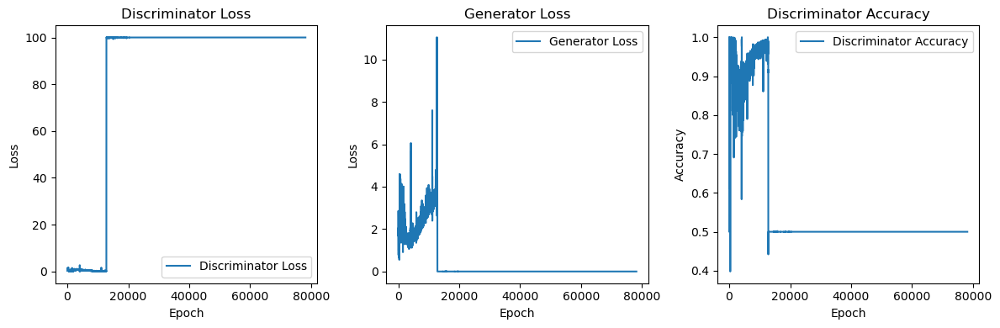

In [67]:
# Plotting
plt.figure(figsize=(12, 4))

# Plot Discriminator Loss
plt.subplot(1, 3, 1)
plt.plot(d_losses, label='Discriminator Loss')
plt.title('Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Generator Loss
plt.subplot(1, 3, 2)
plt.plot(g_losses, label='Generator Loss')
plt.title('Generator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Discriminator Accuracy
plt.subplot(1, 3, 3)
plt.plot(d_accuracies, label='Discriminator Accuracy')
plt.title('Discriminator Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [68]:
# Platting the values again

In [69]:
# Now we can calculate the averages and plot the values as previously done
# Calculate average values per epoch
avg_real_accuracies = []
avg_fake_accuracies = []
avg_d_losses = []
avg_g_losses = []

In [70]:
# Helper function for averaging
def calculate_average(values):
    return np.mean(values) if values else 0

current_epoch = 0
temp_real_acc = []
temp_fake_acc = []
temp_d_loss = []
temp_g_loss = []

In [71]:
for i in range(len(epochs)):
    if epochs[i] != current_epoch:
        # Calculate averages for the current epoch and reset lists
        avg_real_accuracies.append(calculate_average(temp_real_acc))
        avg_fake_accuracies.append(calculate_average(temp_fake_acc))
        avg_d_losses.append(calculate_average(temp_d_loss))
        avg_g_losses.append(calculate_average(temp_g_loss))

        temp_real_acc = []
        temp_fake_acc = []
        temp_d_loss = []
        temp_g_loss = []
        current_epoch = epochs[i]

    # Append current values
    temp_real_acc.append(real_accuracy_list[i])
    temp_fake_acc.append(fake_accuracy_list[i])
    temp_d_loss.append(d_losses[i])
    temp_g_loss.append(g_losses[i])

In [72]:
# Add averages for the last epoch
avg_real_accuracies.append(calculate_average(temp_real_acc))
avg_fake_accuracies.append(calculate_average(temp_fake_acc))
avg_d_losses.append(calculate_average(temp_d_loss))
avg_g_losses.append(calculate_average(temp_g_loss))

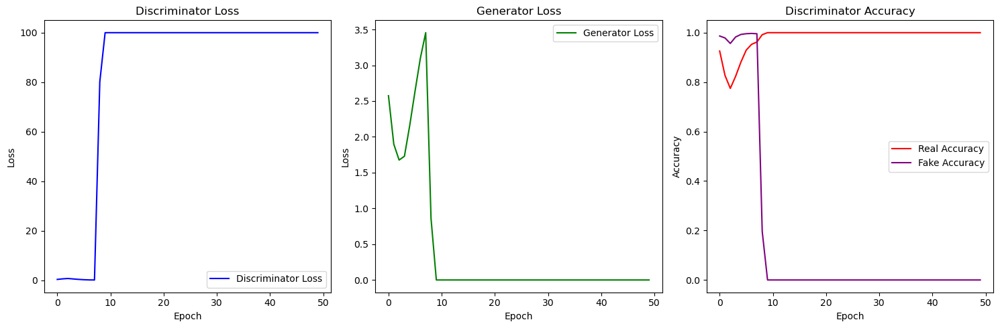

In [73]:
# Unique epochs for plotting
unique_epochs = sorted(list(set(epochs)))

# Plotting the graphs
plt.figure(figsize=(15, 5))

# Plot Discriminator Loss
plt.subplot(1, 3, 1)
plt.plot(unique_epochs, avg_d_losses, label='Discriminator Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Discriminator Loss')
plt.legend()

# Plot Generator Loss
plt.subplot(1, 3, 2)
plt.plot(unique_epochs, avg_g_losses, label='Generator Loss', color='green')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Generator Loss')
plt.legend()

# Plot Discriminator Accuracy
plt.subplot(1, 3, 3)
plt.plot(unique_epochs, avg_real_accuracies, label='Real Accuracy', color='red')
plt.plot(unique_epochs, avg_fake_accuracies, label='Fake Accuracy', color='purple')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Discriminator Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


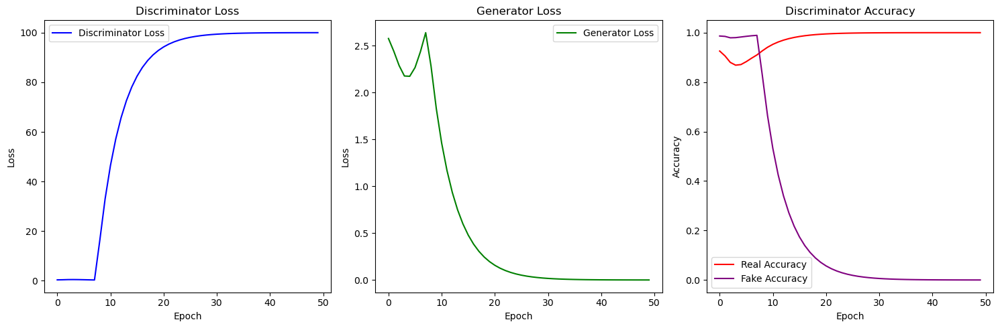

In [74]:
import matplotlib.pyplot as plt
import numpy as np


# Unique epochs for plotting
unique_epochs = sorted(list(set(epochs)))

# Smoothing the lines
def smooth_curve(points, factor=0.8):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            previous = smoothed_points[-1]
            smoothed_points.append(previous * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points

# Applying smoothing
smoothed_d_losses = smooth_curve(avg_d_losses)
smoothed_g_losses = smooth_curve(avg_g_losses)
smoothed_real_accuracies = smooth_curve(avg_real_accuracies)
smoothed_fake_accuracies = smooth_curve(avg_fake_accuracies)

# Plotting the graphs with enhanced visualization
plt.figure(figsize=(15, 5))

# Plot Discriminator Loss
plt.subplot(1, 3, 1)
plt.plot(unique_epochs, smoothed_d_losses, label='Discriminator Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Discriminator Loss')
plt.legend()

# Plot Generator Loss
plt.subplot(1, 3, 2)
plt.plot(unique_epochs, smoothed_g_losses, label='Generator Loss', color='green')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Generator Loss')
plt.legend()

# Plot Discriminator Accuracy
plt.subplot(1, 3, 3)
plt.plot(unique_epochs, smoothed_real_accuracies, label='Real Accuracy', color='red')
plt.plot(unique_epochs, smoothed_fake_accuracies, label='Fake Accuracy', color='purple')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Discriminator Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


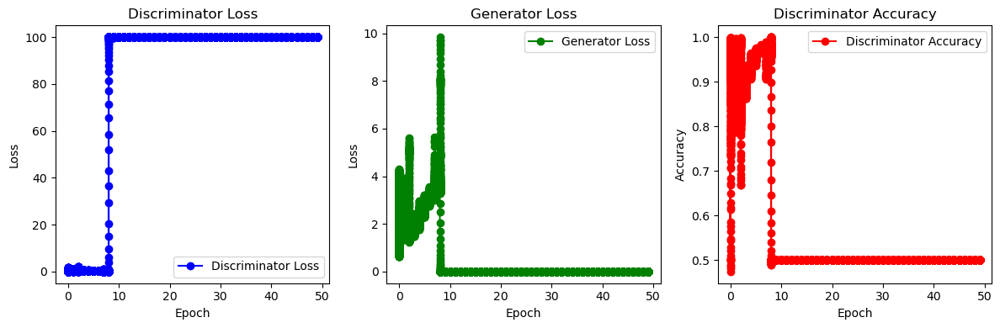

In [75]:
# Applying smoothing to these data as well
smoothed_d_losses1 = smooth_curve(d_losses)
smoothed_g_losses1 = smooth_curve(g_losses)
smoothed_d_accuracies1 = smooth_curve(d_accuracies)

# Enhanced plotting
plt.figure(figsize=(12, 4))

# Plot Discriminator Loss
plt.subplot(1, 3, 1)
plt.plot(epochs, smoothed_d_losses1, label='Discriminator Loss', color='blue', marker='o')
plt.title('Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Generator Loss
plt.subplot(1, 3, 2)
plt.plot(epochs, smoothed_g_losses1, label='Generator Loss', color='green', marker='o')
plt.title('Generator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Discriminator Accuracy
plt.subplot(1, 3, 3)
plt.plot(epochs, smoothed_d_accuracies1, label='Discriminator Accuracy', color='red', marker='o')
plt.title('Discriminator Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


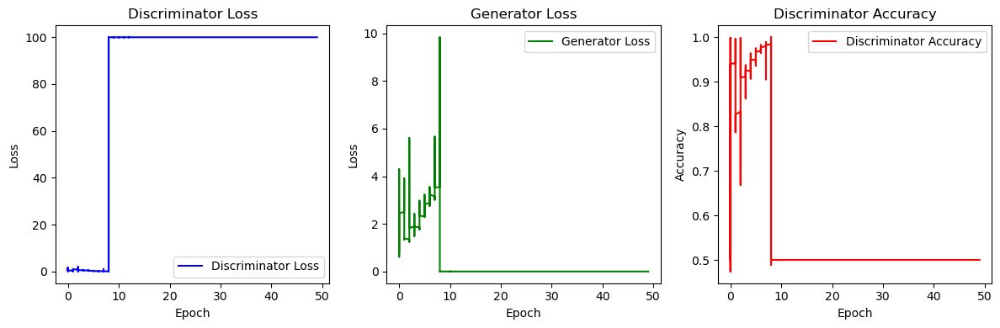

In [76]:
# Applying smoothing to these data as well
smoothed_d_losses1 = smooth_curve(d_losses)
smoothed_g_losses1 = smooth_curve(g_losses)
smoothed_d_accuracies1 = smooth_curve(d_accuracies)

# Enhanced plotting
plt.figure(figsize=(12, 4))

# Plot Discriminator Loss
plt.subplot(1, 3, 1)
plt.plot(epochs, smoothed_d_losses1, label='Discriminator Loss', color='blue')
plt.title('Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Generator Loss
plt.subplot(1, 3, 2)
plt.plot(epochs, smoothed_g_losses1, label='Generator Loss', color='green')
plt.title('Generator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Discriminator Accuracy
plt.subplot(1, 3, 3)
plt.plot(epochs, smoothed_d_accuracies1, label='Discriminator Accuracy', color='red')
plt.title('Discriminator Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


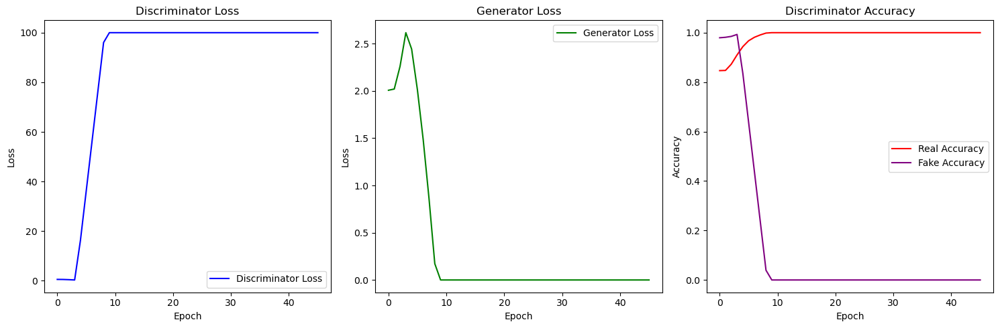

In [80]:
import matplotlib.pyplot as plt
import numpy as np

# Unique epochs for plotting
unique_epochs = sorted(list(set(epochs)))
window_size = 5

# Smoothing the lines with Simple Moving Average
def smooth_curve_SMA(points, window_size=5):
    window = np.ones(window_size) / window_size
    return np.convolve(points, window, 'valid')

# Applying SMA smoothing
smoothed_d_losses = smooth_curve_SMA(avg_d_losses)
smoothed_g_losses = smooth_curve_SMA(avg_g_losses)
smoothed_real_accuracies = smooth_curve_SMA(avg_real_accuracies)
smoothed_fake_accuracies = smooth_curve_SMA(avg_fake_accuracies)

# Adjusting 'unique_epochs' for the reduced size after convolution
adjusted_epochs = unique_epochs[:len(unique_epochs) - window_size + 1]

# Plotting the graphs with enhanced visualization
plt.figure(figsize=(15, 5))

# Plot Discriminator Loss
plt.subplot(1, 3, 1)
plt.plot(adjusted_epochs, smoothed_d_losses, label='Discriminator Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Discriminator Loss')
plt.legend()

# Plot Generator Loss
plt.subplot(1, 3, 2)
plt.plot(adjusted_epochs, smoothed_g_losses, label='Generator Loss', color='green')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Generator Loss')
plt.legend()

# Plot Discriminator Accuracy
plt.subplot(1, 3, 3)
plt.plot(adjusted_epochs, smoothed_real_accuracies, label='Real Accuracy', color='red')
plt.plot(adjusted_epochs, smoothed_fake_accuracies, label='Fake Accuracy', color='purple')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Discriminator Accuracy')
plt.legend()

plt.tight_layout()
plt.show()
